In [13]:
import sys
import os
import timeit

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import tensorflow as tf
#from dmd_machine.dmd_ae_machine import DMDMachine
#from dmd_machine.loss_function import LossFunction
#from data.Data import DataMaker
from datetime import date
from tensorflow.keras.models import model_from_json
from sklearn.model_selection import train_test_split
#from return_stats import *
#from create_plots import *
from tensorflow import keras
from datetime import date
import pickle
import joblib
import time

plt.rcParams['figure.figsize'] = [15, 8]
plt.rcParams['figure.facecolor'] = 'white'
%matplotlib inline
print(os.getcwd())

C:\Users\Chuanhua\ROM-DMD-LSTM


In [6]:
#Split the data into two parts for training and prediction validation
import math
import joblib
training_data_whole = joblib.load(open('./data/case1data/original_data.pkl', 'rb'))
print(training_data_whole.shape)

two_dimension_data_0=training_data_whole.reshape(training_data_whole.shape[0],training_data_whole.shape[1]*2)[0:1601]
two_dimension_data=training_data_whole.reshape(training_data_whole.shape[0],training_data_whole.shape[1]*2)[1601:2001]

print(two_dimension_data_0.shape)
print(two_dimension_data.shape)

print(two_dimension_data_0[1600,1000:1010])
print(two_dimension_data[0,1000:1010])

(2002, 54536, 2)
(1601, 109072)
(400, 109072)
[0.85677987 0.40625797 0.91496118 0.36177143 0.78844043 0.39760978
 0.91596094 0.40274781 0.83172319 0.25106557]
[0.85637417 0.4028     0.91431973 0.36235413 0.78809425 0.39292507
 0.91499758 0.40646753 0.83217348 0.25297039]


In [7]:
#Using the POD to study the code length correspoonding with percentage of energy captured
import sklearn
from sklearn.decomposition import PCA
pca = PCA(n_components=0.90, svd_solver='full')
pca.fit(two_dimension_data_0)
print(pca.explained_variance_ratio_)
pca_data=pca.transform(two_dimension_data_0)
print(pca_data.shape)

[0.39574573 0.22030164 0.12406537 0.04370959 0.03044776 0.01748302
 0.01693723 0.01578817 0.01110551 0.0098475  0.00759416 0.00641161
 0.00611178]
(1601, 13)


/home/chuanhua/Experiments/ROM_LSTM
time spend for reduction: 13.95764112300003
Reconstruction Error (Normalized Frobenius Norm): 0.0846
time spend for reduction: 15.950016285999936
Reconstruction Error (Normalized Frobenius Norm): 0.0613
time spend for reduction: 17.97694333300001
Reconstruction Error (Normalized Frobenius Norm): 0.0476


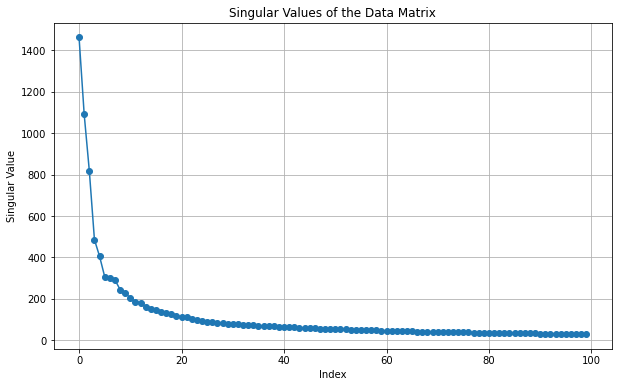

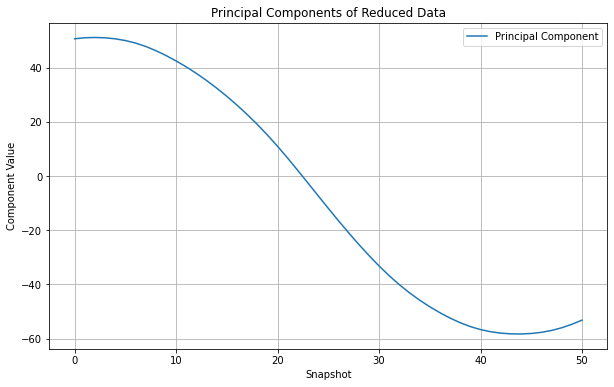

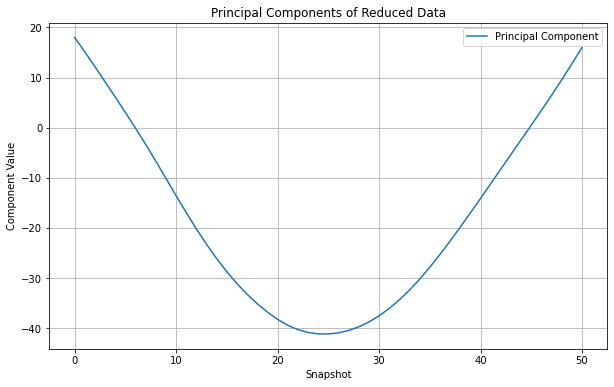

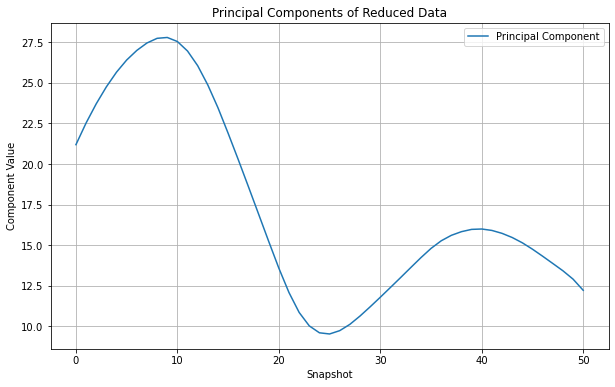

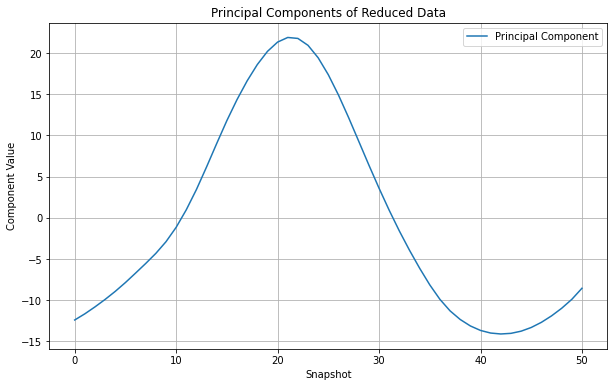

...

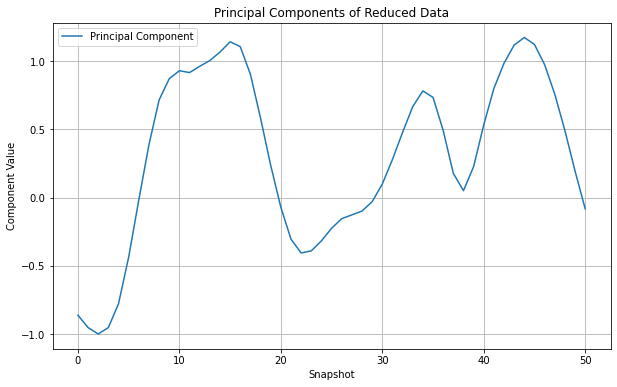

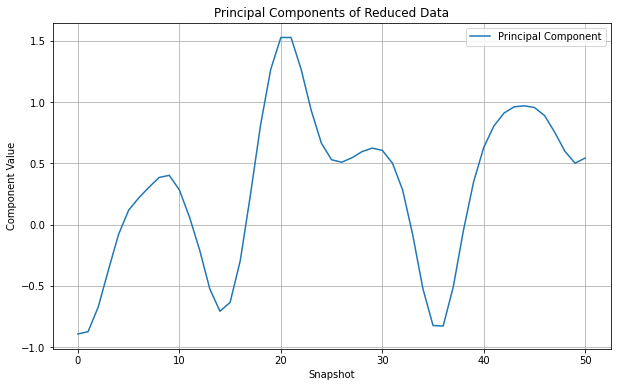

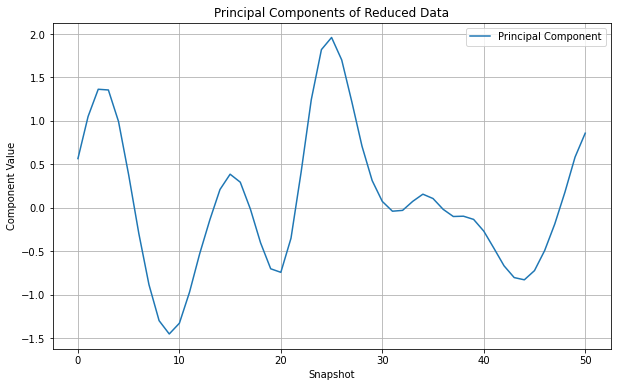

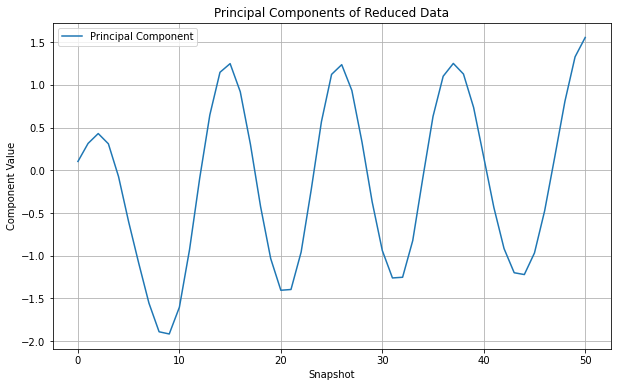

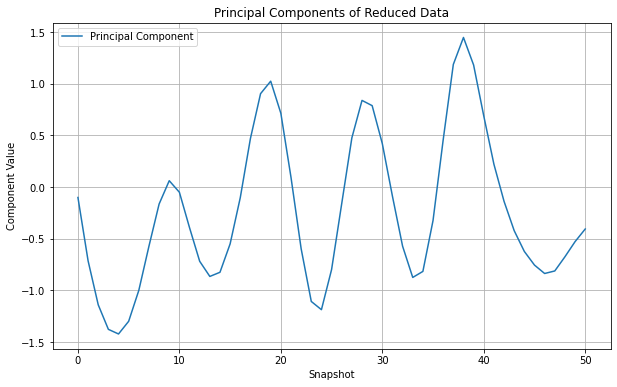

In [12]:
#POD model for comparison with SAE to display the effectiveness of SAE in order reduce.
import numpy as np
import matplotlib.pyplot as plt
import timeit
import pickle
import joblib

import os
print(os.getcwd()) 

# Step 1: Prepare the Data
data = two_dimension_data_0  # Replace this with your actual data


#start time
start_time=timeit.default_timer()
# Step 2: Compute the Mean
mean_data = np.mean(data, axis=0)  # Mean of each column (feature)

# Step 3: Center the Data
data_centered = data - mean_data

# Step 4: Compute the Covariance Matrix
# Note: In practice, for large data, we often use a different method to compute the SVD directly.
U, S, Vt = np.linalg.svd(data_centered, full_matrices=False)

# U is (1600, 1600), S is (1600,), Vt is (1600, 109072)

# Step 5: Compute POD Modes (Principal Components)
# Vt.T gives the right singular vectors, which are the principal directions
# Let's select the top k components

k_collection = [13,33,66]  # Number of principal components to keep (hyperparameter, change as needed)
for k in k_collection:
    POD_modes = Vt[:k, :]  # Top k POD modes

    # Step 6: Project the Data onto the Reduced Dimensional Space
    # This gives us the reduced data representation in the lower-dimensional space
    data_reduced = np.dot(data_centered, POD_modes.T)
    pickle.dump(data_reduced, open("./Temp_data_Case1/reduced_data_" + str(k) + "_POD.pkl", "wb"))

    #end time
    end_time=timeit.default_timer()
    print("time spend for reduction:",end_time - start_time)

    # Step 7: Reconstruct the Data (Optional, to evaluate effectiveness)
    # This is done by projecting back to the original space
    data_reconstructed = np.dot(data_reduced, POD_modes) + mean_data
    pickle.dump(data_reconstructed, open("./Temp_data_Case1/reconstructed_data_" + str(k) + "_POD.pkl", "wb"))

    # Step 8: Evaluate Reconstruction Error (Optional)
    reconstruction_error = np.linalg.norm(data - data_reconstructed) / np.linalg.norm(data)
    print(f"Reconstruction Error (Normalized Frobenius Norm): {reconstruction_error:.4f}")

# Step 9: Visualize the Singular Values (Optional)
plt.figure(figsize=(10, 6))
plt.plot(S[:100], marker='o')
plt.title('Singular Values of the Data Matrix')
plt.xlabel('Index')
plt.ylabel('Singular Value')
plt.grid(True)
plt.show()

# Step 10: Visualize the Data Reduction (Optional)
# You can plot the reduced data or the reconstruction error if needed
data_reduced = joblib.load(open("./Temp_data_Case1/reduced_data_" + str(k) + "_POD.pkl",'rb'))
for idx in range(data_reduced.shape[1]):
    plt.figure(figsize=(10, 6))
    plt.plot(data_reduced[1550:, idx], label='Principal Component')
    plt.title('Principal Components of Reduced Data')
    plt.xlabel('Snapshot')
    plt.ylabel('Component Value')
    plt.legend()
    plt.grid(True)
    plt.show()

# ***SAE Model***

In [11]:
#The python code of the stacked autoencoder (SAE) model
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import (
    Input,
    Dense,
    LSTM,
    Lambda,
    Dropout,
    Flatten,
    Reshape,
    Conv2DTranspose,
)
from tensorflow.keras.models import load_model, Sequential, Model
class StackAutoencoder(object):
	"""docstring for Stack_Autoencoder"""
	def __init__(self):
		super(StackAutoencoder, self).__init__()


	def save_model(self, model, model_name, save_dir):
	# function for saving model

		if not os.path.isdir(save_dir):
			os.makedirs(save_dir)
		model_path = os.path.join(save_dir, model_name)
		model.save(model_path)


	def encoder_model(self, input_dim, encoding_dim):

		#encoded = Dense(encoding_dim * 32, activation='relu')(input_dim)
		#encoded = Dense(encoding_dim * 16, activation='relu')(encoded)
		#encoded = Dense(encoding_dim * 8, activation='relu')(encoded)
		encoded = Dense(encoding_dim * 8, activation='relu')(input_dim)
		encoded = Dense(encoding_dim * 4, activation='relu')(encoded)
		encoded = Dense(encoding_dim * 2, activation='relu')(encoded)
		code = Dense(encoding_dim)(encoded)

		return code

	def decoder_model(self, vtu_data, code, encoding_dim):

		decoded = Dense(encoding_dim * 2, activation='relu')(code)
		decoded = Dense(encoding_dim * 4, activation='relu')(decoded)
		decoded = Dense(encoding_dim * 8, activation='relu')(decoded)
		#decoded = Dense(encoding_dim * 16, activation='relu')(decoded)
		#decoded = Dense(encoding_dim * 32, activation='relu')(decoded)
		decoded = Dense(vtu_data.shape[1], activation='sigmoid')(decoded)

		return decoded


	def load_model(self, vtu_data, encoding_dim):

		input_dim = Input(shape=(vtu_data.shape[1]))
		encoder_output = self.encoder_model(input_dim, encoding_dim)
		self.encoder = Model(inputs=input_dim, outputs=encoder_output, name='encoder') # from input to code
		# self.encoder.summary()


		# Create a encoder model 
		decoder_input = Input(shape=(encoding_dim)) #the input of the encoder 
		decoder_output = self.decoder_model(vtu_data, decoder_input, encoding_dim)
		self.decoder = Model(inputs=decoder_input, outputs=decoder_output, name="decoder")
		# self.decoder.summary()


		# connect the encoder and decoder model
		encoder_img = self.encoder(input_dim) #call the encoder model
		decoder_img = self.decoder(encoder_img) #call the decoder model
		self.autoencoder = Model(inputs=input_dim, outputs=decoder_img, name='autoencoder') #construct the autoencoder model


	def train_model(self, train, validation, test, epochs, batch_size, model_save_folder, encoder_file_name, decoder_file_name, AE_file_name):
		# def generate_arrays(x,batch_size):
		# 	while 1:
		# 		for idx in range(int(np.ceil(len(x)/batch_size))):
		# 			x_excerpt = x[idx*batch_size:(idx+1)*batch_size,...]
		# 			yield x_excerpt, x_excerpt


		check_model = ModelCheckpoint(model_save_folder + '/' + AE_file_name,
									monitor='val_loss',
									save_best_only=True,
									verbose=1)
		reduce_LR = ReduceLROnPlateau(monitor='val_loss',
									factor=0.5,
									patience=5,
									verbose=1,
									mode='min',
									min_delta=1e-10,
									cooldown=0,
									min_lr=0)

		# self.history_record = self.autoencoder.fit(generate_arrays(train, batch_size),
		# 													steps_per_epoch = np.ceil(len(train)/batch_size),
		# 													epochs = epochs,
		# 													callbacks=[check_model, reduce_LR],
		# 													# validation_split = 0.2)
		# 													validation_data=(validation, validation))
		self.history_record = self.autoencoder.fit(train, train,
                        epochs = epochs,
                        batch_size = batch_size,
                        callbacks=[check_model, reduce_LR],
                        validation_data=(validation, validation))

		# draw_Acc_Loss(self.history_record)
		self.save_model(self.encoder, encoder_file_name, model_save_folder)
		self.save_model(self.decoder, decoder_file_name, model_save_folder)
		self.save_model(self.autoencoder, AE_file_name, model_save_folder)
		self.save_model(self.autoencoder, AE_file_name, model_save_folder)

		print(" DeepAE model trained successfully")

		scores = self.autoencoder.evaluate(test, test, batch_size, verbose=1)

		print('Test loss:', scores[0], '\nTest accuracy:', scores[1])

In [12]:
scaled_data=two_dimension_data_0
print(scaled_data.shape)
pred_time_steps=400

(1601, 109072)


# **Train AE model**

In [16]:
#Train the SAE model
from sklearn.model_selection import train_test_split

model_save_folder = './AE_Models_case1'

encoding_dim_array=[13,33,66]#90%,95%,97%
time_spending=[]
for encoding_dim in encoding_dim_array:    
    #start time
    start_time=timeit.default_timer()
    
    encoder_file_name = 'AE_encoder_dim' + str(encoding_dim) # name of encoder model
    decoder_file_name = 'AE_decoder_dim' + str(encoding_dim) # name of decoder model
    AE_file_name = 'AE_dim' + str(encoding_dim) # name of AE whole model
    
    batch_size = 32
    epochs = 300

    train_set, test = train_test_split(scaled_data, test_size=0.2, random_state=1)
    train, validation = train_test_split(train_set, test_size=0.1, random_state=2)
    print(train.shape)

    ae = StackAutoencoder()

    if os.path.exists(model_save_folder + "/" + AE_file_name):

        ae.autoencoder = load_model(model_save_folder + "/" + AE_file_name)
        ae.encoder = load_model(model_save_folder + "/" + encoder_file_name)
        ae.decoder = load_model(model_save_folder + "/" + decoder_file_name)

        ae.autoencoder.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
        ae.autoencoder.summary()

        ae.train_model(train, validation, test, epochs, batch_size, model_save_folder, encoder_file_name, decoder_file_name, AE_file_name)


    else:
        ae.load_model(train, encoding_dim)
        ae.autoencoder.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
        ae.autoencoder.summary()
        
        ae.train_model(train, validation, test, epochs, batch_size, model_save_folder, encoder_file_name, decoder_file_name, AE_file_name)

    #end time
    end_time=timeit.default_timer()
    print("time spend for prediction:",end_time - start_time)
    time_spending.append(end_time - start_time)
print("time_spending",time_spending)

(1152, 109072)
Model: "autoencoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 109072)]          0         
_________________________________________________________________
encoder (Functional)         (None, 13)                11350781  
_________________________________________________________________
decoder (Functional)         (None, 109072)            11459840  
Total params: 22,810,621
Trainable params: 22,810,621
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
36/36 [==============================] - 2s 53ms/step - loss: 0.0388 - accuracy: 0.0000e+00 - val_loss: 0.0310 - val_accuracy: 0.0000e+00

Epoch 00001: val_loss improved from inf to 0.03096, saving model to ./AE_Models_case2/AE_dim13
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim13/assets
Epoch 2/300
36/36 [========================

INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim13/assets
Epoch 26/300
36/36 [==============================] - 2s 53ms/step - loss: 0.0021 - accuracy: 0.0000e+00 - val_loss: 0.0023 - val_accuracy: 0.0000e+00

Epoch 00026: val_loss improved from 0.00228 to 0.00227, saving model to ./AE_Models_case2/AE_dim13
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim13/assets
Epoch 27/300
36/36 [==============================] - 2s 52ms/step - loss: 0.0021 - accuracy: 0.0000e+00 - val_loss: 0.0024 - val_accuracy: 0.0000e+00

Epoch 00027: val_loss did not improve from 0.00227
Epoch 28/300
36/36 [==============================] - 2s 52ms/step - loss: 0.0020 - accuracy: 0.0000e+00 - val_loss: 0.0022 - val_accuracy: 0.0000e+00

Epoch 00028: val_loss improved from 0.00227 to 0.00222, saving model to ./AE_Models_case2/AE_dim13
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim13/assets
Epoch 29/300
36/36 [==============================] - 2s 51ms/step - loss: 0.0020 - accu

Epoch 57/300
36/36 [==============================] - 2s 51ms/step - loss: 0.0016 - accuracy: 0.0000e+00 - val_loss: 0.0017 - val_accuracy: 0.0000e+00

Epoch 00057: val_loss did not improve from 0.00175
Epoch 58/300
36/36 [==============================] - 2s 51ms/step - loss: 0.0016 - accuracy: 0.0000e+00 - val_loss: 0.0017 - val_accuracy: 0.0000e+00

Epoch 00058: val_loss improved from 0.00175 to 0.00172, saving model to ./AE_Models_case2/AE_dim13
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim13/assets
Epoch 59/300
36/36 [==============================] - 2s 52ms/step - loss: 0.0016 - accuracy: 0.0000e+00 - val_loss: 0.0018 - val_accuracy: 0.0000e+00

Epoch 00059: val_loss did not improve from 0.00172
Epoch 60/300
36/36 [==============================] - 2s 52ms/step - loss: 0.0016 - accuracy: 0.0000e+00 - val_loss: 0.0017 - val_accuracy: 0.0000e+00

Epoch 00060: val_loss improved from 0.00172 to 0.00168, saving model to ./AE_Models_case2/AE_dim13
INFO:tensorflow:Assets 


Epoch 00087: val_loss did not improve from 0.00145
Epoch 88/300
36/36 [==============================] - 2s 53ms/step - loss: 0.0013 - accuracy: 0.0000e+00 - val_loss: 0.0015 - val_accuracy: 0.0000e+00

Epoch 00088: val_loss did not improve from 0.00145
Epoch 89/300
36/36 [==============================] - 2s 51ms/step - loss: 0.0013 - accuracy: 0.0000e+00 - val_loss: 0.0015 - val_accuracy: 0.0000e+00

Epoch 00089: val_loss improved from 0.00145 to 0.00145, saving model to ./AE_Models_case2/AE_dim13
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim13/assets
Epoch 90/300
36/36 [==============================] - 2s 53ms/step - loss: 0.0013 - accuracy: 0.0000e+00 - val_loss: 0.0014 - val_accuracy: 0.0000e+00

Epoch 00090: val_loss improved from 0.00145 to 0.00144, saving model to ./AE_Models_case2/AE_dim13
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim13/assets
Epoch 91/300
36/36 [==============================] - 2s 52ms/step - loss: 0.0013 - accuracy: 0.0000e+00 


Epoch 00120: val_loss did not improve from 0.00137
Epoch 121/300
36/36 [==============================] - 2s 52ms/step - loss: 0.0012 - accuracy: 0.0000e+00 - val_loss: 0.0014 - val_accuracy: 0.0000e+00

Epoch 00121: val_loss improved from 0.00137 to 0.00136, saving model to ./AE_Models_case2/AE_dim13
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim13/assets
Epoch 122/300
36/36 [==============================] - 2s 52ms/step - loss: 0.0012 - accuracy: 0.0000e+00 - val_loss: 0.0014 - val_accuracy: 0.0000e+00

Epoch 00122: val_loss improved from 0.00136 to 0.00136, saving model to ./AE_Models_case2/AE_dim13
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim13/assets
Epoch 123/300
36/36 [==============================] - 2s 52ms/step - loss: 0.0012 - accuracy: 0.0000e+00 - val_loss: 0.0014 - val_accuracy: 0.0000e+00

Epoch 00123: val_loss improved from 0.00136 to 0.00136, saving model to ./AE_Models_case2/AE_dim13
INFO:tensorflow:Assets written to: ./AE_Models_case2/A

Epoch 152/300
36/36 [==============================] - 2s 53ms/step - loss: 0.0011 - accuracy: 0.0000e+00 - val_loss: 0.0013 - val_accuracy: 0.0000e+00

Epoch 00152: val_loss did not improve from 0.00126
Epoch 153/300
36/36 [==============================] - 2s 52ms/step - loss: 0.0011 - accuracy: 0.0000e+00 - val_loss: 0.0013 - val_accuracy: 0.0000e+00

Epoch 00153: val_loss did not improve from 0.00126
Epoch 154/300
36/36 [==============================] - 2s 52ms/step - loss: 0.0011 - accuracy: 0.0000e+00 - val_loss: 0.0013 - val_accuracy: 0.0000e+00

Epoch 00154: val_loss improved from 0.00126 to 0.00126, saving model to ./AE_Models_case2/AE_dim13
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim13/assets
Epoch 155/300
36/36 [==============================] - 2s 51ms/step - loss: 0.0011 - accuracy: 0.0000e+00 - val_loss: 0.0013 - val_accuracy: 0.0000e+00

Epoch 00155: val_loss did not improve from 0.00126
Epoch 156/300
36/36 [==============================] - 2s 52ms/step

36/36 [==============================] - 2s 52ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0012 - val_accuracy: 0.0000e+00

Epoch 00216: val_loss did not improve from 0.00120
Epoch 217/300
36/36 [==============================] - 2s 51ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0012 - val_accuracy: 0.0000e+00

Epoch 00217: val_loss improved from 0.00120 to 0.00119, saving model to ./AE_Models_case2/AE_dim13
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim13/assets
Epoch 218/300
36/36 [==============================] - 2s 51ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0012 - val_accuracy: 0.0000e+00

Epoch 00218: val_loss did not improve from 0.00119
Epoch 219/300
36/36 [==============================] - 2s 53ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0012 - val_accuracy: 0.0000e+00

Epoch 00219: val_loss did not improve from 0.00119
Epoch 220/300
36/36 [==============================] - 2s 52ms/step - loss: 0.001

Epoch 282/300
36/36 [==============================] - 2s 50ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0012 - val_accuracy: 0.0000e+00

Epoch 00282: val_loss did not improve from 0.00117
Epoch 283/300
36/36 [==============================] - 2s 51ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0012 - val_accuracy: 0.0000e+00

Epoch 00283: val_loss did not improve from 0.00117
Epoch 284/300
36/36 [==============================] - 2s 51ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0012 - val_accuracy: 0.0000e+00

Epoch 00284: val_loss did not improve from 0.00117
Epoch 285/300
36/36 [==============================] - 2s 51ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0012 - val_accuracy: 0.0000e+00

Epoch 00285: val_loss did not improve from 0.00117
Epoch 286/300
36/36 [==============================] - 2s 51ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0012 - val_accuracy: 0.0000e+00

Epoch 00286: val_loss did not i

Epoch 8/300
36/36 [==============================] - 4s 118ms/step - loss: 0.0029 - accuracy: 0.0000e+00 - val_loss: 0.0029 - val_accuracy: 0.0000e+00

Epoch 00008: val_loss improved from 0.00327 to 0.00292, saving model to ./AE_Models_case2/AE_dim33
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim33/assets
Epoch 9/300
36/36 [==============================] - 4s 119ms/step - loss: 0.0028 - accuracy: 0.0000e+00 - val_loss: 0.0030 - val_accuracy: 0.0000e+00

Epoch 00009: val_loss did not improve from 0.00292
Epoch 10/300
36/36 [==============================] - 4s 118ms/step - loss: 0.0026 - accuracy: 0.0000e+00 - val_loss: 0.0025 - val_accuracy: 0.0000e+00

Epoch 00010: val_loss improved from 0.00292 to 0.00254, saving model to ./AE_Models_case2/AE_dim33
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim33/assets
Epoch 11/300
36/36 [==============================] - 4s 120ms/step - loss: 0.0024 - accuracy: 0.0000e+00 - val_loss: 0.0025 - val_accuracy: 0.0000e+00

Epo

INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim33/assets
Epoch 69/300
36/36 [==============================] - 4s 118ms/step - loss: 8.6888e-04 - accuracy: 0.0000e+00 - val_loss: 0.0010 - val_accuracy: 0.0000e+00

Epoch 00069: val_loss did not improve from 0.00101
Epoch 70/300
36/36 [==============================] - 4s 118ms/step - loss: 8.7337e-04 - accuracy: 0.0000e+00 - val_loss: 0.0010 - val_accuracy: 0.0000e+00

Epoch 00070: val_loss did not improve from 0.00101
Epoch 71/300
36/36 [==============================] - 4s 117ms/step - loss: 8.7296e-04 - accuracy: 0.0000e+00 - val_loss: 0.0010 - val_accuracy: 0.0000e+00

Epoch 00071: val_loss did not improve from 0.00101
Epoch 72/300
36/36 [==============================] - 4s 118ms/step - loss: 8.7411e-04 - accuracy: 0.0000e+00 - val_loss: 0.0010 - val_accuracy: 0.0000e+00

Epoch 00072: val_loss did not improve from 0.00101
Epoch 73/300
36/36 [==============================] - 4s 119ms/step - loss: 8.5994e-04 - accuracy: 


Epoch 00097: val_loss did not improve from 0.00091
Epoch 98/300
36/36 [==============================] - 4s 118ms/step - loss: 7.6468e-04 - accuracy: 0.0000e+00 - val_loss: 9.1737e-04 - val_accuracy: 0.0000e+00

Epoch 00098: val_loss did not improve from 0.00091
Epoch 99/300
36/36 [==============================] - 4s 121ms/step - loss: 7.6570e-04 - accuracy: 0.0000e+00 - val_loss: 9.1863e-04 - val_accuracy: 0.0000e+00

Epoch 00099: val_loss did not improve from 0.00091
Epoch 100/300
36/36 [==============================] - 4s 118ms/step - loss: 7.6295e-04 - accuracy: 0.0000e+00 - val_loss: 9.0896e-04 - val_accuracy: 0.0000e+00

Epoch 00100: val_loss improved from 0.00091 to 0.00091, saving model to ./AE_Models_case2/AE_dim33
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim33/assets
Epoch 101/300
36/36 [==============================] - 4s 118ms/step - loss: 7.6649e-04 - accuracy: 0.0000e+00 - val_loss: 9.2693e-04 - val_accuracy: 0.0000e+00

Epoch 00101: val_loss did not im


Epoch 00128: val_loss did not improve from 0.00086
Epoch 129/300
36/36 [==============================] - 4s 120ms/step - loss: 7.1524e-04 - accuracy: 0.0000e+00 - val_loss: 8.5758e-04 - val_accuracy: 0.0000e+00

Epoch 00129: val_loss improved from 0.00086 to 0.00086, saving model to ./AE_Models_case2/AE_dim33
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim33/assets
Epoch 130/300
36/36 [==============================] - 4s 119ms/step - loss: 7.1226e-04 - accuracy: 0.0000e+00 - val_loss: 8.6311e-04 - val_accuracy: 0.0000e+00

Epoch 00130: val_loss did not improve from 0.00086
Epoch 131/300
36/36 [==============================] - 4s 118ms/step - loss: 7.1094e-04 - accuracy: 0.0000e+00 - val_loss: 8.6582e-04 - val_accuracy: 0.0000e+00

Epoch 00131: val_loss did not improve from 0.00086
Epoch 132/300
36/36 [==============================] - 4s 118ms/step - loss: 7.0699e-04 - accuracy: 0.0000e+00 - val_loss: 8.5749e-04 - val_accuracy: 0.0000e+00

Epoch 00132: val_loss improved

36/36 [==============================] - 4s 116ms/step - loss: 6.2910e-04 - accuracy: 0.0000e+00 - val_loss: 7.9574e-04 - val_accuracy: 0.0000e+00

Epoch 00191: val_loss improved from 0.00080 to 0.00080, saving model to ./AE_Models_case2/AE_dim33
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim33/assets
Epoch 192/300
36/36 [==============================] - 4s 116ms/step - loss: 6.2856e-04 - accuracy: 0.0000e+00 - val_loss: 7.9617e-04 - val_accuracy: 0.0000e+00

Epoch 00192: val_loss did not improve from 0.00080
Epoch 193/300
36/36 [==============================] - 4s 116ms/step - loss: 6.2865e-04 - accuracy: 0.0000e+00 - val_loss: 7.9545e-04 - val_accuracy: 0.0000e+00

Epoch 00193: val_loss improved from 0.00080 to 0.00080, saving model to ./AE_Models_case2/AE_dim33
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim33/assets
Epoch 194/300
36/36 [==============================] - 4s 116ms/step - loss: 6.2826e-04 - accuracy: 0.0000e+00 - val_loss: 7.9607e-04 - val_a

INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim33/assets
Epoch 222/300
36/36 [==============================] - 4s 115ms/step - loss: 6.2175e-04 - accuracy: 0.0000e+00 - val_loss: 7.9153e-04 - val_accuracy: 0.0000e+00

Epoch 00222: val_loss did not improve from 0.00079
Epoch 223/300
36/36 [==============================] - 4s 116ms/step - loss: 6.2161e-04 - accuracy: 0.0000e+00 - val_loss: 7.9112e-04 - val_accuracy: 0.0000e+00

Epoch 00223: val_loss improved from 0.00079 to 0.00079, saving model to ./AE_Models_case2/AE_dim33
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim33/assets
Epoch 224/300
36/36 [==============================] - 4s 116ms/step - loss: 6.2155e-04 - accuracy: 0.0000e+00 - val_loss: 7.9148e-04 - val_accuracy: 0.0000e+00

Epoch 00224: val_loss did not improve from 0.00079
Epoch 225/300
36/36 [==============================] - 4s 116ms/step - loss: 6.2137e-04 - accuracy: 0.0000e+00 - val_loss: 7.9159e-04 - val_accuracy: 0.0000e+00

Epoch 00225: 


Epoch 00254: val_loss did not improve from 0.00079

Epoch 00254: ReduceLROnPlateau reducing learning rate to 7.812500371073838e-06.
Epoch 255/300
36/36 [==============================] - 4s 117ms/step - loss: 6.1733e-04 - accuracy: 0.0000e+00 - val_loss: 7.8857e-04 - val_accuracy: 0.0000e+00

Epoch 00255: val_loss improved from 0.00079 to 0.00079, saving model to ./AE_Models_case2/AE_dim33
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim33/assets
Epoch 256/300
36/36 [==============================] - 4s 116ms/step - loss: 6.1704e-04 - accuracy: 0.0000e+00 - val_loss: 7.8851e-04 - val_accuracy: 0.0000e+00

Epoch 00256: val_loss improved from 0.00079 to 0.00079, saving model to ./AE_Models_case2/AE_dim33
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim33/assets
Epoch 257/300
36/36 [==============================] - 4s 115ms/step - loss: 6.1704e-04 - accuracy: 0.0000e+00 - val_loss: 7.8873e-04 - val_accuracy: 0.0000e+00

Epoch 00257: val_loss did not improve from 0.


Epoch 00286: val_loss did not improve from 0.00079
Epoch 287/300
36/36 [==============================] - 4s 117ms/step - loss: 6.1513e-04 - accuracy: 0.0000e+00 - val_loss: 7.8761e-04 - val_accuracy: 0.0000e+00

Epoch 00287: val_loss did not improve from 0.00079
Epoch 288/300
36/36 [==============================] - 4s 115ms/step - loss: 6.1509e-04 - accuracy: 0.0000e+00 - val_loss: 7.8770e-04 - val_accuracy: 0.0000e+00

Epoch 00288: val_loss did not improve from 0.00079
Epoch 289/300
36/36 [==============================] - 4s 116ms/step - loss: 6.1510e-04 - accuracy: 0.0000e+00 - val_loss: 7.8769e-04 - val_accuracy: 0.0000e+00

Epoch 00289: val_loss did not improve from 0.00079
Epoch 290/300
36/36 [==============================] - 4s 116ms/step - loss: 6.1508e-04 - accuracy: 0.0000e+00 - val_loss: 7.8764e-04 - val_accuracy: 0.0000e+00

Epoch 00290: val_loss did not improve from 0.00079

Epoch 00290: ReduceLROnPlateau reducing learning rate to 9.765625463842298e-07.
Epoch 291/300
3


Epoch 00041: val_loss improved from 0.00113 to 0.00112, saving model to ./AE_Models_case2/AE_dim66
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim66/assets
Epoch 42/300
36/36 [==============================] - 8s 222ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0011 - val_accuracy: 0.0000e+00

Epoch 00042: val_loss did not improve from 0.00112
Epoch 43/300
36/36 [==============================] - 8s 222ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0012 - val_accuracy: 0.0000e+00

Epoch 00043: val_loss did not improve from 0.00112
Epoch 44/300
36/36 [==============================] - 8s 221ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0011 - val_accuracy: 0.0000e+00

Epoch 00044: val_loss did not improve from 0.00112
Epoch 45/300
36/36 [==============================] - 8s 222ms/step - loss: 0.0010 - accuracy: 0.0000e+00 - val_loss: 0.0011 - val_accuracy: 0.0000e+00

Epoch 00045: val_loss did not improve from 0.00112
Epoch 46/300
36

36/36 [==============================] - 8s 221ms/step - loss: 7.0040e-04 - accuracy: 0.0000e+00 - val_loss: 8.4558e-04 - val_accuracy: 0.0000e+00

Epoch 00101: val_loss improved from 0.00085 to 0.00085, saving model to ./AE_Models_case2/AE_dim66
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim66/assets
Epoch 102/300
36/36 [==============================] - 8s 222ms/step - loss: 6.9707e-04 - accuracy: 0.0000e+00 - val_loss: 8.4605e-04 - val_accuracy: 0.0000e+00

Epoch 00102: val_loss did not improve from 0.00085
Epoch 103/300
36/36 [==============================] - 8s 223ms/step - loss: 7.0058e-04 - accuracy: 0.0000e+00 - val_loss: 8.5429e-04 - val_accuracy: 0.0000e+00

Epoch 00103: val_loss did not improve from 0.00085
Epoch 104/300
36/36 [==============================] - 8s 222ms/step - loss: 6.9312e-04 - accuracy: 0.0000e+00 - val_loss: 8.4351e-04 - val_accuracy: 0.0000e+00

Epoch 00104: val_loss improved from 0.00085 to 0.00084, saving model to ./AE_Models_case2/AE_dim

Epoch 131/300
36/36 [==============================] - 8s 221ms/step - loss: 6.1060e-04 - accuracy: 0.0000e+00 - val_loss: 7.6804e-04 - val_accuracy: 0.0000e+00

Epoch 00131: val_loss did not improve from 0.00076
Epoch 132/300
36/36 [==============================] - 8s 221ms/step - loss: 6.0502e-04 - accuracy: 0.0000e+00 - val_loss: 7.7214e-04 - val_accuracy: 0.0000e+00

Epoch 00132: val_loss did not improve from 0.00076
Epoch 133/300
36/36 [==============================] - 8s 222ms/step - loss: 6.0750e-04 - accuracy: 0.0000e+00 - val_loss: 7.6355e-04 - val_accuracy: 0.0000e+00

Epoch 00133: val_loss improved from 0.00076 to 0.00076, saving model to ./AE_Models_case2/AE_dim66
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim66/assets
Epoch 134/300
36/36 [==============================] - 8s 223ms/step - loss: 6.0155e-04 - accuracy: 0.0000e+00 - val_loss: 7.5886e-04 - val_accuracy: 0.0000e+00

Epoch 00134: val_loss improved from 0.00076 to 0.00076, saving model to ./AE_Model

INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim66/assets
Epoch 163/300
36/36 [==============================] - 8s 223ms/step - loss: 5.5692e-04 - accuracy: 0.0000e+00 - val_loss: 7.2462e-04 - val_accuracy: 0.0000e+00

Epoch 00163: val_loss improved from 0.00073 to 0.00072, saving model to ./AE_Models_case2/AE_dim66
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim66/assets
Epoch 164/300
36/36 [==============================] - 8s 223ms/step - loss: 5.5535e-04 - accuracy: 0.0000e+00 - val_loss: 7.2537e-04 - val_accuracy: 0.0000e+00

Epoch 00164: val_loss did not improve from 0.00072
Epoch 165/300
36/36 [==============================] - 8s 222ms/step - loss: 5.5475e-04 - accuracy: 0.0000e+00 - val_loss: 7.2401e-04 - val_accuracy: 0.0000e+00

Epoch 00165: val_loss improved from 0.00072 to 0.00072, saving model to ./AE_Models_case2/AE_dim66
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim66/assets
Epoch 166/300
36/36 [==============================] - 8s 

36/36 [==============================] - 8s 221ms/step - loss: 5.4017e-04 - accuracy: 0.0000e+00 - val_loss: 7.1214e-04 - val_accuracy: 0.0000e+00

Epoch 00193: val_loss improved from 0.00071 to 0.00071, saving model to ./AE_Models_case2/AE_dim66
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim66/assets
Epoch 194/300
36/36 [==============================] - 8s 221ms/step - loss: 5.3989e-04 - accuracy: 0.0000e+00 - val_loss: 7.1354e-04 - val_accuracy: 0.0000e+00

Epoch 00194: val_loss did not improve from 0.00071
Epoch 195/300
36/36 [==============================] - 8s 221ms/step - loss: 5.3988e-04 - accuracy: 0.0000e+00 - val_loss: 7.1232e-04 - val_accuracy: 0.0000e+00

Epoch 00195: val_loss did not improve from 0.00071
Epoch 196/300
36/36 [==============================] - 8s 221ms/step - loss: 5.3900e-04 - accuracy: 0.0000e+00 - val_loss: 7.1373e-04 - val_accuracy: 0.0000e+00

Epoch 00196: val_loss did not improve from 0.00071
Epoch 197/300
36/36 [========================


Epoch 00224: val_loss did not improve from 0.00070
Epoch 225/300
36/36 [==============================] - 8s 223ms/step - loss: 5.2227e-04 - accuracy: 0.0000e+00 - val_loss: 7.0346e-04 - val_accuracy: 0.0000e+00

Epoch 00225: val_loss did not improve from 0.00070
Epoch 226/300
36/36 [==============================] - 8s 226ms/step - loss: 5.2205e-04 - accuracy: 0.0000e+00 - val_loss: 7.0252e-04 - val_accuracy: 0.0000e+00

Epoch 00226: val_loss did not improve from 0.00070
Epoch 227/300
36/36 [==============================] - 8s 225ms/step - loss: 5.2200e-04 - accuracy: 0.0000e+00 - val_loss: 7.0233e-04 - val_accuracy: 0.0000e+00

Epoch 00227: val_loss improved from 0.00070 to 0.00070, saving model to ./AE_Models_case2/AE_dim66
INFO:tensorflow:Assets written to: ./AE_Models_case2/AE_dim66/assets
Epoch 228/300
36/36 [==============================] - 8s 229ms/step - loss: 5.2165e-04 - accuracy: 0.0000e+00 - val_loss: 7.0224e-04 - val_accuracy: 0.0000e+00

Epoch 00228: val_loss improved

36/36 [==============================] - 8s 224ms/step - loss: 5.1625e-04 - accuracy: 0.0000e+00 - val_loss: 7.0002e-04 - val_accuracy: 0.0000e+00

Epoch 00291: val_loss did not improve from 0.00070
Epoch 292/300
36/36 [==============================] - 8s 224ms/step - loss: 5.1625e-04 - accuracy: 0.0000e+00 - val_loss: 7.0002e-04 - val_accuracy: 0.0000e+00

Epoch 00292: val_loss did not improve from 0.00070

Epoch 00292: ReduceLROnPlateau reducing learning rate to 1.2207031829802872e-07.
Epoch 293/300
36/36 [==============================] - 8s 225ms/step - loss: 5.1622e-04 - accuracy: 0.0000e+00 - val_loss: 6.9999e-04 - val_accuracy: 0.0000e+00

Epoch 00293: val_loss did not improve from 0.00070
Epoch 294/300
36/36 [==============================] - 8s 224ms/step - loss: 5.1622e-04 - accuracy: 0.0000e+00 - val_loss: 7.0001e-04 - val_accuracy: 0.0000e+00

Epoch 00294: val_loss did not improve from 0.00070
Epoch 295/300
36/36 [==============================] - 8s 228ms/step - loss: 5.1

In [5]:
#call the SAE model for reconstruction
encoding_dim =13# [13,33,66]
model_save_folder = './AE_Models_case1'
encoder_file_name = 'AE_encoder_dim' + str(encoding_dim) # name of encoder model
decoder_file_name = 'AE_decoder_dim' + str(encoding_dim) # name of decoder model
AE_file_name = 'AE_dim' + str(encoding_dim) # name of AE whole model

ae = StackAutoencoder()
ae.encoder = load_model(model_save_folder + "/" + encoder_file_name)
ae.decoder = load_model(model_save_folder + "/" + decoder_file_name)

y=ae.encoder(two_dimension_data_0)
print(y.shape)
x_ae=ae.decoder(y)
pickle.dump(x_ae, open("./Temp_data_Case1/reconstructed_data_" + str(encoding_dim) + "_SAE.pkl", "wb"))
print(x_ae.shape)
print(x_ae[300,1010:1020])
print(two_dimension_data_0[300,1010:1020])

(1601, 13)
(1601, 109072)
tf.Tensor(
[0.8789447  0.55103123 0.8675762  0.7916374  0.9130957  0.8140522
 0.8527529  0.67529684 0.9351541  0.26386145], shape=(10,), dtype=float32)
[0.88132465 0.55174983 0.86743033 0.80368042 0.91934503 0.82091258
 0.85559329 0.68177338 0.9342582  0.25513297]


Model: "sequential_224"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_448 (LSTM)              (None, 100)               53600     
_________________________________________________________________
repeat_vector_21 (RepeatVect (None, 1, 100)            0         
_________________________________________________________________
lstm_449 (LSTM)              (None, 1, 100)            80400     
_________________________________________________________________
time_distributed_21 (TimeDis (None, 1, 33)             3333      
Total params: 137,333
Trainable params: 137,333
Non-trainable params: 0
_________________________________________________________________
(1601, 33)
lstm_inputs shape: (1600, 1, 33)
lstm_targets shape: (1600, 1, 33)
Epoch 1/500
48/48 [==============================] - 1s 4ms/step - loss: 1377.1484 - val_loss: 234.7178
Epoch 2/500
48/48 [==============================] - 0s 1ms/st

48/48 [==============================] - 0s 1ms/step - loss: 0.1950 - val_loss: 0.1336
Epoch 153/500
48/48 [==============================] - 0s 1ms/step - loss: 0.1945 - val_loss: 0.1419
Epoch 154/500
48/48 [==============================] - 0s 1ms/step - loss: 0.1946 - val_loss: 0.1499
Epoch 155/500
48/48 [==============================] - 0s 1ms/step - loss: 0.1936 - val_loss: 0.1339
Epoch 156/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1935 - val_loss: 0.1442
Epoch 157/500
48/48 [==============================] - 0s 3ms/step - loss: 0.1924 - val_loss: 0.1466
Epoch 158/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1930 - val_loss: 0.1368
Epoch 159/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1933 - val_loss: 0.1349
Epoch 160/500
48/48 [==============================] - 0s 1ms/step - loss: 0.1936 - val_loss: 0.1445
Epoch 161/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1928 - val_loss: 0.1314
Epoc

48/48 [==============================] - 0s 2ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 305/500
48/48 [==============================] - 0s 1ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 306/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 307/500
48/48 [==============================] - 0s 3ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 308/500
48/48 [==============================] - 0s 1ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 309/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1530 - val_loss: 0.1149
Epoch 310/500
48/48 [==============================] - 0s 4ms/step - loss: 0.1530 - val_loss: 0.1148

Epoch 00310: ReduceLROnPlateau reducing learning rate to 1.525878978725359e-08.
Epoch 311/500
48/48 [==============================] - 0s 1ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 312/500
48/48 [==============================] - 0s 1ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 313/500
48/48 [===

Epoch 454/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 455/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 456/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 457/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 458/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 459/500
48/48 [==============================] - 0s 1ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 460/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1530 - val_loss: 0.1148

Epoch 00460: ReduceLROnPlateau reducing learning rate to 4.656613094254636e-13.
Epoch 461/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 462/500
48/48 [==============================] - 0s 2ms/step - loss: 0.1530 - val_loss: 0.1148
Epoch 463/

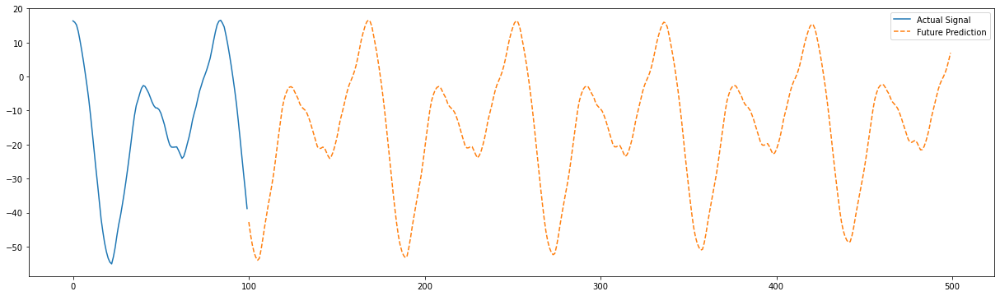

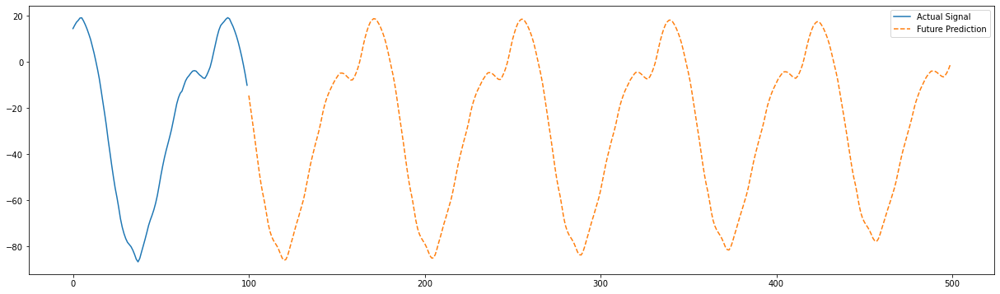

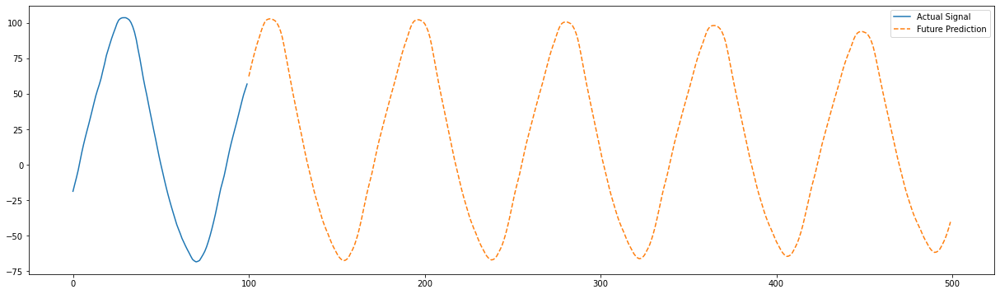

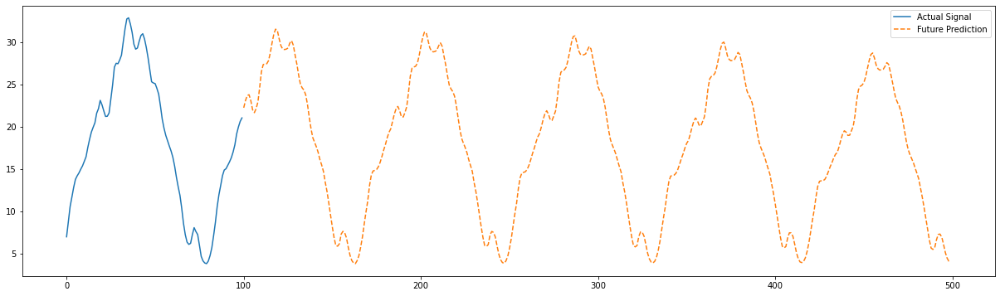

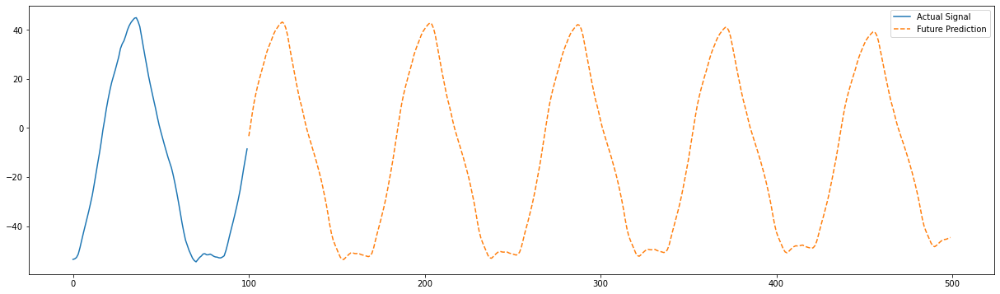

In [110]:
#Train all codes together---LSTM bounch Model
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.layers import Input, Dense, LSTM, TimeDistributed, RepeatVector
from tensorflow.keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, EarlyStopping

units_LSTM=100 #The output of the model is unsteady when this hyperparameter is equal 50.
# Define the LSTM model
def build_lstm_model(timesteps, latent_dim):

    lstm_model=Sequential()
    lstm_model.add(LSTM(units_LSTM, activation='tanh',input_shape=(timesteps, latent_dim)))
    lstm_model.add(RepeatVector(timesteps))
    lstm_model.add(LSTM(units_LSTM, activation='tanh',return_sequences=True))
    lstm_model.add(TimeDistributed(Dense(latent_dim)))
                     
    return lstm_model

timesteps = 1
latent_dim=encoding_dim
lstm_model = build_lstm_model(timesteps, latent_dim)

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
lstm_model.compile(optimizer=optimizer, loss='mse')

#lstm_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001,clipvalue=1.0), loss='mse')

# Print LSTM model summary
lstm_model.summary()

#Encode the input data
encoded_data=y
print(encoded_data.shape)

# Reshape for LSTM input
encoded_data = np.reshape(encoded_data, (encoded_data.shape[0], timesteps, encoding_dim))
lstm_inputs=encoded_data[:-1]
print("lstm_inputs shape:",lstm_inputs.shape)
lstm_targets=encoded_data[1:]
print("lstm_targets shape:",lstm_inputs.shape)


# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
									factor=0.5,
									patience=10,
									verbose=1,
									mode='min',
									min_delta=1e-10,
									cooldown=0,
									min_lr=0)
# Train the LSTM model
start_time = timeit.default_timer()
lstm_model.fit(lstm_inputs, lstm_targets, epochs=500, batch_size=32,validation_split=0.10,callbacks=[reduce_lr])
print("time spend for training:",timeit.default_timer() - start_time)

lstm_model.save('./Temp_data_Case1/model_bunch_'+str(encoding_dim)+'.h5')

lstm_model = load_model('./Temp_data_Case1/model_bunch_'+str(encoding_dim)+'.h5')

## Reshape for LSTM input
encoded_data = np.reshape(encoded_data, (encoded_data.shape[0], timesteps, latent_dim))

# Predict future states using the LSTM model

predicted_latent = lstm_model.predict(encoded_data[:-1])
print(predicted_latent.shape)

# Decode the predictions to get the original space
decoded_predictions = ae.decoder.predict(np.reshape(predicted_latent, (predicted_latent.shape[0], latent_dim)))

print(decoded_predictions.shape)

# decoded_predictions now contains the future states of your fluid dynamics data
print(two_dimension_data_0[1501,1000:1020])
print(decoded_predictions[1500,1000:1020])

# Extrapolation Function: Predict future timesteps beyond the training sequence
def extrapolate_lstm(lstm_model, encoded_data, future_steps):
    future_latent = []
    current_input = encoded_data
    
    for _ in range(future_steps):
        # Predict the next latent space
        next_latent = lstm_model.predict(current_input)

        future_latent.append(next_latent)
 
        current_input=next_latent
        
    future_latent=np.concatenate(future_latent,axis=1)
    return np.array(future_latent).squeeze()

# Number of future steps to predict
future_steps = 400

#print(encoded_data.shape)

# Perform extrapolation
start_time = timeit.default_timer()
future_latent_predictions = extrapolate_lstm(lstm_model, encoded_data[-1].reshape(1,1,latent_dim),future_steps)
print(encoded_data[-1].shape)
future_latent_predictions=np.array(future_latent_predictions)
print("time spend for prediction:",timeit.default_timer() - start_time)

pickle.dump(future_latent_predictions, open("./Temp_data_Case1/reconstructed_signals_lstm_codes_"+str(encoding_dim)+".pkl", "wb"))

# Decode the future latent predictions to the original space
decoded_future_predictions = [ae.decoder.predict(latent.reshape(1, -1)) for latent in future_latent_predictions]
print(np.array(decoded_future_predictions).shape)

# Combine the original and future predictions for the complete sequence
combined_predictions = np.concatenate([decoded_predictions, np.array(decoded_future_predictions).squeeze()])
print(np.array(decoded_future_predictions).squeeze().shape)
x_lstm=np.array(decoded_future_predictions).squeeze()
pickle.dump(x_lstm, open("./Temp_data_Case1/reconstructed_signals_lstm_bunch_"+str(encoding_dim)+".pkl", "wb"))

# combined_predictions now contains the original and extrapolated future states of your fluid dynamics data
print(x_lstm[70,1000:1020])
print(training_data_whole.shape)
print(training_data_whole.reshape(training_data_whole.shape[0],109072)[1671,1000:1020])

print(x_lstm[300,1000:1020])
print(training_data_whole.reshape(training_data_whole.shape[0],109072)[1901,1000:1020])

print(x_lstm[399,1000:1020])
print(training_data_whole.reshape(training_data_whole.shape[0],109072)[2000,1000:1020])

print(encoded_data.shape)
encoded_data_2=np.transpose(encoded_data.squeeze())
print(encoded_data_2.shape)

future_latent_predictions_2=np.transpose(future_latent_predictions)
print(future_latent_predictions_2.shape)

for idx in range(5):#for idx in range(encoded_data_2.shape[0])
    plt.figure(figsize=(21, 6))
    plt.plot(encoded_data_2[idx, -100:], label='Actual Signal')
    plt.plot(np.arange(100, 100+ future_steps), future_latent_predictions_2[idx], label='Future Prediction', linestyle='dashed')
    plt.legend()
    plt.show()
    
    

(1601, 13)
(13, 1601)
training_data shape: (1601, 1)
(1511, 90, 1)
(1511, 1)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 90, 100)           40800     
_________________________________________________________________
lstm_1 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dense (Dense)                (None, 1)                 101       
Total params: 121,301
Trainable params: 121,301
Non-trainable params: 0
_________________________________________________________________
the 0 signal
Epoch 1/500
38/38 [==============================] - 4s 65ms/step - loss: 0.0075 - val_loss: 0.0041
Epoch 2/500
38/38 [==============================] - 2s 61ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 3/500
38/38 [==============================] - 2s 52ms/step - loss: 9.0597e-04 - val

Epoch 68/500
38/38 [==============================] - 2s 61ms/step - loss: 1.9334e-05 - val_loss: 2.1086e-05
Epoch 69/500
38/38 [==============================] - 2s 60ms/step - loss: 3.1650e-05 - val_loss: 4.2928e-05
Epoch 70/500
38/38 [==============================] - 2s 58ms/step - loss: 2.5262e-05 - val_loss: 3.1736e-05
Epoch 71/500
38/38 [==============================] - 2s 57ms/step - loss: 2.3706e-05 - val_loss: 2.8435e-05
Epoch 72/500
38/38 [==============================] - 2s 63ms/step - loss: 1.8425e-05 - val_loss: 2.1441e-05
Epoch 73/500
38/38 [==============================] - 2s 55ms/step - loss: 2.1233e-05 - val_loss: 1.8888e-05
Epoch 74/500
38/38 [==============================] - 2s 64ms/step - loss: 2.0980e-05 - val_loss: 1.8157e-05
Epoch 75/500
38/38 [==============================] - 2s 61ms/step - loss: 1.9395e-05 - val_loss: 2.4880e-05
Epoch 76/500
38/38 [==============================] - 2s 62ms/step - loss: 1.7332e-05 - val_loss: 2.5108e-05
Epoch 77/500
38/38 

38/38 [==============================] - 2s 64ms/step - loss: 1.0421e-05 - val_loss: 1.0222e-05
Epoch 141/500
38/38 [==============================] - 2s 57ms/step - loss: 9.7099e-06 - val_loss: 1.1939e-05
Epoch 142/500
38/38 [==============================] - 2s 63ms/step - loss: 1.0069e-05 - val_loss: 9.9628e-06
Epoch 143/500
38/38 [==============================] - 2s 57ms/step - loss: 9.6844e-06 - val_loss: 1.0558e-05
Epoch 144/500
38/38 [==============================] - 2s 55ms/step - loss: 9.8713e-06 - val_loss: 1.1226e-05
Epoch 145/500
38/38 [==============================] - 2s 58ms/step - loss: 9.8628e-06 - val_loss: 9.6343e-06
Epoch 146/500
38/38 [==============================] - 2s 61ms/step - loss: 1.0184e-05 - val_loss: 1.1028e-05
Epoch 147/500
38/38 [==============================] - 2s 63ms/step - loss: 1.0650e-05 - val_loss: 1.0344e-05
Epoch 148/500
38/38 [==============================] - 2s 64ms/step - loss: 9.7042e-06 - val_loss: 1.0881e-05
Epoch 149/500
38/38 [===

38/38 [==============================] - 2s 51ms/step - loss: 8.8685e-06 - val_loss: 9.0856e-06
Epoch 214/500
38/38 [==============================] - 2s 48ms/step - loss: 8.9968e-06 - val_loss: 9.0573e-06
Epoch 215/500
38/38 [==============================] - 2s 50ms/step - loss: 8.9034e-06 - val_loss: 9.1021e-06
Epoch 216/500
38/38 [==============================] - 2s 45ms/step - loss: 9.0420e-06 - val_loss: 9.1998e-06
Epoch 217/500
38/38 [==============================] - 2s 51ms/step - loss: 8.8570e-06 - val_loss: 9.2028e-06
Epoch 218/500
38/38 [==============================] - 2s 50ms/step - loss: 8.9965e-06 - val_loss: 9.0941e-06
Epoch 219/500
38/38 [==============================] - 2s 50ms/step - loss: 8.8356e-06 - val_loss: 9.0880e-06
Epoch 220/500
38/38 [==============================] - 2s 49ms/step - loss: 8.8620e-06 - val_loss: 9.0550e-06
Epoch 221/500
38/38 [==============================] - 2s 47ms/step - loss: 8.8392e-06 - val_loss: 9.0209e-06
Epoch 222/500
38/38 [===

38/38 [==============================] - 2s 52ms/step - loss: 8.7108e-06 - val_loss: 9.0002e-06
Epoch 287/500
38/38 [==============================] - 2s 46ms/step - loss: 8.6756e-06 - val_loss: 8.9555e-06
Epoch 288/500
38/38 [==============================] - 2s 54ms/step - loss: 8.6216e-06 - val_loss: 8.9245e-06
Epoch 289/500
38/38 [==============================] - 2s 54ms/step - loss: 8.7034e-06 - val_loss: 8.9365e-06
Epoch 290/500
38/38 [==============================] - 2s 50ms/step - loss: 8.6559e-06 - val_loss: 9.1825e-06

Epoch 00290: ReduceLROnPlateau reducing learning rate to 9.765625463842298e-07.
Epoch 291/500
38/38 [==============================] - 2s 50ms/step - loss: 8.6438e-06 - val_loss: 8.8872e-06
Epoch 292/500
38/38 [==============================] - 2s 48ms/step - loss: 8.6222e-06 - val_loss: 8.9015e-06
Epoch 293/500
38/38 [==============================] - 2s 51ms/step - loss: 8.6221e-06 - val_loss: 8.9051e-06
Epoch 294/500
38/38 [==============================] 

38/38 [==============================] - 2s 50ms/step - loss: 8.5728e-06 - val_loss: 8.8807e-06
Epoch 428/500
38/38 [==============================] - 2s 51ms/step - loss: 8.5728e-06 - val_loss: 8.8807e-06
Epoch 429/500
38/38 [==============================] - 2s 55ms/step - loss: 8.5728e-06 - val_loss: 8.8807e-06
Epoch 430/500
38/38 [==============================] - 2s 55ms/step - loss: 8.5728e-06 - val_loss: 8.8807e-06

Epoch 00430: ReduceLROnPlateau reducing learning rate to 9.536743617033494e-10.
Epoch 431/500
38/38 [==============================] - 2s 56ms/step - loss: 8.5728e-06 - val_loss: 8.8807e-06
Epoch 432/500
38/38 [==============================] - 2s 49ms/step - loss: 8.5728e-06 - val_loss: 8.8807e-06
Epoch 433/500
38/38 [==============================] - 2s 51ms/step - loss: 8.5728e-06 - val_loss: 8.8807e-06
Epoch 434/500
38/38 [==============================] - 2s 50ms/step - loss: 8.5728e-06 - val_loss: 8.8807e-06
Epoch 435/500
38/38 [==============================] 

Epoch 63/500
38/38 [==============================] - 2s 52ms/step - loss: 1.0137e-04 - val_loss: 1.8381e-04
Epoch 64/500
38/38 [==============================] - 2s 51ms/step - loss: 7.5120e-05 - val_loss: 1.0663e-04
Epoch 65/500
38/38 [==============================] - 2s 53ms/step - loss: 7.3219e-05 - val_loss: 1.2416e-04
Epoch 66/500
38/38 [==============================] - 2s 48ms/step - loss: 9.9207e-05 - val_loss: 1.4184e-04
Epoch 67/500
38/38 [==============================] - 2s 49ms/step - loss: 9.2104e-05 - val_loss: 1.4277e-04
Epoch 68/500
38/38 [==============================] - 2s 52ms/step - loss: 9.2112e-05 - val_loss: 2.5816e-04
Epoch 69/500
38/38 [==============================] - 2s 53ms/step - loss: 9.3723e-05 - val_loss: 1.1060e-04
Epoch 70/500
38/38 [==============================] - 2s 49ms/step - loss: 7.6117e-05 - val_loss: 1.4324e-04
Epoch 71/500
38/38 [==============================] - 2s 52ms/step - loss: 6.4207e-05 - val_loss: 1.0368e-04
Epoch 72/500
38/38 

38/38 [==============================] - 2s 47ms/step - loss: 2.6494e-05 - val_loss: 3.8668e-05
Epoch 138/500
38/38 [==============================] - 2s 46ms/step - loss: 3.4884e-05 - val_loss: 3.5051e-05
Epoch 139/500
38/38 [==============================] - 2s 51ms/step - loss: 2.6593e-05 - val_loss: 3.9701e-05
Epoch 140/500
38/38 [==============================] - 2s 47ms/step - loss: 3.8480e-05 - val_loss: 4.2100e-05
Epoch 141/500
38/38 [==============================] - 2s 48ms/step - loss: 2.7908e-05 - val_loss: 3.0342e-05
Epoch 142/500
38/38 [==============================] - 2s 53ms/step - loss: 2.4173e-05 - val_loss: 3.1032e-05
Epoch 143/500
38/38 [==============================] - 2s 48ms/step - loss: 2.9067e-05 - val_loss: 2.8798e-05
Epoch 144/500
38/38 [==============================] - 2s 52ms/step - loss: 3.4672e-05 - val_loss: 3.0091e-05
Epoch 145/500
38/38 [==============================] - 2s 51ms/step - loss: 2.5637e-05 - val_loss: 2.5792e-05
Epoch 146/500
38/38 [===

38/38 [==============================] - 2s 49ms/step - loss: 9.5440e-06 - val_loss: 9.8546e-06

Epoch 00282: ReduceLROnPlateau reducing learning rate to 7.812500371073838e-06.
Epoch 283/500
38/38 [==============================] - 2s 51ms/step - loss: 9.2584e-06 - val_loss: 9.6411e-06
Epoch 284/500
38/38 [==============================] - 2s 50ms/step - loss: 9.5622e-06 - val_loss: 9.3558e-06
Epoch 285/500
38/38 [==============================] - 2s 48ms/step - loss: 9.3596e-06 - val_loss: 9.3317e-06
Epoch 286/500
38/38 [==============================] - 2s 54ms/step - loss: 9.1409e-06 - val_loss: 9.3037e-06
Epoch 287/500
38/38 [==============================] - 2s 53ms/step - loss: 9.2188e-06 - val_loss: 9.3738e-06
Epoch 288/500
38/38 [==============================] - 2s 52ms/step - loss: 9.2303e-06 - val_loss: 9.4486e-06
Epoch 289/500
38/38 [==============================] - 2s 48ms/step - loss: 9.3716e-06 - val_loss: 9.3621e-06
Epoch 290/500
38/38 [==============================] 

38/38 [==============================] - 2s 49ms/step - loss: 8.8656e-06 - val_loss: 9.1712e-06
Epoch 422/500
38/38 [==============================] - 2s 45ms/step - loss: 8.8656e-06 - val_loss: 9.1713e-06
Epoch 423/500
38/38 [==============================] - 2s 50ms/step - loss: 8.8656e-06 - val_loss: 9.1713e-06
Epoch 424/500
38/38 [==============================] - 2s 50ms/step - loss: 8.8656e-06 - val_loss: 9.1713e-06
Epoch 425/500
38/38 [==============================] - 2s 50ms/step - loss: 8.8656e-06 - val_loss: 9.1713e-06
Epoch 426/500
38/38 [==============================] - 2s 50ms/step - loss: 8.8656e-06 - val_loss: 9.1714e-06

Epoch 00426: ReduceLROnPlateau reducing learning rate to 9.536743617033494e-10.
Epoch 427/500
38/38 [==============================] - 2s 45ms/step - loss: 8.8656e-06 - val_loss: 9.1713e-06
Epoch 428/500
38/38 [==============================] - 2s 43ms/step - loss: 8.8656e-06 - val_loss: 9.1713e-06
Epoch 429/500
38/38 [==============================] 

38/38 [==============================] - 2s 45ms/step - loss: 8.0297e-05 - val_loss: 1.2001e-04
Epoch 57/500
38/38 [==============================] - 2s 49ms/step - loss: 7.5544e-05 - val_loss: 1.7662e-04
Epoch 58/500
38/38 [==============================] - 2s 50ms/step - loss: 8.5871e-05 - val_loss: 1.1920e-04
Epoch 59/500
38/38 [==============================] - 2s 45ms/step - loss: 9.0573e-05 - val_loss: 6.4324e-05
Epoch 60/500
38/38 [==============================] - 2s 46ms/step - loss: 7.9725e-05 - val_loss: 1.1693e-04
Epoch 61/500
38/38 [==============================] - 2s 44ms/step - loss: 7.9034e-05 - val_loss: 1.7827e-04
Epoch 62/500
38/38 [==============================] - 2s 46ms/step - loss: 2.0085e-04 - val_loss: 7.3740e-05
Epoch 63/500
38/38 [==============================] - 2s 47ms/step - loss: 7.6341e-05 - val_loss: 7.6293e-05
Epoch 64/500
38/38 [==============================] - 2s 45ms/step - loss: 7.3196e-05 - val_loss: 1.3407e-04
Epoch 65/500
38/38 [============

Epoch 129/500
38/38 [==============================] - 2s 47ms/step - loss: 3.3322e-05 - val_loss: 4.9083e-05
Epoch 130/500
38/38 [==============================] - 2s 49ms/step - loss: 3.2240e-05 - val_loss: 4.5685e-05
Epoch 131/500
38/38 [==============================] - 2s 49ms/step - loss: 3.3365e-05 - val_loss: 6.5969e-05
Epoch 132/500
38/38 [==============================] - 2s 51ms/step - loss: 3.6871e-05 - val_loss: 5.5961e-05
Epoch 133/500
38/38 [==============================] - 2s 47ms/step - loss: 3.2153e-05 - val_loss: 5.1281e-05
Epoch 134/500
38/38 [==============================] - 2s 53ms/step - loss: 3.2804e-05 - val_loss: 4.5006e-05
Epoch 135/500
38/38 [==============================] - 2s 47ms/step - loss: 3.2834e-05 - val_loss: 4.8902e-05
Epoch 136/500
38/38 [==============================] - 2s 50ms/step - loss: 3.1262e-05 - val_loss: 4.3808e-05
Epoch 137/500
38/38 [==============================] - 2s 51ms/step - loss: 3.2988e-05 - val_loss: 5.3410e-05

Epoch 001

38/38 [==============================] - 2s 52ms/step - loss: 2.5190e-05 - val_loss: 4.0237e-05
Epoch 271/500
38/38 [==============================] - 2s 58ms/step - loss: 2.5188e-05 - val_loss: 4.0234e-05
Epoch 272/500
38/38 [==============================] - 2s 54ms/step - loss: 2.5191e-05 - val_loss: 4.0213e-05
Epoch 273/500
38/38 [==============================] - 2s 48ms/step - loss: 2.5187e-05 - val_loss: 4.0226e-05
Epoch 274/500
38/38 [==============================] - 2s 49ms/step - loss: 2.5188e-05 - val_loss: 4.0227e-05

Epoch 00274: ReduceLROnPlateau reducing learning rate to 6.103515914901436e-08.
Epoch 275/500
38/38 [==============================] - 2s 54ms/step - loss: 2.5183e-05 - val_loss: 4.0233e-05
Epoch 276/500
38/38 [==============================] - 2s 52ms/step - loss: 2.5184e-05 - val_loss: 4.0230e-05
Epoch 277/500
38/38 [==============================] - 2s 49ms/step - loss: 2.5188e-05 - val_loss: 4.0232e-05
Epoch 278/500
38/38 [==============================] 

38/38 [==============================] - 2s 53ms/step - loss: 2.5177e-05 - val_loss: 4.0226e-05
Epoch 409/500
38/38 [==============================] - 2s 49ms/step - loss: 2.5177e-05 - val_loss: 4.0226e-05
Epoch 410/500
38/38 [==============================] - 2s 52ms/step - loss: 2.5177e-05 - val_loss: 4.0226e-05
Epoch 411/500
38/38 [==============================] - 2s 50ms/step - loss: 2.5177e-05 - val_loss: 4.0226e-05
Epoch 412/500
38/38 [==============================] - 2s 54ms/step - loss: 2.5177e-05 - val_loss: 4.0226e-05
Epoch 413/500
38/38 [==============================] - 2s 50ms/step - loss: 2.5177e-05 - val_loss: 4.0226e-05
Epoch 414/500
38/38 [==============================] - 2s 51ms/step - loss: 2.5177e-05 - val_loss: 4.0226e-05

Epoch 00414: ReduceLROnPlateau reducing learning rate to 3.725290475403709e-12.
Epoch 415/500
38/38 [==============================] - 2s 58ms/step - loss: 2.5177e-05 - val_loss: 4.0226e-05
Epoch 416/500
38/38 [==============================] 

38/38 [==============================] - 2s 48ms/step - loss: 2.1234e-04 - val_loss: 4.5103e-04
Epoch 43/500
38/38 [==============================] - 2s 58ms/step - loss: 1.9709e-04 - val_loss: 2.5044e-04
Epoch 44/500
38/38 [==============================] - 2s 49ms/step - loss: 1.7762e-04 - val_loss: 2.3960e-04
Epoch 45/500
38/38 [==============================] - 2s 49ms/step - loss: 1.6145e-04 - val_loss: 2.4197e-04
Epoch 46/500
38/38 [==============================] - 2s 47ms/step - loss: 1.6812e-04 - val_loss: 2.3107e-04
Epoch 47/500
38/38 [==============================] - 2s 52ms/step - loss: 1.5851e-04 - val_loss: 2.3718e-04
Epoch 48/500
38/38 [==============================] - 2s 51ms/step - loss: 1.6682e-04 - val_loss: 2.4748e-04
Epoch 49/500
38/38 [==============================] - 2s 51ms/step - loss: 1.7434e-04 - val_loss: 2.1698e-04
Epoch 50/500
38/38 [==============================] - 2s 50ms/step - loss: 1.8018e-04 - val_loss: 2.0785e-04
Epoch 51/500
38/38 [============

38/38 [==============================] - 2s 47ms/step - loss: 4.8834e-05 - val_loss: 8.0080e-05
Epoch 118/500
38/38 [==============================] - 2s 48ms/step - loss: 4.5287e-05 - val_loss: 8.5049e-05
Epoch 119/500
38/38 [==============================] - 2s 48ms/step - loss: 4.6012e-05 - val_loss: 7.6203e-05
Epoch 120/500
38/38 [==============================] - 2s 48ms/step - loss: 5.0980e-05 - val_loss: 1.0761e-04
Epoch 121/500
38/38 [==============================] - 2s 52ms/step - loss: 6.1715e-05 - val_loss: 8.5636e-05
Epoch 122/500
38/38 [==============================] - 2s 52ms/step - loss: 5.6876e-05 - val_loss: 7.2023e-05
Epoch 123/500
38/38 [==============================] - 2s 51ms/step - loss: 4.8037e-05 - val_loss: 1.1571e-04
Epoch 124/500
38/38 [==============================] - 2s 48ms/step - loss: 4.4745e-05 - val_loss: 1.3030e-04
Epoch 125/500
38/38 [==============================] - 2s 54ms/step - loss: 6.5036e-05 - val_loss: 1.0970e-04
Epoch 126/500
38/38 [===

38/38 [==============================] - 2s 55ms/step - loss: 9.3771e-06 - val_loss: 1.6126e-05
Epoch 264/500
38/38 [==============================] - 2s 56ms/step - loss: 1.0159e-05 - val_loss: 1.6651e-05
Epoch 265/500
38/38 [==============================] - 2s 51ms/step - loss: 9.4592e-06 - val_loss: 1.6490e-05
Epoch 266/500
38/38 [==============================] - 2s 49ms/step - loss: 9.3209e-06 - val_loss: 1.4786e-05
Epoch 267/500
38/38 [==============================] - 2s 50ms/step - loss: 9.6061e-06 - val_loss: 1.6024e-05
Epoch 268/500
38/38 [==============================] - 2s 48ms/step - loss: 9.8882e-06 - val_loss: 1.5669e-05
Epoch 269/500
38/38 [==============================] - 2s 51ms/step - loss: 9.5916e-06 - val_loss: 1.6696e-05
Epoch 270/500
38/38 [==============================] - 2s 51ms/step - loss: 9.4130e-06 - val_loss: 1.5257e-05
Epoch 271/500
38/38 [==============================] - 2s 50ms/step - loss: 9.6386e-06 - val_loss: 1.7545e-05
Epoch 272/500
38/38 [===

38/38 [==============================] - 2s 51ms/step - loss: 8.0751e-06 - val_loss: 1.3917e-05
Epoch 407/500
38/38 [==============================] - 2s 60ms/step - loss: 8.0832e-06 - val_loss: 1.3918e-05
Epoch 408/500
38/38 [==============================] - 2s 58ms/step - loss: 8.0864e-06 - val_loss: 1.3898e-05
Epoch 409/500
38/38 [==============================] - 2s 56ms/step - loss: 8.0776e-06 - val_loss: 1.3951e-05

Epoch 00409: ReduceLROnPlateau reducing learning rate to 2.4414063659605745e-07.
Epoch 410/500
38/38 [==============================] - 2s 50ms/step - loss: 8.0688e-06 - val_loss: 1.3923e-05
Epoch 411/500
38/38 [==============================] - 2s 56ms/step - loss: 8.0696e-06 - val_loss: 1.3925e-05
Epoch 412/500
38/38 [==============================] - 2s 53ms/step - loss: 8.0661e-06 - val_loss: 1.3908e-05
Epoch 413/500
38/38 [==============================] - 2s 58ms/step - loss: 8.0671e-06 - val_loss: 1.3903e-05
Epoch 414/500
38/38 [==============================]

Epoch 40/500
38/38 [==============================] - 2s 53ms/step - loss: 1.4395e-04 - val_loss: 1.0008e-04
Epoch 41/500
38/38 [==============================] - 2s 54ms/step - loss: 1.4036e-04 - val_loss: 8.4148e-05
Epoch 42/500
38/38 [==============================] - 2s 53ms/step - loss: 1.3742e-04 - val_loss: 1.3995e-04
Epoch 43/500
38/38 [==============================] - 2s 52ms/step - loss: 1.5653e-04 - val_loss: 8.3206e-05
Epoch 44/500
38/38 [==============================] - 2s 55ms/step - loss: 1.1112e-04 - val_loss: 2.3328e-04
Epoch 45/500
38/38 [==============================] - 2s 48ms/step - loss: 1.1976e-04 - val_loss: 1.1319e-04
Epoch 46/500
38/38 [==============================] - 2s 53ms/step - loss: 1.1761e-04 - val_loss: 8.3552e-05

Epoch 00046: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
Epoch 47/500
38/38 [==============================] - 2s 50ms/step - loss: 9.9185e-05 - val_loss: 9.7813e-05
Epoch 48/500
38/38 [===========================

Epoch 113/500
38/38 [==============================] - 2s 56ms/step - loss: 6.0346e-05 - val_loss: 6.1976e-05
Epoch 114/500
38/38 [==============================] - 2s 54ms/step - loss: 6.2461e-05 - val_loss: 7.3549e-05
Epoch 115/500
38/38 [==============================] - 2s 48ms/step - loss: 5.9162e-05 - val_loss: 6.5171e-05
Epoch 116/500
38/38 [==============================] - 2s 50ms/step - loss: 6.3304e-05 - val_loss: 6.1178e-05
Epoch 117/500
38/38 [==============================] - 2s 52ms/step - loss: 6.3189e-05 - val_loss: 6.8633e-05
Epoch 118/500
38/38 [==============================] - 2s 47ms/step - loss: 6.3636e-05 - val_loss: 6.5504e-05
Epoch 119/500
38/38 [==============================] - 2s 48ms/step - loss: 6.2104e-05 - val_loss: 6.2648e-05
Epoch 120/500
38/38 [==============================] - 2s 45ms/step - loss: 6.4819e-05 - val_loss: 6.1357e-05
Epoch 121/500
38/38 [==============================] - 2s 48ms/step - loss: 5.7263e-05 - val_loss: 6.9804e-05
Epoch 122/

Epoch 187/500
38/38 [==============================] - 2s 48ms/step - loss: 4.0872e-05 - val_loss: 3.8816e-05
Epoch 188/500
38/38 [==============================] - 2s 48ms/step - loss: 4.8833e-05 - val_loss: 4.3098e-05
Epoch 189/500
38/38 [==============================] - 2s 53ms/step - loss: 4.2928e-05 - val_loss: 4.2464e-05
Epoch 190/500
38/38 [==============================] - 2s 45ms/step - loss: 4.4602e-05 - val_loss: 4.1148e-05
Epoch 191/500
38/38 [==============================] - 2s 50ms/step - loss: 4.3196e-05 - val_loss: 3.8096e-05
Epoch 192/500
38/38 [==============================] - 2s 49ms/step - loss: 4.3916e-05 - val_loss: 4.1004e-05
Epoch 193/500
38/38 [==============================] - 2s 44ms/step - loss: 4.2579e-05 - val_loss: 3.3666e-05
Epoch 194/500
38/38 [==============================] - 2s 46ms/step - loss: 4.4221e-05 - val_loss: 3.4579e-05
Epoch 195/500
38/38 [==============================] - 2s 44ms/step - loss: 3.9023e-05 - val_loss: 3.7031e-05
Epoch 196/

Epoch 335/500
38/38 [==============================] - 2s 48ms/step - loss: 1.9588e-05 - val_loss: 1.4592e-05
Epoch 336/500
38/38 [==============================] - 2s 53ms/step - loss: 1.9788e-05 - val_loss: 1.2556e-05
Epoch 337/500
38/38 [==============================] - 2s 55ms/step - loss: 1.9044e-05 - val_loss: 1.1556e-05
Epoch 338/500
38/38 [==============================] - 2s 49ms/step - loss: 2.0005e-05 - val_loss: 1.2146e-05
Epoch 339/500
38/38 [==============================] - 2s 54ms/step - loss: 1.9542e-05 - val_loss: 1.4347e-05
Epoch 340/500
38/38 [==============================] - 2s 50ms/step - loss: 1.8895e-05 - val_loss: 1.5913e-05
Epoch 341/500
38/38 [==============================] - 2s 57ms/step - loss: 1.9135e-05 - val_loss: 1.3616e-05
Epoch 342/500
38/38 [==============================] - 2s 51ms/step - loss: 1.8481e-05 - val_loss: 1.2117e-05
Epoch 343/500
38/38 [==============================] - 2s 56ms/step - loss: 1.9022e-05 - val_loss: 1.2323e-05
Epoch 344/

38/38 [==============================] - 2s 47ms/step - loss: 1.6585e-05 - val_loss: 1.1002e-05
Epoch 406/500
38/38 [==============================] - 2s 49ms/step - loss: 1.6588e-05 - val_loss: 1.1051e-05
Epoch 407/500
38/38 [==============================] - 2s 49ms/step - loss: 1.6578e-05 - val_loss: 1.1035e-05
Epoch 408/500
38/38 [==============================] - 2s 52ms/step - loss: 1.6583e-05 - val_loss: 1.0972e-05
Epoch 409/500
38/38 [==============================] - 2s 49ms/step - loss: 1.6584e-05 - val_loss: 1.1003e-05
Epoch 410/500
38/38 [==============================] - 2s 50ms/step - loss: 1.6597e-05 - val_loss: 1.1059e-05
Epoch 411/500
38/38 [==============================] - 2s 49ms/step - loss: 1.6618e-05 - val_loss: 1.1056e-05
Epoch 412/500
38/38 [==============================] - 2s 50ms/step - loss: 1.6601e-05 - val_loss: 1.0964e-05
Epoch 413/500
38/38 [==============================] - 2s 48ms/step - loss: 1.6614e-05 - val_loss: 1.0986e-05
Epoch 414/500
38/38 [===

38/38 [==============================] - 2s 54ms/step - loss: 1.6528e-05 - val_loss: 1.1017e-05
Epoch 476/500
38/38 [==============================] - 2s 51ms/step - loss: 1.6529e-05 - val_loss: 1.1017e-05
Epoch 477/500
38/38 [==============================] - 2s 48ms/step - loss: 1.6528e-05 - val_loss: 1.1017e-05
Epoch 478/500
38/38 [==============================] - 2s 51ms/step - loss: 1.6528e-05 - val_loss: 1.1017e-05
Epoch 479/500
38/38 [==============================] - 2s 58ms/step - loss: 1.6528e-05 - val_loss: 1.1017e-05
Epoch 480/500
38/38 [==============================] - 2s 48ms/step - loss: 1.6528e-05 - val_loss: 1.1016e-05
Epoch 481/500
38/38 [==============================] - 2s 48ms/step - loss: 1.6528e-05 - val_loss: 1.1017e-05
Epoch 482/500
38/38 [==============================] - 2s 51ms/step - loss: 1.6528e-05 - val_loss: 1.1017e-05
Epoch 483/500
38/38 [==============================] - 2s 50ms/step - loss: 1.6528e-05 - val_loss: 1.1017e-05
Epoch 484/500
38/38 [===

38/38 [==============================] - 2s 48ms/step - loss: 3.2678e-05 - val_loss: 3.8382e-05
Epoch 116/500
38/38 [==============================] - 2s 45ms/step - loss: 3.6226e-05 - val_loss: 3.2330e-05
Epoch 117/500
38/38 [==============================] - 2s 50ms/step - loss: 3.1128e-05 - val_loss: 2.9652e-05
Epoch 118/500
38/38 [==============================] - 2s 55ms/step - loss: 2.6707e-05 - val_loss: 2.3380e-05
Epoch 119/500
38/38 [==============================] - 2s 49ms/step - loss: 3.4232e-05 - val_loss: 4.9027e-05
Epoch 120/500
38/38 [==============================] - 2s 52ms/step - loss: 5.2648e-05 - val_loss: 8.2813e-05
Epoch 121/500
38/38 [==============================] - 2s 44ms/step - loss: 4.3157e-05 - val_loss: 6.2661e-05
Epoch 122/500
38/38 [==============================] - 2s 51ms/step - loss: 5.3738e-05 - val_loss: 3.8225e-05
Epoch 123/500
38/38 [==============================] - 2s 52ms/step - loss: 3.6771e-05 - val_loss: 4.8052e-05
Epoch 124/500
38/38 [===

38/38 [==============================] - 1s 39ms/step - loss: 9.6342e-06 - val_loss: 1.0007e-05
Epoch 261/500
38/38 [==============================] - 1s 38ms/step - loss: 9.1027e-06 - val_loss: 1.0895e-05
Epoch 262/500
38/38 [==============================] - 2s 47ms/step - loss: 9.0710e-06 - val_loss: 9.9972e-06
Epoch 263/500
38/38 [==============================] - 2s 48ms/step - loss: 1.1605e-05 - val_loss: 1.1157e-05
Epoch 264/500
38/38 [==============================] - 2s 46ms/step - loss: 1.0056e-05 - val_loss: 1.0036e-05
Epoch 265/500
38/38 [==============================] - 2s 44ms/step - loss: 1.0339e-05 - val_loss: 1.1711e-05
Epoch 266/500
38/38 [==============================] - 2s 51ms/step - loss: 9.3662e-06 - val_loss: 1.0176e-05
Epoch 267/500
38/38 [==============================] - 2s 56ms/step - loss: 9.4765e-06 - val_loss: 9.9772e-06
Epoch 268/500
38/38 [==============================] - 2s 50ms/step - loss: 9.0525e-06 - val_loss: 1.0901e-05
Epoch 269/500
38/38 [===

38/38 [==============================] - 2s 54ms/step - loss: 7.8789e-06 - val_loss: 9.1459e-06
Epoch 403/500
38/38 [==============================] - 2s 61ms/step - loss: 7.8814e-06 - val_loss: 9.1474e-06
Epoch 404/500
38/38 [==============================] - 2s 55ms/step - loss: 7.8787e-06 - val_loss: 9.1444e-06
Epoch 405/500
38/38 [==============================] - 2s 58ms/step - loss: 7.8791e-06 - val_loss: 9.1427e-06
Epoch 406/500
38/38 [==============================] - 2s 55ms/step - loss: 7.8789e-06 - val_loss: 9.1481e-06
Epoch 407/500
38/38 [==============================] - 2s 51ms/step - loss: 7.8823e-06 - val_loss: 9.1476e-06

Epoch 00407: ReduceLROnPlateau reducing learning rate to 3.051757957450718e-08.
Epoch 408/500
38/38 [==============================] - 2s 58ms/step - loss: 7.8784e-06 - val_loss: 9.1479e-06
Epoch 409/500
38/38 [==============================] - 2s 60ms/step - loss: 7.8784e-06 - val_loss: 9.1461e-06
Epoch 410/500
38/38 [==============================] 

Epoch 36/500
38/38 [==============================] - 2s 56ms/step - loss: 1.3779e-04 - val_loss: 2.6115e-04
Epoch 37/500
38/38 [==============================] - 2s 63ms/step - loss: 1.0470e-04 - val_loss: 1.0960e-04
Epoch 38/500
38/38 [==============================] - 2s 57ms/step - loss: 1.0586e-04 - val_loss: 1.0065e-04
Epoch 39/500
38/38 [==============================] - 2s 55ms/step - loss: 1.0647e-04 - val_loss: 1.0696e-04
Epoch 40/500
38/38 [==============================] - 2s 60ms/step - loss: 9.4863e-05 - val_loss: 9.9639e-05
Epoch 41/500
38/38 [==============================] - 2s 57ms/step - loss: 9.7028e-05 - val_loss: 8.5058e-05
Epoch 42/500
38/38 [==============================] - 2s 53ms/step - loss: 7.3442e-05 - val_loss: 8.8305e-05
Epoch 43/500
38/38 [==============================] - 2s 59ms/step - loss: 7.7498e-05 - val_loss: 1.0395e-04
Epoch 44/500
38/38 [==============================] - 2s 59ms/step - loss: 9.7066e-05 - val_loss: 8.3166e-05
Epoch 45/500
38/38 

38/38 [==============================] - 2s 51ms/step - loss: 3.1387e-05 - val_loss: 1.3684e-04
Epoch 112/500
38/38 [==============================] - 2s 51ms/step - loss: 2.1904e-05 - val_loss: 4.2885e-05
Epoch 113/500
38/38 [==============================] - 2s 56ms/step - loss: 2.1064e-05 - val_loss: 2.4912e-05
Epoch 114/500
38/38 [==============================] - 2s 54ms/step - loss: 2.1220e-05 - val_loss: 4.1280e-05
Epoch 115/500
38/38 [==============================] - 2s 47ms/step - loss: 1.8061e-05 - val_loss: 1.4972e-05
Epoch 116/500
38/38 [==============================] - 2s 58ms/step - loss: 1.5434e-05 - val_loss: 1.7351e-05
Epoch 117/500
38/38 [==============================] - 2s 52ms/step - loss: 2.0659e-05 - val_loss: 2.0832e-05
Epoch 118/500
38/38 [==============================] - 2s 51ms/step - loss: 1.8965e-05 - val_loss: 2.3925e-05
Epoch 119/500
38/38 [==============================] - 2s 54ms/step - loss: 2.1982e-05 - val_loss: 1.9779e-05
Epoch 120/500
38/38 [===

Epoch 185/500
38/38 [==============================] - 2s 61ms/step - loss: 1.0314e-05 - val_loss: 1.0109e-05
Epoch 186/500
38/38 [==============================] - 2s 57ms/step - loss: 9.5786e-06 - val_loss: 9.7226e-06
Epoch 187/500
38/38 [==============================] - 2s 59ms/step - loss: 1.0964e-05 - val_loss: 9.6168e-06
Epoch 188/500
38/38 [==============================] - 2s 63ms/step - loss: 8.7338e-06 - val_loss: 9.8518e-06
Epoch 189/500
38/38 [==============================] - 2s 53ms/step - loss: 9.9581e-06 - val_loss: 1.4288e-05
Epoch 190/500
38/38 [==============================] - 2s 58ms/step - loss: 9.5142e-06 - val_loss: 9.6140e-06
Epoch 191/500
38/38 [==============================] - 2s 56ms/step - loss: 9.3777e-06 - val_loss: 1.1195e-05
Epoch 192/500
38/38 [==============================] - 2s 57ms/step - loss: 8.0104e-06 - val_loss: 9.5823e-06
Epoch 193/500
38/38 [==============================] - 2s 61ms/step - loss: 1.3344e-05 - val_loss: 1.3495e-05
Epoch 194/

38/38 [==============================] - 2s 62ms/step - loss: 7.5196e-06 - val_loss: 8.9495e-06
Epoch 259/500
38/38 [==============================] - 2s 61ms/step - loss: 7.1162e-06 - val_loss: 9.6513e-06

Epoch 00259: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
Epoch 260/500
38/38 [==============================] - 2s 59ms/step - loss: 7.0213e-06 - val_loss: 9.4462e-06
Epoch 261/500
38/38 [==============================] - 2s 55ms/step - loss: 7.1973e-06 - val_loss: 9.9549e-06
Epoch 262/500
38/38 [==============================] - 2s 54ms/step - loss: 7.2502e-06 - val_loss: 1.1350e-05
Epoch 263/500
38/38 [==============================] - 2s 57ms/step - loss: 7.2571e-06 - val_loss: 9.1988e-06
Epoch 264/500
38/38 [==============================] - 2s 56ms/step - loss: 6.9797e-06 - val_loss: 9.0250e-06
Epoch 265/500
38/38 [==============================] - 2s 56ms/step - loss: 7.0867e-06 - val_loss: 8.8922e-06
Epoch 266/500
38/38 [==============================] -

38/38 [==============================] - 2s 55ms/step - loss: 6.7033e-06 - val_loss: 8.8790e-06
Epoch 400/500
38/38 [==============================] - 2s 53ms/step - loss: 6.7025e-06 - val_loss: 8.8685e-06

Epoch 00400: ReduceLROnPlateau reducing learning rate to 6.103515914901436e-08.
Epoch 401/500
38/38 [==============================] - 2s 52ms/step - loss: 6.7012e-06 - val_loss: 8.8760e-06
Epoch 402/500
38/38 [==============================] - 2s 51ms/step - loss: 6.7022e-06 - val_loss: 8.8738e-06
Epoch 403/500
38/38 [==============================] - 2s 53ms/step - loss: 6.7021e-06 - val_loss: 8.8689e-06
Epoch 404/500
38/38 [==============================] - 2s 65ms/step - loss: 6.7014e-06 - val_loss: 8.8779e-06
Epoch 405/500
38/38 [==============================] - 2s 61ms/step - loss: 6.7018e-06 - val_loss: 8.8824e-06
Epoch 406/500
38/38 [==============================] - 2s 56ms/step - loss: 6.7028e-06 - val_loss: 8.8773e-06
Epoch 407/500
38/38 [==============================] 

38/38 [==============================] - 2s 47ms/step - loss: 1.4543e-04 - val_loss: 9.4379e-05
Epoch 33/500
38/38 [==============================] - 2s 51ms/step - loss: 9.6651e-05 - val_loss: 8.9849e-05
Epoch 34/500
38/38 [==============================] - 2s 52ms/step - loss: 1.6827e-04 - val_loss: 2.2877e-04
Epoch 35/500
38/38 [==============================] - 2s 55ms/step - loss: 1.2260e-04 - val_loss: 1.5582e-04
Epoch 36/500
38/38 [==============================] - 2s 60ms/step - loss: 9.5586e-05 - val_loss: 8.5424e-05
Epoch 37/500
38/38 [==============================] - 2s 58ms/step - loss: 1.0645e-04 - val_loss: 1.9731e-04
Epoch 38/500
38/38 [==============================] - 2s 60ms/step - loss: 1.1245e-04 - val_loss: 7.8616e-05
Epoch 39/500
38/38 [==============================] - 2s 54ms/step - loss: 8.1888e-05 - val_loss: 1.8499e-04
Epoch 40/500
38/38 [==============================] - 2s 65ms/step - loss: 1.5127e-04 - val_loss: 2.4165e-04
Epoch 41/500
38/38 [============

Epoch 106/500
38/38 [==============================] - 2s 51ms/step - loss: 3.2133e-05 - val_loss: 5.1804e-05
Epoch 107/500
38/38 [==============================] - 2s 60ms/step - loss: 3.8862e-05 - val_loss: 3.5238e-05
Epoch 108/500
38/38 [==============================] - 2s 56ms/step - loss: 3.1890e-05 - val_loss: 3.4493e-05
Epoch 109/500
38/38 [==============================] - 2s 56ms/step - loss: 3.1953e-05 - val_loss: 3.8373e-05
Epoch 110/500
38/38 [==============================] - 2s 56ms/step - loss: 3.1799e-05 - val_loss: 3.9526e-05
Epoch 111/500
38/38 [==============================] - 2s 56ms/step - loss: 3.3122e-05 - val_loss: 3.5537e-05
Epoch 112/500
38/38 [==============================] - 2s 53ms/step - loss: 3.2707e-05 - val_loss: 3.9768e-05
Epoch 113/500
38/38 [==============================] - 2s 56ms/step - loss: 3.5078e-05 - val_loss: 3.5595e-05
Epoch 114/500
38/38 [==============================] - 2s 59ms/step - loss: 3.0709e-05 - val_loss: 3.5046e-05
Epoch 115/

38/38 [==============================] - 2s 62ms/step - loss: 2.1298e-05 - val_loss: 2.7315e-05
Epoch 251/500
38/38 [==============================] - 2s 58ms/step - loss: 2.1191e-05 - val_loss: 2.7472e-05
Epoch 252/500
38/38 [==============================] - 2s 58ms/step - loss: 2.1374e-05 - val_loss: 2.7339e-05
Epoch 253/500
38/38 [==============================] - 2s 60ms/step - loss: 2.1470e-05 - val_loss: 2.7634e-05
Epoch 254/500
38/38 [==============================] - 2s 56ms/step - loss: 2.1179e-05 - val_loss: 2.7666e-05
Epoch 255/500
38/38 [==============================] - 2s 63ms/step - loss: 2.1381e-05 - val_loss: 2.7437e-05
Epoch 256/500
38/38 [==============================] - 2s 58ms/step - loss: 2.1242e-05 - val_loss: 2.7254e-05
Epoch 257/500
38/38 [==============================] - 2s 61ms/step - loss: 2.1186e-05 - val_loss: 2.7444e-05
Epoch 258/500
38/38 [==============================] - 2s 60ms/step - loss: 2.1350e-05 - val_loss: 2.7412e-05
Epoch 259/500
38/38 [===

38/38 [==============================] - 2s 55ms/step - loss: 2.0780e-05 - val_loss: 2.6989e-05
Epoch 396/500
38/38 [==============================] - 2s 56ms/step - loss: 2.0778e-05 - val_loss: 2.6987e-05
Epoch 397/500
38/38 [==============================] - 2s 56ms/step - loss: 2.0784e-05 - val_loss: 2.6986e-05
Epoch 398/500
38/38 [==============================] - 2s 54ms/step - loss: 2.0790e-05 - val_loss: 2.6980e-05
Epoch 399/500
38/38 [==============================] - 2s 56ms/step - loss: 2.0786e-05 - val_loss: 2.6988e-05
Epoch 400/500
38/38 [==============================] - 2s 57ms/step - loss: 2.0779e-05 - val_loss: 2.6992e-05
Epoch 401/500
38/38 [==============================] - 2s 58ms/step - loss: 2.0780e-05 - val_loss: 2.6986e-05
Epoch 402/500
38/38 [==============================] - 2s 59ms/step - loss: 2.0785e-05 - val_loss: 2.6983e-05
Epoch 403/500
38/38 [==============================] - 2s 49ms/step - loss: 2.0778e-05 - val_loss: 2.6995e-05
Epoch 404/500
38/38 [===

Epoch 29/500
38/38 [==============================] - 2s 56ms/step - loss: 1.4418e-04 - val_loss: 1.3230e-04
Epoch 30/500
38/38 [==============================] - 2s 50ms/step - loss: 1.2680e-04 - val_loss: 1.4409e-04
Epoch 31/500
38/38 [==============================] - 2s 52ms/step - loss: 9.5921e-05 - val_loss: 1.6961e-04
Epoch 32/500
38/38 [==============================] - 2s 59ms/step - loss: 1.3694e-04 - val_loss: 2.0472e-04
Epoch 33/500
38/38 [==============================] - 2s 51ms/step - loss: 1.0903e-04 - val_loss: 1.0849e-04
Epoch 34/500
38/38 [==============================] - 2s 53ms/step - loss: 9.8468e-05 - val_loss: 1.0170e-04
Epoch 35/500
38/38 [==============================] - 2s 50ms/step - loss: 9.5221e-05 - val_loss: 8.5751e-05
Epoch 36/500
38/38 [==============================] - 2s 50ms/step - loss: 7.9108e-05 - val_loss: 8.9989e-05
Epoch 37/500
38/38 [==============================] - 2s 53ms/step - loss: 7.2976e-05 - val_loss: 7.3957e-05
Epoch 38/500
38/38 

Epoch 176/500
38/38 [==============================] - 2s 60ms/step - loss: 3.7916e-05 - val_loss: 3.9675e-05
Epoch 177/500
38/38 [==============================] - 2s 59ms/step - loss: 3.9492e-05 - val_loss: 4.2847e-05
Epoch 178/500
38/38 [==============================] - 2s 56ms/step - loss: 3.3799e-05 - val_loss: 3.7237e-05

Epoch 00178: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
Epoch 179/500
38/38 [==============================] - 2s 60ms/step - loss: 3.0916e-05 - val_loss: 3.4244e-05
Epoch 180/500
38/38 [==============================] - 2s 58ms/step - loss: 3.2018e-05 - val_loss: 4.2078e-05
Epoch 181/500
38/38 [==============================] - 2s 63ms/step - loss: 3.1447e-05 - val_loss: 3.6587e-05
Epoch 182/500
38/38 [==============================] - 2s 61ms/step - loss: 3.2202e-05 - val_loss: 3.8139e-05
Epoch 183/500
38/38 [==============================] - 2s 59ms/step - loss: 3.1217e-05 - val_loss: 3.4536e-05
Epoch 184/500
38/38 [===================

38/38 [==============================] - 2s 53ms/step - loss: 2.6871e-05 - val_loss: 3.1121e-05
Epoch 320/500
38/38 [==============================] - 2s 53ms/step - loss: 2.6884e-05 - val_loss: 3.1010e-05
Epoch 321/500
38/38 [==============================] - 2s 56ms/step - loss: 2.6860e-05 - val_loss: 3.1340e-05
Epoch 322/500
38/38 [==============================] - 2s 50ms/step - loss: 2.6905e-05 - val_loss: 3.1060e-05

Epoch 00322: ReduceLROnPlateau reducing learning rate to 4.882812731921149e-07.
Epoch 323/500
38/38 [==============================] - 2s 58ms/step - loss: 2.6867e-05 - val_loss: 3.1081e-05
Epoch 324/500
38/38 [==============================] - 2s 49ms/step - loss: 2.6852e-05 - val_loss: 3.1130e-05
Epoch 325/500
38/38 [==============================] - 2s 60ms/step - loss: 2.6849e-05 - val_loss: 3.1162e-05
Epoch 326/500
38/38 [==============================] - 2s 51ms/step - loss: 2.6852e-05 - val_loss: 3.1150e-05
Epoch 327/500
38/38 [==============================] 

38/38 [==============================] - 2s 57ms/step - loss: 2.6804e-05 - val_loss: 3.1108e-05
Epoch 458/500
38/38 [==============================] - 2s 60ms/step - loss: 2.6804e-05 - val_loss: 3.1108e-05
Epoch 459/500
38/38 [==============================] - 2s 57ms/step - loss: 2.6804e-05 - val_loss: 3.1108e-05
Epoch 460/500
38/38 [==============================] - 2s 58ms/step - loss: 2.6804e-05 - val_loss: 3.1108e-05
Epoch 461/500
38/38 [==============================] - 2s 53ms/step - loss: 2.6804e-05 - val_loss: 3.1108e-05
Epoch 462/500
38/38 [==============================] - 2s 53ms/step - loss: 2.6804e-05 - val_loss: 3.1108e-05

Epoch 00462: ReduceLROnPlateau reducing learning rate to 2.980232380322967e-11.
Epoch 463/500
38/38 [==============================] - 2s 56ms/step - loss: 2.6804e-05 - val_loss: 3.1108e-05
Epoch 464/500
38/38 [==============================] - 2s 54ms/step - loss: 2.6804e-05 - val_loss: 3.1108e-05
Epoch 465/500
38/38 [==============================] 

Epoch 21/500
38/38 [==============================] - 2s 61ms/step - loss: 2.2923e-04 - val_loss: 3.1980e-04
Epoch 22/500
38/38 [==============================] - 2s 55ms/step - loss: 2.8149e-04 - val_loss: 4.2186e-04
Epoch 23/500
38/38 [==============================] - 3s 69ms/step - loss: 3.0782e-04 - val_loss: 3.5399e-04
Epoch 24/500
38/38 [==============================] - 2s 56ms/step - loss: 2.1403e-04 - val_loss: 3.2256e-04
Epoch 25/500
38/38 [==============================] - 2s 63ms/step - loss: 2.0694e-04 - val_loss: 3.2457e-04
Epoch 26/500
38/38 [==============================] - 2s 57ms/step - loss: 2.0430e-04 - val_loss: 3.0960e-04
Epoch 27/500
38/38 [==============================] - 2s 57ms/step - loss: 2.6724e-04 - val_loss: 3.4560e-04
Epoch 28/500
38/38 [==============================] - 2s 57ms/step - loss: 1.9609e-04 - val_loss: 2.9271e-04
Epoch 29/500
38/38 [==============================] - 2s 55ms/step - loss: 1.9813e-04 - val_loss: 3.0983e-04
Epoch 30/500
38/38 

Epoch 170/500
38/38 [==============================] - 2s 58ms/step - loss: 3.2676e-05 - val_loss: 3.5851e-05

Epoch 00170: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 171/500
38/38 [==============================] - 2s 56ms/step - loss: 1.3922e-05 - val_loss: 2.1379e-05
Epoch 172/500
38/38 [==============================] - 2s 58ms/step - loss: 1.3379e-05 - val_loss: 2.7147e-05
Epoch 173/500
38/38 [==============================] - 2s 51ms/step - loss: 1.3559e-05 - val_loss: 2.1921e-05
Epoch 174/500
38/38 [==============================] - 2s 51ms/step - loss: 1.3805e-05 - val_loss: 2.1433e-05
Epoch 175/500
38/38 [==============================] - 2s 56ms/step - loss: 1.3133e-05 - val_loss: 2.0405e-05
Epoch 176/500
38/38 [==============================] - 2s 54ms/step - loss: 1.4012e-05 - val_loss: 2.5298e-05
Epoch 177/500
38/38 [==============================] - 2s 52ms/step - loss: 1.4366e-05 - val_loss: 2.1170e-05
Epoch 178/500
38/38 [==================

38/38 [==============================] - 2s 57ms/step - loss: 7.8869e-06 - val_loss: 1.2420e-05
Epoch 315/500
38/38 [==============================] - 2s 57ms/step - loss: 7.9530e-06 - val_loss: 1.2822e-05
Epoch 316/500
38/38 [==============================] - 2s 56ms/step - loss: 7.9032e-06 - val_loss: 1.2689e-05
Epoch 317/500
38/38 [==============================] - 2s 51ms/step - loss: 7.8496e-06 - val_loss: 1.2185e-05
Epoch 318/500
38/38 [==============================] - 2s 54ms/step - loss: 7.9269e-06 - val_loss: 1.2375e-05
Epoch 319/500
38/38 [==============================] - 2s 56ms/step - loss: 8.0238e-06 - val_loss: 1.2249e-05
Epoch 320/500
38/38 [==============================] - 2s 58ms/step - loss: 7.8737e-06 - val_loss: 1.2389e-05
Epoch 321/500
38/38 [==============================] - 2s 56ms/step - loss: 7.8060e-06 - val_loss: 1.2800e-05
Epoch 322/500
38/38 [==============================] - 2s 58ms/step - loss: 7.8230e-06 - val_loss: 1.2622e-05
Epoch 323/500
38/38 [===

38/38 [==============================] - 2s 52ms/step - loss: 7.6343e-06 - val_loss: 1.2288e-05
Epoch 454/500
38/38 [==============================] - 2s 54ms/step - loss: 7.6343e-06 - val_loss: 1.2288e-05
Epoch 455/500
38/38 [==============================] - 2s 58ms/step - loss: 7.6343e-06 - val_loss: 1.2288e-05
Epoch 456/500
38/38 [==============================] - 2s 54ms/step - loss: 7.6343e-06 - val_loss: 1.2288e-05
Epoch 457/500
38/38 [==============================] - 2s 59ms/step - loss: 7.6343e-06 - val_loss: 1.2288e-05
Epoch 458/500
38/38 [==============================] - 2s 57ms/step - loss: 7.6343e-06 - val_loss: 1.2288e-05

Epoch 00458: ReduceLROnPlateau reducing learning rate to 4.768371808516747e-10.
Epoch 459/500
38/38 [==============================] - 2s 54ms/step - loss: 7.6343e-06 - val_loss: 1.2288e-05
Epoch 460/500
38/38 [==============================] - 2s 57ms/step - loss: 7.6343e-06 - val_loss: 1.2288e-05
Epoch 461/500
38/38 [==============================] 

38/38 [==============================] - 2s 56ms/step - loss: 2.0232e-04 - val_loss: 2.1385e-04
Epoch 17/500
38/38 [==============================] - 2s 61ms/step - loss: 2.3556e-04 - val_loss: 5.5808e-04
Epoch 18/500
38/38 [==============================] - 3s 66ms/step - loss: 2.8595e-04 - val_loss: 1.4516e-04
Epoch 19/500
38/38 [==============================] - 2s 60ms/step - loss: 1.5874e-04 - val_loss: 1.2772e-04
Epoch 20/500
38/38 [==============================] - 2s 58ms/step - loss: 1.3597e-04 - val_loss: 9.0566e-05
Epoch 21/500
38/38 [==============================] - 2s 58ms/step - loss: 1.1828e-04 - val_loss: 9.6776e-05
Epoch 22/500
38/38 [==============================] - 2s 50ms/step - loss: 1.1032e-04 - val_loss: 8.5804e-05
Epoch 23/500
38/38 [==============================] - 2s 58ms/step - loss: 1.1147e-04 - val_loss: 1.3704e-04
Epoch 24/500
38/38 [==============================] - 2s 58ms/step - loss: 1.1057e-04 - val_loss: 6.7216e-05
Epoch 25/500
38/38 [============

Epoch 90/500
38/38 [==============================] - 2s 58ms/step - loss: 4.4136e-05 - val_loss: 2.2511e-05
Epoch 91/500
38/38 [==============================] - 2s 58ms/step - loss: 3.9459e-05 - val_loss: 2.2446e-05
Epoch 92/500
38/38 [==============================] - 2s 60ms/step - loss: 4.2874e-05 - val_loss: 2.3844e-05
Epoch 93/500
38/38 [==============================] - 2s 62ms/step - loss: 4.5176e-05 - val_loss: 2.3813e-05
Epoch 94/500
38/38 [==============================] - 2s 60ms/step - loss: 3.9530e-05 - val_loss: 2.7200e-05
Epoch 95/500
38/38 [==============================] - 2s 53ms/step - loss: 4.3277e-05 - val_loss: 1.7168e-05
Epoch 96/500
38/38 [==============================] - 2s 56ms/step - loss: 4.5061e-05 - val_loss: 2.5229e-05
Epoch 97/500
38/38 [==============================] - 2s 58ms/step - loss: 4.4830e-05 - val_loss: 1.9758e-05
Epoch 98/500
38/38 [==============================] - 2s 53ms/step - loss: 3.9715e-05 - val_loss: 1.6944e-05
Epoch 99/500
38/38 

38/38 [==============================] - 2s 56ms/step - loss: 2.4818e-05 - val_loss: 1.8452e-05
Epoch 164/500
38/38 [==============================] - 2s 57ms/step - loss: 2.3674e-05 - val_loss: 1.0687e-05
Epoch 165/500
38/38 [==============================] - 2s 54ms/step - loss: 2.3743e-05 - val_loss: 8.9965e-06
Epoch 166/500
38/38 [==============================] - 2s 56ms/step - loss: 2.4416e-05 - val_loss: 9.6870e-06
Epoch 167/500
38/38 [==============================] - 2s 57ms/step - loss: 2.4479e-05 - val_loss: 1.0213e-05
Epoch 168/500
38/38 [==============================] - 2s 58ms/step - loss: 2.5426e-05 - val_loss: 8.0673e-06
Epoch 169/500
38/38 [==============================] - 2s 60ms/step - loss: 2.3675e-05 - val_loss: 1.5295e-05

Epoch 00169: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.
Epoch 170/500
38/38 [==============================] - 2s 58ms/step - loss: 2.3391e-05 - val_loss: 8.1246e-06
Epoch 171/500
38/38 [==============================] 

38/38 [==============================] - 2s 48ms/step - loss: 2.0182e-05 - val_loss: 6.6269e-06
Epoch 304/500
38/38 [==============================] - 2s 55ms/step - loss: 2.0182e-05 - val_loss: 6.6279e-06
Epoch 305/500
38/38 [==============================] - 2s 53ms/step - loss: 2.0183e-05 - val_loss: 6.6269e-06
Epoch 306/500
38/38 [==============================] - 2s 54ms/step - loss: 2.0183e-05 - val_loss: 6.6252e-06
Epoch 307/500
38/38 [==============================] - 2s 59ms/step - loss: 2.0183e-05 - val_loss: 6.6245e-06
Epoch 308/500
38/38 [==============================] - 2s 50ms/step - loss: 2.0182e-05 - val_loss: 6.6275e-06
Epoch 309/500
38/38 [==============================] - 2s 54ms/step - loss: 2.0185e-05 - val_loss: 6.6231e-06
Epoch 310/500
38/38 [==============================] - 2s 55ms/step - loss: 2.0182e-05 - val_loss: 6.6316e-06
Epoch 311/500
38/38 [==============================] - 2s 52ms/step - loss: 2.0181e-05 - val_loss: 6.6277e-06
Epoch 312/500
38/38 [===

38/38 [==============================] - 2s 58ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 374/500
38/38 [==============================] - 2s 56ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 375/500
38/38 [==============================] - 2s 58ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 376/500
38/38 [==============================] - 2s 55ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 377/500
38/38 [==============================] - 2s 57ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 378/500
38/38 [==============================] - 2s 56ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 379/500
38/38 [==============================] - 2s 56ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 380/500
38/38 [==============================] - 2s 54ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 381/500
38/38 [==============================] - 2s 61ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 382/500
38/38 [===

38/38 [==============================] - 2s 60ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 444/500
38/38 [==============================] - 2s 59ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 445/500
38/38 [==============================] - 2s 58ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 446/500
38/38 [==============================] - 2s 61ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 447/500
38/38 [==============================] - 2s 58ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 448/500
38/38 [==============================] - 2s 61ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 449/500
38/38 [==============================] - 2s 61ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 450/500
38/38 [==============================] - 2s 55ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 451/500
38/38 [==============================] - 2s 59ms/step - loss: 2.0179e-05 - val_loss: 6.6295e-06
Epoch 452/500
38/38 [===

Epoch 6/500
38/38 [==============================] - 2s 54ms/step - loss: 5.2461e-04 - val_loss: 2.5744e-04
Epoch 7/500
38/38 [==============================] - 2s 55ms/step - loss: 4.8484e-04 - val_loss: 2.2618e-04
Epoch 8/500
38/38 [==============================] - 2s 56ms/step - loss: 4.6088e-04 - val_loss: 2.1050e-04
Epoch 9/500
38/38 [==============================] - 2s 53ms/step - loss: 4.4031e-04 - val_loss: 2.0980e-04
Epoch 10/500
38/38 [==============================] - 2s 53ms/step - loss: 3.9746e-04 - val_loss: 2.4828e-04
Epoch 11/500
38/38 [==============================] - 2s 50ms/step - loss: 4.3667e-04 - val_loss: 3.2832e-04
Epoch 12/500
38/38 [==============================] - 2s 51ms/step - loss: 3.7390e-04 - val_loss: 2.1826e-04
Epoch 13/500
38/38 [==============================] - 2s 56ms/step - loss: 3.3070e-04 - val_loss: 2.4216e-04
Epoch 14/500
38/38 [==============================] - 2s 53ms/step - loss: 3.3204e-04 - val_loss: 2.4288e-04
Epoch 15/500
38/38 [===

38/38 [==============================] - 2s 46ms/step - loss: 3.0750e-05 - val_loss: 3.7734e-05
Epoch 153/500
38/38 [==============================] - 2s 48ms/step - loss: 3.0953e-05 - val_loss: 3.6079e-05
Epoch 154/500
38/38 [==============================] - 2s 51ms/step - loss: 3.0603e-05 - val_loss: 3.6004e-05
Epoch 155/500
38/38 [==============================] - 2s 50ms/step - loss: 3.1860e-05 - val_loss: 5.6769e-05
Epoch 156/500
38/38 [==============================] - 2s 57ms/step - loss: 3.5960e-05 - val_loss: 3.5029e-05
Epoch 157/500
38/38 [==============================] - 2s 51ms/step - loss: 3.0791e-05 - val_loss: 3.6423e-05
Epoch 158/500
38/38 [==============================] - 2s 47ms/step - loss: 2.9504e-05 - val_loss: 3.4989e-05
Epoch 159/500
38/38 [==============================] - 2s 57ms/step - loss: 2.9914e-05 - val_loss: 3.7611e-05
Epoch 160/500
38/38 [==============================] - 2s 54ms/step - loss: 3.1054e-05 - val_loss: 4.0201e-05
Epoch 161/500
38/38 [===

38/38 [==============================] - 2s 56ms/step - loss: 2.5519e-05 - val_loss: 3.2397e-05
Epoch 226/500
38/38 [==============================] - 2s 55ms/step - loss: 2.5113e-05 - val_loss: 3.1382e-05
Epoch 227/500
38/38 [==============================] - 2s 50ms/step - loss: 2.5706e-05 - val_loss: 3.1837e-05
Epoch 228/500
38/38 [==============================] - 2s 57ms/step - loss: 2.6054e-05 - val_loss: 3.2831e-05
Epoch 229/500
38/38 [==============================] - 2s 54ms/step - loss: 2.5603e-05 - val_loss: 3.1367e-05
Epoch 230/500
38/38 [==============================] - 2s 59ms/step - loss: 2.5555e-05 - val_loss: 3.3680e-05
Epoch 231/500
38/38 [==============================] - 2s 53ms/step - loss: 2.7241e-05 - val_loss: 3.2268e-05
Epoch 232/500
38/38 [==============================] - 2s 59ms/step - loss: 2.5179e-05 - val_loss: 3.3715e-05
Epoch 233/500
38/38 [==============================] - 2s 57ms/step - loss: 2.5095e-05 - val_loss: 3.1579e-05
Epoch 234/500
38/38 [===

38/38 [==============================] - 2s 52ms/step - loss: 2.2636e-05 - val_loss: 2.9536e-05
Epoch 367/500
38/38 [==============================] - 2s 56ms/step - loss: 2.2638e-05 - val_loss: 2.9536e-05
Epoch 368/500
38/38 [==============================] - 2s 54ms/step - loss: 2.2635e-05 - val_loss: 2.9536e-05
Epoch 369/500
38/38 [==============================] - 2s 59ms/step - loss: 2.2636e-05 - val_loss: 2.9536e-05
Epoch 370/500
38/38 [==============================] - 2s 60ms/step - loss: 2.2635e-05 - val_loss: 2.9536e-05
Epoch 371/500
38/38 [==============================] - 2s 58ms/step - loss: 2.2635e-05 - val_loss: 2.9535e-05
Epoch 372/500
38/38 [==============================] - 2s 52ms/step - loss: 2.2636e-05 - val_loss: 2.9536e-05
Epoch 373/500
38/38 [==============================] - 2s 57ms/step - loss: 2.2635e-05 - val_loss: 2.9535e-05

Epoch 00373: ReduceLROnPlateau reducing learning rate to 7.629394893626795e-09.
Epoch 374/500
38/38 [==============================] 

38/38 [==============================] - 3s 65ms/step - loss: 0.0358 - val_loss: 0.0097
Epoch 2/500
38/38 [==============================] - 2s 58ms/step - loss: 0.0026 - val_loss: 8.4688e-04
Epoch 3/500
38/38 [==============================] - 2s 55ms/step - loss: 8.1011e-04 - val_loss: 7.6216e-04
Epoch 4/500
38/38 [==============================] - 2s 55ms/step - loss: 6.1816e-04 - val_loss: 4.6880e-04
Epoch 5/500
38/38 [==============================] - 2s 59ms/step - loss: 5.9486e-04 - val_loss: 4.9202e-04
Epoch 6/500
38/38 [==============================] - 2s 59ms/step - loss: 4.9054e-04 - val_loss: 4.0352e-04
Epoch 7/500
38/38 [==============================] - 2s 62ms/step - loss: 4.4163e-04 - val_loss: 4.1638e-04
Epoch 8/500
38/38 [==============================] - 2s 55ms/step - loss: 4.2361e-04 - val_loss: 3.8862e-04
Epoch 9/500
38/38 [==============================] - 2s 55ms/step - loss: 4.1384e-04 - val_loss: 3.8924e-04
Epoch 10/500
38/38 [==============================] 


Epoch 00150: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
Epoch 151/500
38/38 [==============================] - 2s 52ms/step - loss: 1.1995e-05 - val_loss: 1.3580e-05
Epoch 152/500
38/38 [==============================] - 2s 59ms/step - loss: 1.3948e-05 - val_loss: 1.0856e-05
Epoch 153/500
38/38 [==============================] - 2s 48ms/step - loss: 1.0819e-05 - val_loss: 1.3009e-05
Epoch 154/500
38/38 [==============================] - 2s 58ms/step - loss: 1.2324e-05 - val_loss: 1.1138e-05
Epoch 155/500
38/38 [==============================] - 2s 54ms/step - loss: 1.1608e-05 - val_loss: 1.2072e-05
Epoch 156/500
38/38 [==============================] - 2s 57ms/step - loss: 1.0590e-05 - val_loss: 1.3388e-05
Epoch 157/500
38/38 [==============================] - 2s 61ms/step - loss: 1.3510e-05 - val_loss: 1.3377e-05
Epoch 158/500
38/38 [==============================] - 2s 55ms/step - loss: 1.1837e-05 - val_loss: 1.3113e-05
Epoch 159/500
38/38 [==================

38/38 [==============================] - 2s 63ms/step - loss: 8.7019e-06 - val_loss: 1.2349e-05
Epoch 225/500
38/38 [==============================] - 2s 62ms/step - loss: 8.1615e-06 - val_loss: 1.4639e-05
Epoch 226/500
38/38 [==============================] - 2s 59ms/step - loss: 7.7851e-06 - val_loss: 7.7350e-06

Epoch 00226: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 227/500
38/38 [==============================] - 2s 59ms/step - loss: 6.6971e-06 - val_loss: 7.0944e-06
Epoch 228/500
38/38 [==============================] - 2s 54ms/step - loss: 6.8585e-06 - val_loss: 6.9075e-06
Epoch 229/500
38/38 [==============================] - 2s 55ms/step - loss: 6.3768e-06 - val_loss: 7.3551e-06
Epoch 230/500
38/38 [==============================] - 2s 58ms/step - loss: 6.7429e-06 - val_loss: 7.0349e-06
Epoch 231/500
38/38 [==============================] - 2s 51ms/step - loss: 6.5856e-06 - val_loss: 7.6740e-06
Epoch 232/500
38/38 [==============================] 

Epoch 295/500
38/38 [==============================] - 2s 59ms/step - loss: 5.5175e-06 - val_loss: 6.1071e-06
Epoch 296/500
38/38 [==============================] - 2s 50ms/step - loss: 5.3679e-06 - val_loss: 6.1935e-06
Epoch 297/500
38/38 [==============================] - 2s 54ms/step - loss: 5.3686e-06 - val_loss: 6.3842e-06
Epoch 298/500
38/38 [==============================] - 2s 52ms/step - loss: 5.4338e-06 - val_loss: 6.2594e-06
Epoch 299/500
38/38 [==============================] - 2s 54ms/step - loss: 5.4163e-06 - val_loss: 6.1626e-06
Epoch 300/500
38/38 [==============================] - 2s 64ms/step - loss: 5.4002e-06 - val_loss: 6.0930e-06
Epoch 301/500
38/38 [==============================] - 2s 61ms/step - loss: 5.3649e-06 - val_loss: 6.1403e-06
Epoch 302/500
38/38 [==============================] - 2s 65ms/step - loss: 5.3914e-06 - val_loss: 6.2714e-06
Epoch 303/500
38/38 [==============================] - 2s 50ms/step - loss: 5.4001e-06 - val_loss: 6.3262e-06
Epoch 304/

38/38 [==============================] - 2s 60ms/step - loss: 5.2139e-06 - val_loss: 6.0860e-06
Epoch 436/500
38/38 [==============================] - 2s 62ms/step - loss: 5.2139e-06 - val_loss: 6.0860e-06
Epoch 437/500
38/38 [==============================] - 2s 61ms/step - loss: 5.2140e-06 - val_loss: 6.0859e-06
Epoch 438/500
38/38 [==============================] - 2s 65ms/step - loss: 5.2140e-06 - val_loss: 6.0859e-06
Epoch 439/500
38/38 [==============================] - 2s 63ms/step - loss: 5.2139e-06 - val_loss: 6.0860e-06
Epoch 440/500
38/38 [==============================] - 2s 62ms/step - loss: 5.2140e-06 - val_loss: 6.0861e-06
Epoch 441/500
38/38 [==============================] - 3s 66ms/step - loss: 5.2139e-06 - val_loss: 6.0860e-06
Epoch 442/500
38/38 [==============================] - 3s 67ms/step - loss: 5.2140e-06 - val_loss: 6.0861e-06
Epoch 443/500
38/38 [==============================] - 2s 61ms/step - loss: 5.2140e-06 - val_loss: 6.0860e-06

Epoch 00443: ReduceLROn

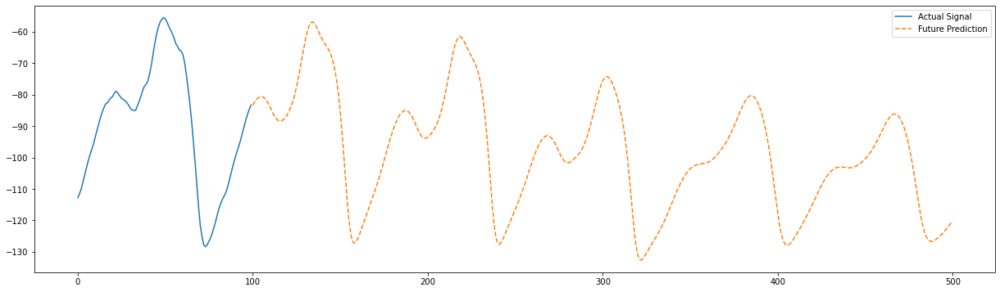

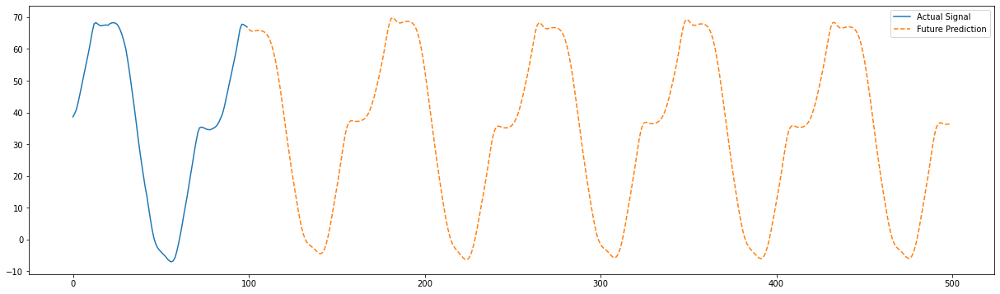

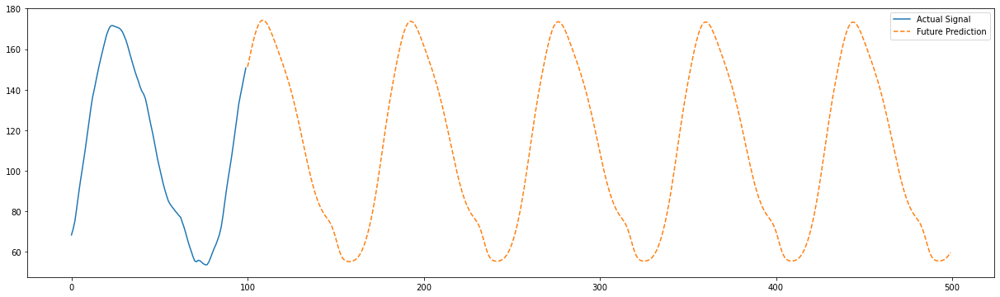

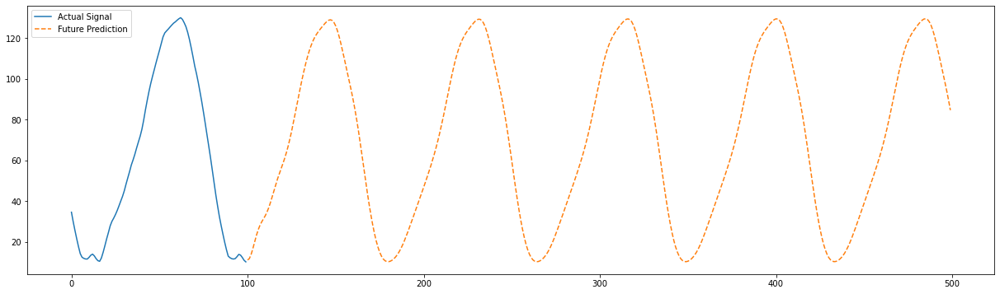

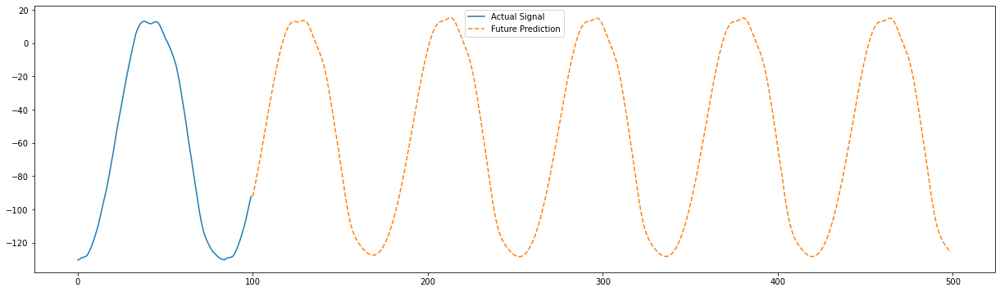

...

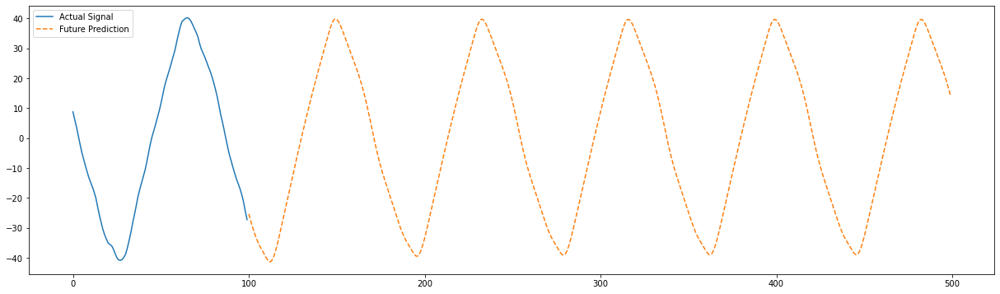

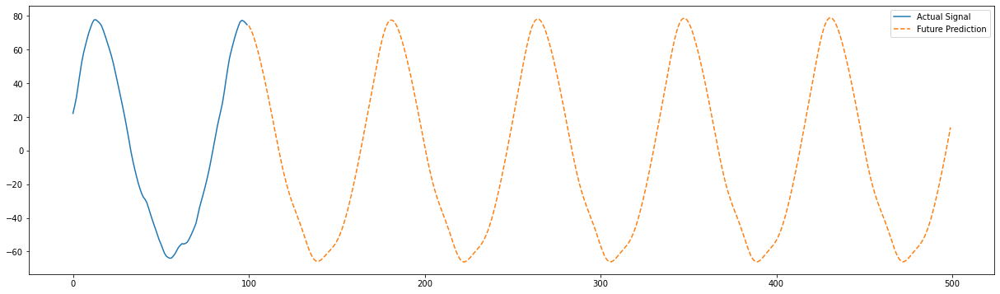

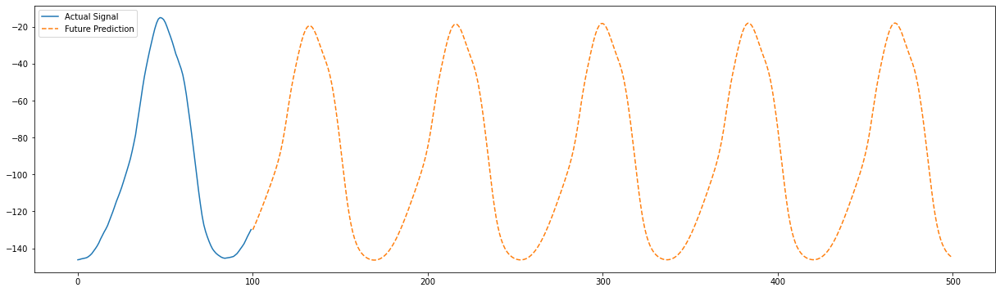

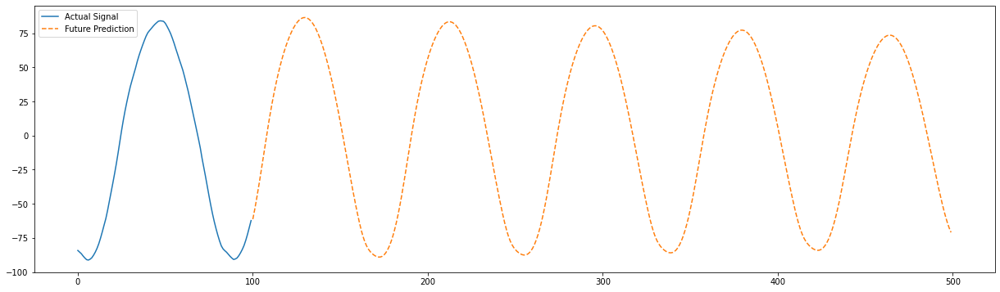

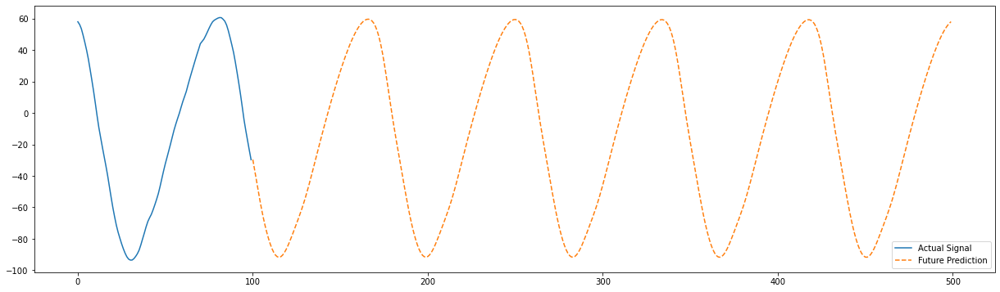

training_data shape: (1601, 1)
(1501, 100, 1)
(1501, 1)
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_26 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
lstm_27 (LSTM)               (None, 100)               80400     
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 101       
Total params: 121,301
Trainable params: 121,301
Non-trainable params: 0
_________________________________________________________________
the 0 signal
Epoch 1/500
38/38 [==============================] - 4s 68ms/step - loss: 0.0100 - val_loss: 0.0051
Epoch 2/500
38/38 [==============================] - 2s 64ms/step - loss: 0.0022 - val_loss: 0.0019
Epoch 3/500
38/38 [==============================] - 2s 63ms/step - loss: 0.0011 - val_loss: 0.0016
Epoch 4/

Epoch 69/500
38/38 [==============================] - 2s 62ms/step - loss: 2.3907e-05 - val_loss: 2.6420e-05
Epoch 70/500
38/38 [==============================] - 2s 64ms/step - loss: 2.5061e-05 - val_loss: 2.1646e-05
Epoch 71/500
38/38 [==============================] - 3s 66ms/step - loss: 1.9655e-05 - val_loss: 1.3539e-05
Epoch 72/500
38/38 [==============================] - 3s 65ms/step - loss: 1.5563e-05 - val_loss: 2.7970e-05
Epoch 73/500
38/38 [==============================] - 2s 65ms/step - loss: 1.5611e-05 - val_loss: 1.4381e-05
Epoch 74/500
38/38 [==============================] - 2s 64ms/step - loss: 1.9814e-05 - val_loss: 1.7219e-04
Epoch 75/500
38/38 [==============================] - 3s 67ms/step - loss: 3.4385e-05 - val_loss: 1.7125e-05
Epoch 76/500
38/38 [==============================] - 2s 58ms/step - loss: 2.2946e-05 - val_loss: 2.5752e-05
Epoch 77/500
38/38 [==============================] - 2s 60ms/step - loss: 1.7172e-05 - val_loss: 2.1476e-05
Epoch 78/500
38/38 

38/38 [==============================] - 2s 64ms/step - loss: 7.4749e-06 - val_loss: 7.5684e-06
Epoch 215/500
38/38 [==============================] - 3s 65ms/step - loss: 7.7556e-06 - val_loss: 7.8708e-06
Epoch 216/500
38/38 [==============================] - 3s 69ms/step - loss: 7.6310e-06 - val_loss: 7.5360e-06
Epoch 217/500
38/38 [==============================] - 2s 63ms/step - loss: 7.9256e-06 - val_loss: 9.2414e-06
Epoch 218/500
38/38 [==============================] - 2s 60ms/step - loss: 8.0338e-06 - val_loss: 7.4330e-06
Epoch 219/500
38/38 [==============================] - 2s 64ms/step - loss: 7.6761e-06 - val_loss: 7.3880e-06
Epoch 220/500
38/38 [==============================] - 2s 59ms/step - loss: 7.4534e-06 - val_loss: 7.5489e-06
Epoch 221/500
38/38 [==============================] - 2s 62ms/step - loss: 7.6340e-06 - val_loss: 7.4237e-06
Epoch 222/500
38/38 [==============================] - 3s 66ms/step - loss: 7.5487e-06 - val_loss: 7.8540e-06
Epoch 223/500
38/38 [===

38/38 [==============================] - 2s 57ms/step - loss: 6.9743e-06 - val_loss: 7.0189e-06
Epoch 288/500
38/38 [==============================] - 2s 62ms/step - loss: 6.9531e-06 - val_loss: 6.9774e-06

Epoch 00288: ReduceLROnPlateau reducing learning rate to 3.906250185536919e-06.
Epoch 289/500
38/38 [==============================] - 2s 60ms/step - loss: 6.9543e-06 - val_loss: 7.0111e-06
Epoch 290/500
38/38 [==============================] - 2s 60ms/step - loss: 6.9074e-06 - val_loss: 7.1021e-06
Epoch 291/500
38/38 [==============================] - 2s 60ms/step - loss: 6.9772e-06 - val_loss: 7.0124e-06
Epoch 292/500
38/38 [==============================] - 2s 55ms/step - loss: 6.9423e-06 - val_loss: 6.9136e-06
Epoch 293/500
38/38 [==============================] - 2s 57ms/step - loss: 6.9017e-06 - val_loss: 6.9113e-06
Epoch 294/500
38/38 [==============================] - 2s 60ms/step - loss: 6.9122e-06 - val_loss: 6.9010e-06
Epoch 295/500
38/38 [==============================] 

38/38 [==============================] - 2s 65ms/step - loss: 6.7702e-06 - val_loss: 6.8139e-06
Epoch 432/500
38/38 [==============================] - 2s 63ms/step - loss: 6.7685e-06 - val_loss: 6.8204e-06
Epoch 433/500
38/38 [==============================] - 2s 61ms/step - loss: 6.7681e-06 - val_loss: 6.8284e-06
Epoch 434/500
38/38 [==============================] - 2s 65ms/step - loss: 6.7687e-06 - val_loss: 6.8166e-06
Epoch 435/500
38/38 [==============================] - 2s 63ms/step - loss: 6.7683e-06 - val_loss: 6.8242e-06
Epoch 436/500
38/38 [==============================] - 2s 59ms/step - loss: 6.7689e-06 - val_loss: 6.8185e-06
Epoch 437/500
38/38 [==============================] - 2s 65ms/step - loss: 6.7697e-06 - val_loss: 6.8229e-06

Epoch 00437: ReduceLROnPlateau reducing learning rate to 6.103515914901436e-08.
Epoch 438/500
38/38 [==============================] - 2s 63ms/step - loss: 6.7668e-06 - val_loss: 6.8238e-06
Epoch 439/500
38/38 [==============================] 

Epoch 67/500
38/38 [==============================] - 2s 63ms/step - loss: 8.4393e-05 - val_loss: 1.3673e-04
Epoch 68/500
38/38 [==============================] - 2s 58ms/step - loss: 8.1086e-05 - val_loss: 1.1519e-04
Epoch 69/500
38/38 [==============================] - 2s 62ms/step - loss: 8.1645e-05 - val_loss: 1.1048e-04
Epoch 70/500
38/38 [==============================] - 2s 65ms/step - loss: 7.1547e-05 - val_loss: 1.1816e-04
Epoch 71/500
38/38 [==============================] - 2s 61ms/step - loss: 7.6527e-05 - val_loss: 1.2253e-04
Epoch 72/500
38/38 [==============================] - 2s 63ms/step - loss: 8.1144e-05 - val_loss: 1.5843e-04
Epoch 73/500
38/38 [==============================] - 2s 61ms/step - loss: 8.1553e-05 - val_loss: 1.2040e-04
Epoch 74/500
38/38 [==============================] - 2s 64ms/step - loss: 8.8047e-05 - val_loss: 1.2144e-04
Epoch 75/500
38/38 [==============================] - 2s 62ms/step - loss: 7.9481e-05 - val_loss: 1.5277e-04
Epoch 76/500
38/38 

Epoch 142/500
38/38 [==============================] - 2s 60ms/step - loss: 4.0122e-05 - val_loss: 5.7046e-05
Epoch 143/500
38/38 [==============================] - 2s 56ms/step - loss: 4.9136e-05 - val_loss: 1.1699e-04
Epoch 144/500
38/38 [==============================] - 2s 65ms/step - loss: 7.3525e-05 - val_loss: 6.4335e-05
Epoch 145/500
38/38 [==============================] - 2s 61ms/step - loss: 4.7283e-05 - val_loss: 7.6220e-05
Epoch 146/500
38/38 [==============================] - 2s 60ms/step - loss: 6.1962e-05 - val_loss: 7.9567e-05
Epoch 147/500
38/38 [==============================] - 2s 63ms/step - loss: 3.8873e-05 - val_loss: 5.3052e-05
Epoch 148/500
38/38 [==============================] - 2s 62ms/step - loss: 3.5640e-05 - val_loss: 6.5630e-05
Epoch 149/500
38/38 [==============================] - 2s 56ms/step - loss: 3.9634e-05 - val_loss: 6.8297e-05
Epoch 150/500
38/38 [==============================] - 2s 60ms/step - loss: 5.2967e-05 - val_loss: 4.2865e-05
Epoch 151/

38/38 [==============================] - 3s 68ms/step - loss: 1.6570e-05 - val_loss: 1.8593e-05
Epoch 216/500
38/38 [==============================] - 3s 70ms/step - loss: 1.5240e-05 - val_loss: 2.2371e-05
Epoch 217/500
38/38 [==============================] - 2s 61ms/step - loss: 1.7957e-05 - val_loss: 1.8687e-05
Epoch 218/500
38/38 [==============================] - 2s 66ms/step - loss: 1.6301e-05 - val_loss: 1.8802e-05

Epoch 00218: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
Epoch 219/500
38/38 [==============================] - 2s 62ms/step - loss: 1.3148e-05 - val_loss: 1.6321e-05
Epoch 220/500
38/38 [==============================] - 2s 65ms/step - loss: 1.3950e-05 - val_loss: 1.7786e-05
Epoch 221/500
38/38 [==============================] - 2s 59ms/step - loss: 1.6947e-05 - val_loss: 1.7096e-05
Epoch 222/500
38/38 [==============================] - 2s 64ms/step - loss: 1.2853e-05 - val_loss: 1.5845e-05
Epoch 223/500
38/38 [==============================] -

Epoch 359/500
38/38 [==============================] - 2s 61ms/step - loss: 9.2990e-06 - val_loss: 1.1207e-05
Epoch 360/500
38/38 [==============================] - 2s 61ms/step - loss: 9.2814e-06 - val_loss: 1.1154e-05
Epoch 361/500
38/38 [==============================] - 2s 64ms/step - loss: 9.2549e-06 - val_loss: 1.1109e-05
Epoch 362/500
38/38 [==============================] - 2s 58ms/step - loss: 9.2533e-06 - val_loss: 1.1154e-05
Epoch 363/500
38/38 [==============================] - 2s 59ms/step - loss: 9.2552e-06 - val_loss: 1.1199e-05

Epoch 00363: ReduceLROnPlateau reducing learning rate to 4.882812731921149e-07.
Epoch 364/500
38/38 [==============================] - 3s 68ms/step - loss: 9.2668e-06 - val_loss: 1.1143e-05
Epoch 365/500
38/38 [==============================] - 2s 62ms/step - loss: 9.2304e-06 - val_loss: 1.1102e-05
Epoch 366/500
38/38 [==============================] - 2s 62ms/step - loss: 9.2368e-06 - val_loss: 1.1172e-05
Epoch 367/500
38/38 [==================

38/38 [==============================] - 3s 67ms/step - loss: 9.2019e-06 - val_loss: 1.1135e-05
Epoch 498/500
38/38 [==============================] - 2s 62ms/step - loss: 9.2019e-06 - val_loss: 1.1135e-05
Epoch 499/500
38/38 [==============================] - 2s 62ms/step - loss: 9.2019e-06 - val_loss: 1.1135e-05
Epoch 500/500
38/38 [==============================] - 3s 66ms/step - loss: 9.2019e-06 - val_loss: 1.1135e-05
time spend for training: 1199.9474220530028
time spend for prediction: 8.239123651001137
training_data shape: (1601, 1)
(1501, 100, 1)
(1501, 1)
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_30 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
lstm_31 (LSTM)               (None, 100)               80400     
_________________________________________________________________
dense_15 (

38/38 [==============================] - 3s 67ms/step - loss: 2.7429e-05 - val_loss: 6.1015e-05
Epoch 138/500
38/38 [==============================] - 3s 67ms/step - loss: 2.9719e-05 - val_loss: 3.9065e-05
Epoch 139/500
38/38 [==============================] - 2s 58ms/step - loss: 2.6405e-05 - val_loss: 4.0416e-05
Epoch 140/500
38/38 [==============================] - 2s 64ms/step - loss: 2.6789e-05 - val_loss: 5.4700e-05

Epoch 00140: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.
Epoch 141/500
38/38 [==============================] - 2s 62ms/step - loss: 2.8812e-05 - val_loss: 3.9432e-05
Epoch 142/500
38/38 [==============================] - 2s 61ms/step - loss: 2.6575e-05 - val_loss: 3.7530e-05
Epoch 143/500
38/38 [==============================] - 2s 65ms/step - loss: 2.4154e-05 - val_loss: 3.8954e-05
Epoch 144/500
38/38 [==============================] - 3s 68ms/step - loss: 2.5465e-05 - val_loss: 3.5091e-05
Epoch 145/500
38/38 [==============================] 

Epoch 283/500
38/38 [==============================] - 2s 56ms/step - loss: 1.7071e-05 - val_loss: 2.5615e-05
Epoch 284/500
38/38 [==============================] - 2s 58ms/step - loss: 1.7807e-05 - val_loss: 2.8282e-05
Epoch 285/500
38/38 [==============================] - 2s 60ms/step - loss: 1.8321e-05 - val_loss: 2.8094e-05
Epoch 286/500
38/38 [==============================] - 2s 57ms/step - loss: 1.7283e-05 - val_loss: 2.5301e-05
Epoch 287/500
38/38 [==============================] - 2s 56ms/step - loss: 1.7123e-05 - val_loss: 2.6091e-05
Epoch 288/500
38/38 [==============================] - 2s 59ms/step - loss: 1.6851e-05 - val_loss: 2.5235e-05
Epoch 289/500
38/38 [==============================] - 2s 63ms/step - loss: 1.7198e-05 - val_loss: 2.5164e-05
Epoch 290/500
38/38 [==============================] - 2s 56ms/step - loss: 1.6958e-05 - val_loss: 2.5213e-05
Epoch 291/500
38/38 [==============================] - 2s 64ms/step - loss: 1.7125e-05 - val_loss: 2.6763e-05
Epoch 292/

Epoch 357/500
38/38 [==============================] - 2s 58ms/step - loss: 1.5390e-05 - val_loss: 2.4223e-05
Epoch 358/500
38/38 [==============================] - 2s 62ms/step - loss: 1.5346e-05 - val_loss: 2.4570e-05
Epoch 359/500
38/38 [==============================] - 2s 60ms/step - loss: 1.5331e-05 - val_loss: 2.3636e-05
Epoch 360/500
38/38 [==============================] - 2s 65ms/step - loss: 1.5326e-05 - val_loss: 2.3484e-05
Epoch 361/500
38/38 [==============================] - 3s 66ms/step - loss: 1.5558e-05 - val_loss: 2.3153e-05
Epoch 362/500
38/38 [==============================] - 2s 64ms/step - loss: 1.5282e-05 - val_loss: 2.3257e-05
Epoch 363/500
38/38 [==============================] - 2s 62ms/step - loss: 1.5257e-05 - val_loss: 2.3206e-05
Epoch 364/500
38/38 [==============================] - 3s 67ms/step - loss: 1.5201e-05 - val_loss: 2.4587e-05
Epoch 365/500
38/38 [==============================] - 2s 64ms/step - loss: 1.5156e-05 - val_loss: 2.3868e-05
Epoch 366/

38/38 [==============================] - 2s 53ms/step - loss: 1.4607e-05 - val_loss: 2.2946e-05
Epoch 500/500
38/38 [==============================] - 2s 56ms/step - loss: 1.4607e-05 - val_loss: 2.2944e-05
time spend for training: 1174.7687004990003
time spend for prediction: 7.961762949998956
training_data shape: (1601, 1)
(1501, 100, 1)
(1501, 1)
Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_32 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
lstm_33 (LSTM)               (None, 100)               80400     
_________________________________________________________________
dense_16 (Dense)             (None, 1)                 101       
Total params: 121,301
Trainable params: 121,301
Non-trainable params: 0
_________________________________________________________________
the 3 signal
Epoch 1/500
3

Epoch 140/500
38/38 [==============================] - 2s 60ms/step - loss: 4.8754e-05 - val_loss: 7.6810e-05
Epoch 141/500
38/38 [==============================] - 2s 62ms/step - loss: 7.5803e-05 - val_loss: 1.0379e-04
Epoch 142/500
38/38 [==============================] - 2s 60ms/step - loss: 6.0136e-05 - val_loss: 5.5040e-05
Epoch 143/500
38/38 [==============================] - 3s 65ms/step - loss: 5.0803e-05 - val_loss: 6.7375e-05
Epoch 144/500
38/38 [==============================] - 2s 63ms/step - loss: 4.3667e-05 - val_loss: 7.0626e-05
Epoch 145/500
38/38 [==============================] - 2s 64ms/step - loss: 4.2026e-05 - val_loss: 5.4204e-05
Epoch 146/500
38/38 [==============================] - 2s 60ms/step - loss: 5.8553e-05 - val_loss: 6.4848e-05
Epoch 147/500
38/38 [==============================] - 2s 65ms/step - loss: 4.5980e-05 - val_loss: 6.3591e-05
Epoch 148/500
38/38 [==============================] - 2s 64ms/step - loss: 6.0101e-05 - val_loss: 8.1108e-05
Epoch 149/

38/38 [==============================] - 2s 59ms/step - loss: 1.3825e-05 - val_loss: 1.4563e-05
Epoch 214/500
38/38 [==============================] - 2s 62ms/step - loss: 1.2889e-05 - val_loss: 1.4385e-05
Epoch 215/500
38/38 [==============================] - 2s 63ms/step - loss: 1.3589e-05 - val_loss: 1.2322e-05
Epoch 216/500
38/38 [==============================] - 2s 64ms/step - loss: 1.2314e-05 - val_loss: 1.1957e-05
Epoch 217/500
38/38 [==============================] - 2s 64ms/step - loss: 1.2045e-05 - val_loss: 1.2367e-05
Epoch 218/500
38/38 [==============================] - 2s 60ms/step - loss: 1.2558e-05 - val_loss: 1.3784e-05
Epoch 219/500
38/38 [==============================] - 2s 65ms/step - loss: 1.2701e-05 - val_loss: 1.4321e-05
Epoch 220/500
38/38 [==============================] - 3s 71ms/step - loss: 1.3843e-05 - val_loss: 1.4936e-05
Epoch 221/500
38/38 [==============================] - 2s 62ms/step - loss: 1.3365e-05 - val_loss: 1.3953e-05
Epoch 222/500
38/38 [===

38/38 [==============================] - 2s 64ms/step - loss: 9.5246e-06 - val_loss: 1.0586e-05
Epoch 356/500
38/38 [==============================] - 2s 62ms/step - loss: 9.5229e-06 - val_loss: 1.0578e-05
Epoch 357/500
38/38 [==============================] - 2s 58ms/step - loss: 9.5274e-06 - val_loss: 1.0600e-05
Epoch 358/500
38/38 [==============================] - 2s 57ms/step - loss: 9.5231e-06 - val_loss: 1.0580e-05
Epoch 359/500
38/38 [==============================] - 2s 64ms/step - loss: 9.5217e-06 - val_loss: 1.0599e-05
Epoch 360/500
38/38 [==============================] - 2s 64ms/step - loss: 9.5244e-06 - val_loss: 1.0590e-05

Epoch 00360: ReduceLROnPlateau reducing learning rate to 1.2207031829802872e-07.
Epoch 361/500
38/38 [==============================] - 2s 61ms/step - loss: 9.5228e-06 - val_loss: 1.0588e-05
Epoch 362/500
38/38 [==============================] - 3s 66ms/step - loss: 9.5199e-06 - val_loss: 1.0594e-05
Epoch 363/500
38/38 [==============================]

38/38 [==============================] - 2s 64ms/step - loss: 9.5136e-06 - val_loss: 1.0593e-05
Epoch 494/500
38/38 [==============================] - 2s 64ms/step - loss: 9.5136e-06 - val_loss: 1.0593e-05
Epoch 495/500
38/38 [==============================] - 2s 61ms/step - loss: 9.5136e-06 - val_loss: 1.0593e-05
Epoch 496/500
38/38 [==============================] - 2s 57ms/step - loss: 9.5136e-06 - val_loss: 1.0593e-05
Epoch 497/500
38/38 [==============================] - 2s 61ms/step - loss: 9.5136e-06 - val_loss: 1.0593e-05
Epoch 498/500
38/38 [==============================] - 2s 63ms/step - loss: 9.5136e-06 - val_loss: 1.0593e-05
Epoch 499/500
38/38 [==============================] - 2s 61ms/step - loss: 9.5136e-06 - val_loss: 1.0593e-05
Epoch 500/500
38/38 [==============================] - 3s 67ms/step - loss: 9.5136e-06 - val_loss: 1.0593e-05

Epoch 00500: ReduceLROnPlateau reducing learning rate to 7.450580950807417e-12.
time spend for training: 1155.173008294998
time spend

Epoch 59/500
38/38 [==============================] - 2s 62ms/step - loss: 9.3229e-05 - val_loss: 1.1034e-04
Epoch 60/500
38/38 [==============================] - 2s 59ms/step - loss: 8.1837e-05 - val_loss: 7.5931e-05
Epoch 61/500
38/38 [==============================] - 2s 58ms/step - loss: 8.6116e-05 - val_loss: 7.5412e-05
Epoch 62/500
38/38 [==============================] - 2s 61ms/step - loss: 9.2101e-05 - val_loss: 1.3999e-04
Epoch 63/500
38/38 [==============================] - 2s 56ms/step - loss: 7.9966e-05 - val_loss: 8.2889e-05
Epoch 64/500
38/38 [==============================] - 2s 57ms/step - loss: 8.8210e-05 - val_loss: 1.0620e-04
Epoch 65/500
38/38 [==============================] - 2s 60ms/step - loss: 8.5714e-05 - val_loss: 8.4983e-05
Epoch 66/500
38/38 [==============================] - 2s 58ms/step - loss: 7.7732e-05 - val_loss: 9.6791e-05
Epoch 67/500
38/38 [==============================] - 2s 60ms/step - loss: 8.2413e-05 - val_loss: 8.1188e-05
Epoch 68/500
38/38 

38/38 [==============================] - 2s 63ms/step - loss: 2.5442e-05 - val_loss: 1.9095e-05
Epoch 134/500
38/38 [==============================] - 2s 62ms/step - loss: 2.5881e-05 - val_loss: 1.7569e-05
Epoch 135/500
38/38 [==============================] - 2s 60ms/step - loss: 3.0542e-05 - val_loss: 2.0421e-05
Epoch 136/500
38/38 [==============================] - 2s 51ms/step - loss: 2.7007e-05 - val_loss: 2.3100e-05
Epoch 137/500
38/38 [==============================] - 2s 54ms/step - loss: 2.7672e-05 - val_loss: 1.9893e-05
Epoch 138/500
38/38 [==============================] - 2s 58ms/step - loss: 2.4974e-05 - val_loss: 2.0260e-05
Epoch 139/500
38/38 [==============================] - 3s 67ms/step - loss: 2.2119e-05 - val_loss: 1.8714e-05
Epoch 140/500
38/38 [==============================] - 2s 56ms/step - loss: 2.6304e-05 - val_loss: 2.3925e-05
Epoch 141/500
38/38 [==============================] - 2s 60ms/step - loss: 3.2806e-05 - val_loss: 1.9703e-05
Epoch 142/500
38/38 [===

38/38 [==============================] - 2s 63ms/step - loss: 1.4965e-05 - val_loss: 1.3137e-05
Epoch 275/500
38/38 [==============================] - 3s 67ms/step - loss: 1.4973e-05 - val_loss: 1.3108e-05
Epoch 276/500
38/38 [==============================] - 3s 66ms/step - loss: 1.4961e-05 - val_loss: 1.3149e-05
Epoch 277/500
38/38 [==============================] - 2s 59ms/step - loss: 1.4970e-05 - val_loss: 1.3122e-05
Epoch 278/500
38/38 [==============================] - 3s 66ms/step - loss: 1.4977e-05 - val_loss: 1.3129e-05
Epoch 279/500
38/38 [==============================] - 2s 63ms/step - loss: 1.4973e-05 - val_loss: 1.3110e-05
Epoch 280/500
38/38 [==============================] - 3s 70ms/step - loss: 1.4975e-05 - val_loss: 1.3096e-05
Epoch 281/500
38/38 [==============================] - 2s 65ms/step - loss: 1.4989e-05 - val_loss: 1.3143e-05

Epoch 00281: ReduceLROnPlateau reducing learning rate to 1.2207031829802872e-07.
Epoch 282/500
38/38 [==============================]

38/38 [==============================] - 2s 63ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 413/500
38/38 [==============================] - 2s 64ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 414/500
38/38 [==============================] - 2s 62ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 415/500
38/38 [==============================] - 2s 65ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 416/500
38/38 [==============================] - 2s 62ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 417/500
38/38 [==============================] - 3s 67ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 418/500
38/38 [==============================] - 3s 66ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 419/500
38/38 [==============================] - 2s 62ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 420/500
38/38 [==============================] - 2s 64ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 421/500
38/38 [===

38/38 [==============================] - 2s 56ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 483/500
38/38 [==============================] - 2s 60ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 484/500
38/38 [==============================] - 2s 58ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 485/500
38/38 [==============================] - 2s 63ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 486/500
38/38 [==============================] - 2s 62ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 487/500
38/38 [==============================] - 2s 62ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 488/500
38/38 [==============================] - 2s 60ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 489/500
38/38 [==============================] - 2s 56ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 490/500
38/38 [==============================] - 2s 57ms/step - loss: 1.4949e-05 - val_loss: 1.3130e-05
Epoch 491/500
38/38 [===

38/38 [==============================] - 2s 61ms/step - loss: 3.7980e-05 - val_loss: 3.5140e-05
Epoch 123/500
38/38 [==============================] - 2s 60ms/step - loss: 3.2795e-05 - val_loss: 5.6920e-05
Epoch 124/500
38/38 [==============================] - 2s 61ms/step - loss: 3.1873e-05 - val_loss: 3.3095e-05
Epoch 125/500
38/38 [==============================] - 2s 56ms/step - loss: 3.7648e-05 - val_loss: 3.3721e-05
Epoch 126/500
38/38 [==============================] - 2s 53ms/step - loss: 3.3855e-05 - val_loss: 3.1501e-05
Epoch 127/500
38/38 [==============================] - 2s 63ms/step - loss: 3.5115e-05 - val_loss: 6.6765e-05
Epoch 128/500
38/38 [==============================] - 3s 64ms/step - loss: 3.5824e-05 - val_loss: 3.3800e-05

Epoch 00128: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 129/500
38/38 [==============================] - 2s 59ms/step - loss: 2.8458e-05 - val_loss: 3.0853e-05
Epoch 130/500
38/38 [==============================] 

38/38 [==============================] - 2s 56ms/step - loss: 1.5508e-05 - val_loss: 2.0003e-05
Epoch 268/500
38/38 [==============================] - 2s 59ms/step - loss: 1.5483e-05 - val_loss: 2.0605e-05
Epoch 269/500
38/38 [==============================] - 2s 64ms/step - loss: 1.5787e-05 - val_loss: 1.8052e-05
Epoch 270/500
38/38 [==============================] - 3s 67ms/step - loss: 1.5719e-05 - val_loss: 2.1201e-05
Epoch 271/500
38/38 [==============================] - 2s 62ms/step - loss: 1.5801e-05 - val_loss: 1.8189e-05
Epoch 272/500
38/38 [==============================] - 2s 57ms/step - loss: 1.5379e-05 - val_loss: 1.7904e-05
Epoch 273/500
38/38 [==============================] - 2s 64ms/step - loss: 1.5797e-05 - val_loss: 1.8449e-05
Epoch 274/500
38/38 [==============================] - 2s 59ms/step - loss: 1.5652e-05 - val_loss: 1.7957e-05
Epoch 275/500
38/38 [==============================] - 2s 63ms/step - loss: 1.5697e-05 - val_loss: 1.8269e-05
Epoch 276/500
38/38 [===

38/38 [==============================] - 2s 61ms/step - loss: 1.4045e-05 - val_loss: 1.6799e-05
Epoch 411/500
38/38 [==============================] - 3s 69ms/step - loss: 1.4044e-05 - val_loss: 1.6809e-05
Epoch 412/500
38/38 [==============================] - 2s 64ms/step - loss: 1.4059e-05 - val_loss: 1.6817e-05
Epoch 413/500
38/38 [==============================] - 2s 61ms/step - loss: 1.4054e-05 - val_loss: 1.6825e-05
Epoch 414/500
38/38 [==============================] - 2s 65ms/step - loss: 1.4054e-05 - val_loss: 1.6797e-05
Epoch 415/500
38/38 [==============================] - 3s 68ms/step - loss: 1.4045e-05 - val_loss: 1.6819e-05

Epoch 00415: ReduceLROnPlateau reducing learning rate to 6.103515914901436e-08.
Epoch 416/500
38/38 [==============================] - 2s 60ms/step - loss: 1.4042e-05 - val_loss: 1.6812e-05
Epoch 417/500
38/38 [==============================] - 2s 64ms/step - loss: 1.4040e-05 - val_loss: 1.6810e-05
Epoch 418/500
38/38 [==============================] 

Epoch 45/500
38/38 [==============================] - 2s 58ms/step - loss: 8.0862e-05 - val_loss: 1.5167e-04
Epoch 46/500
38/38 [==============================] - 2s 62ms/step - loss: 9.5929e-05 - val_loss: 1.2109e-04
Epoch 47/500
38/38 [==============================] - 2s 62ms/step - loss: 8.3139e-05 - val_loss: 1.0541e-04
Epoch 48/500
38/38 [==============================] - 2s 62ms/step - loss: 6.6284e-05 - val_loss: 8.0363e-05
Epoch 49/500
38/38 [==============================] - 3s 67ms/step - loss: 6.0066e-05 - val_loss: 7.4780e-05
Epoch 50/500
38/38 [==============================] - 2s 59ms/step - loss: 7.0987e-05 - val_loss: 1.0350e-04
Epoch 51/500
38/38 [==============================] - 2s 57ms/step - loss: 5.4403e-05 - val_loss: 9.0897e-05
Epoch 52/500
38/38 [==============================] - 2s 62ms/step - loss: 5.1745e-05 - val_loss: 1.6140e-04
Epoch 53/500
38/38 [==============================] - 2s 65ms/step - loss: 6.0848e-05 - val_loss: 7.8710e-05
Epoch 54/500
38/38 

Epoch 120/500
38/38 [==============================] - 3s 69ms/step - loss: 1.8516e-05 - val_loss: 1.7909e-05
Epoch 121/500
38/38 [==============================] - 2s 65ms/step - loss: 2.3884e-05 - val_loss: 1.9108e-05
Epoch 122/500
38/38 [==============================] - 2s 61ms/step - loss: 2.5828e-05 - val_loss: 2.1381e-05
Epoch 123/500
38/38 [==============================] - 2s 64ms/step - loss: 1.9933e-05 - val_loss: 1.7784e-05
Epoch 124/500
38/38 [==============================] - 2s 63ms/step - loss: 2.9319e-05 - val_loss: 5.4006e-05
Epoch 125/500
38/38 [==============================] - 3s 68ms/step - loss: 2.4561e-05 - val_loss: 9.0275e-05
Epoch 126/500
38/38 [==============================] - 2s 65ms/step - loss: 2.6512e-05 - val_loss: 3.8982e-05
Epoch 127/500
38/38 [==============================] - 3s 67ms/step - loss: 2.9184e-05 - val_loss: 2.6134e-05
Epoch 128/500
38/38 [==============================] - 2s 61ms/step - loss: 2.7419e-05 - val_loss: 9.5679e-05
Epoch 129/

38/38 [==============================] - 2s 61ms/step - loss: 8.8902e-06 - val_loss: 1.0518e-05
Epoch 267/500
38/38 [==============================] - 2s 62ms/step - loss: 1.0425e-05 - val_loss: 1.5022e-05
Epoch 268/500
38/38 [==============================] - 2s 59ms/step - loss: 1.0681e-05 - val_loss: 1.0482e-05
Epoch 269/500
38/38 [==============================] - 2s 62ms/step - loss: 1.0040e-05 - val_loss: 1.2150e-05
Epoch 270/500
38/38 [==============================] - 2s 59ms/step - loss: 8.6694e-06 - val_loss: 1.3604e-05
Epoch 271/500
38/38 [==============================] - 2s 64ms/step - loss: 9.7709e-06 - val_loss: 1.3603e-05
Epoch 272/500
38/38 [==============================] - 2s 60ms/step - loss: 9.9992e-06 - val_loss: 9.8945e-06
Epoch 273/500
38/38 [==============================] - 2s 58ms/step - loss: 8.7128e-06 - val_loss: 9.8344e-06
Epoch 274/500
38/38 [==============================] - 2s 59ms/step - loss: 9.5327e-06 - val_loss: 1.0496e-05
Epoch 275/500
38/38 [===

38/38 [==============================] - 2s 59ms/step - loss: 7.3091e-06 - val_loss: 9.4929e-06
Epoch 408/500
38/38 [==============================] - 2s 62ms/step - loss: 7.3070e-06 - val_loss: 9.5042e-06
Epoch 409/500
38/38 [==============================] - 2s 61ms/step - loss: 7.3060e-06 - val_loss: 9.4786e-06
Epoch 410/500
38/38 [==============================] - 2s 64ms/step - loss: 7.3077e-06 - val_loss: 9.4881e-06

Epoch 00410: ReduceLROnPlateau reducing learning rate to 6.103515914901436e-08.
Epoch 411/500
38/38 [==============================] - 2s 63ms/step - loss: 7.3062e-06 - val_loss: 9.4865e-06
Epoch 412/500
38/38 [==============================] - 2s 53ms/step - loss: 7.3067e-06 - val_loss: 9.4951e-06
Epoch 413/500
38/38 [==============================] - 2s 61ms/step - loss: 7.3060e-06 - val_loss: 9.4917e-06
Epoch 414/500
38/38 [==============================] - 2s 61ms/step - loss: 7.3079e-06 - val_loss: 9.4986e-06
Epoch 415/500
38/38 [==============================] 

38/38 [==============================] - 2s 58ms/step - loss: 9.1235e-05 - val_loss: 8.1181e-05
Epoch 42/500
38/38 [==============================] - 2s 64ms/step - loss: 8.9411e-05 - val_loss: 7.9060e-05
Epoch 43/500
38/38 [==============================] - 2s 61ms/step - loss: 8.6056e-05 - val_loss: 1.0611e-04
Epoch 44/500
38/38 [==============================] - 2s 59ms/step - loss: 8.3475e-05 - val_loss: 7.7109e-05
Epoch 45/500
38/38 [==============================] - 2s 64ms/step - loss: 1.1756e-04 - val_loss: 9.8586e-05
Epoch 46/500
38/38 [==============================] - 2s 63ms/step - loss: 8.8596e-05 - val_loss: 7.8155e-05
Epoch 47/500
38/38 [==============================] - 2s 61ms/step - loss: 8.7990e-05 - val_loss: 6.1609e-05
Epoch 48/500
38/38 [==============================] - 2s 63ms/step - loss: 8.0705e-05 - val_loss: 1.1243e-04
Epoch 49/500
38/38 [==============================] - 3s 68ms/step - loss: 9.1388e-05 - val_loss: 1.4519e-04
Epoch 50/500
38/38 [============

Epoch 114/500
38/38 [==============================] - 2s 61ms/step - loss: 3.6599e-05 - val_loss: 4.3603e-05
Epoch 115/500
38/38 [==============================] - 2s 60ms/step - loss: 3.7837e-05 - val_loss: 4.2300e-05
Epoch 116/500
38/38 [==============================] - 2s 63ms/step - loss: 3.5937e-05 - val_loss: 3.8235e-05
Epoch 117/500
38/38 [==============================] - 2s 62ms/step - loss: 3.7968e-05 - val_loss: 4.7327e-05
Epoch 118/500
38/38 [==============================] - 2s 64ms/step - loss: 3.7731e-05 - val_loss: 4.4876e-05
Epoch 119/500
38/38 [==============================] - 2s 58ms/step - loss: 3.5859e-05 - val_loss: 4.1594e-05
Epoch 120/500
38/38 [==============================] - 3s 68ms/step - loss: 3.5745e-05 - val_loss: 4.9255e-05
Epoch 121/500
38/38 [==============================] - 2s 64ms/step - loss: 3.7384e-05 - val_loss: 4.1448e-05
Epoch 122/500
38/38 [==============================] - 2s 63ms/step - loss: 3.5874e-05 - val_loss: 3.7608e-05
Epoch 123/

38/38 [==============================] - 2s 58ms/step - loss: 2.7995e-05 - val_loss: 3.4590e-05
Epoch 258/500
38/38 [==============================] - 2s 58ms/step - loss: 2.7995e-05 - val_loss: 3.4567e-05
Epoch 259/500
38/38 [==============================] - 2s 54ms/step - loss: 2.7993e-05 - val_loss: 3.4566e-05
Epoch 260/500
38/38 [==============================] - 2s 61ms/step - loss: 2.8003e-05 - val_loss: 3.4596e-05
Epoch 261/500
38/38 [==============================] - 2s 58ms/step - loss: 2.7991e-05 - val_loss: 3.4569e-05
Epoch 262/500
38/38 [==============================] - 2s 58ms/step - loss: 2.8000e-05 - val_loss: 3.4533e-05
Epoch 263/500
38/38 [==============================] - 2s 52ms/step - loss: 2.7981e-05 - val_loss: 3.4538e-05
Epoch 264/500
38/38 [==============================] - 2s 57ms/step - loss: 2.8024e-05 - val_loss: 3.4596e-05
Epoch 265/500
38/38 [==============================] - 2s 60ms/step - loss: 2.8017e-05 - val_loss: 3.4566e-05
Epoch 266/500
38/38 [===

38/38 [==============================] - 2s 63ms/step - loss: 2.7926e-05 - val_loss: 3.4563e-05
Epoch 328/500
38/38 [==============================] - 2s 65ms/step - loss: 2.7926e-05 - val_loss: 3.4563e-05
Epoch 329/500
38/38 [==============================] - 2s 61ms/step - loss: 2.7926e-05 - val_loss: 3.4563e-05
Epoch 330/500
38/38 [==============================] - 2s 60ms/step - loss: 2.7926e-05 - val_loss: 3.4563e-05
Epoch 331/500
38/38 [==============================] - 2s 60ms/step - loss: 2.7926e-05 - val_loss: 3.4563e-05
Epoch 332/500
38/38 [==============================] - 2s 55ms/step - loss: 2.7926e-05 - val_loss: 3.4563e-05
Epoch 333/500
38/38 [==============================] - 3s 69ms/step - loss: 2.7926e-05 - val_loss: 3.4563e-05
Epoch 334/500
38/38 [==============================] - 2s 59ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 335/500
38/38 [==============================] - 2s 60ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 336/500
38/38 [===

38/38 [==============================] - 2s 52ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 398/500
38/38 [==============================] - 2s 60ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 399/500
38/38 [==============================] - 2s 55ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 400/500
38/38 [==============================] - 2s 58ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 401/500
38/38 [==============================] - 2s 61ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 402/500
38/38 [==============================] - 2s 62ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 403/500
38/38 [==============================] - 2s 60ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 404/500
38/38 [==============================] - 2s 60ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 405/500
38/38 [==============================] - 2s 59ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 406/500
38/38 [===

38/38 [==============================] - 2s 63ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 468/500
38/38 [==============================] - 2s 62ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 469/500
38/38 [==============================] - 2s 58ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 470/500
38/38 [==============================] - 2s 61ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 471/500
38/38 [==============================] - 2s 61ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 472/500
38/38 [==============================] - 2s 59ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 473/500
38/38 [==============================] - 2s 59ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 474/500
38/38 [==============================] - 2s 65ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 475/500
38/38 [==============================] - 2s 61ms/step - loss: 2.7925e-05 - val_loss: 3.4563e-05
Epoch 476/500
38/38 [===

Epoch 105/500
38/38 [==============================] - 2s 61ms/step - loss: 2.4304e-05 - val_loss: 3.0947e-05
Epoch 106/500
38/38 [==============================] - 2s 59ms/step - loss: 2.4315e-05 - val_loss: 3.0557e-05
Epoch 107/500
38/38 [==============================] - 2s 64ms/step - loss: 2.5084e-05 - val_loss: 3.3841e-05
Epoch 108/500
38/38 [==============================] - 3s 74ms/step - loss: 2.4432e-05 - val_loss: 3.1722e-05
Epoch 109/500
38/38 [==============================] - 3s 72ms/step - loss: 2.4675e-05 - val_loss: 3.1580e-05
Epoch 110/500
38/38 [==============================] - 3s 66ms/step - loss: 2.2351e-05 - val_loss: 3.2026e-05
Epoch 111/500
38/38 [==============================] - 2s 64ms/step - loss: 2.5727e-05 - val_loss: 3.0855e-05
Epoch 112/500
38/38 [==============================] - 2s 64ms/step - loss: 2.2419e-05 - val_loss: 2.8318e-05
Epoch 113/500
38/38 [==============================] - 3s 66ms/step - loss: 2.1889e-05 - val_loss: 3.5920e-05
Epoch 114/

38/38 [==============================] - 3s 69ms/step - loss: 1.4306e-05 - val_loss: 2.2263e-05
Epoch 250/500
38/38 [==============================] - 2s 62ms/step - loss: 1.4253e-05 - val_loss: 2.2766e-05
Epoch 251/500
38/38 [==============================] - 2s 66ms/step - loss: 1.4257e-05 - val_loss: 2.2009e-05
Epoch 252/500
38/38 [==============================] - 2s 63ms/step - loss: 1.4308e-05 - val_loss: 2.2514e-05
Epoch 253/500
38/38 [==============================] - 3s 71ms/step - loss: 1.4282e-05 - val_loss: 2.3111e-05
Epoch 254/500
38/38 [==============================] - 3s 69ms/step - loss: 1.4449e-05 - val_loss: 2.2182e-05
Epoch 255/500
38/38 [==============================] - 3s 67ms/step - loss: 1.4308e-05 - val_loss: 2.2419e-05
Epoch 256/500
38/38 [==============================] - 3s 67ms/step - loss: 1.4168e-05 - val_loss: 2.2399e-05
Epoch 257/500
38/38 [==============================] - 3s 67ms/step - loss: 1.4321e-05 - val_loss: 2.2526e-05
Epoch 258/500
38/38 [===

38/38 [==============================] - 2s 65ms/step - loss: 1.4038e-05 - val_loss: 2.2229e-05
Epoch 389/500
38/38 [==============================] - 3s 65ms/step - loss: 1.4038e-05 - val_loss: 2.2229e-05
Epoch 390/500
38/38 [==============================] - 2s 60ms/step - loss: 1.4038e-05 - val_loss: 2.2229e-05
Epoch 391/500
38/38 [==============================] - 2s 58ms/step - loss: 1.4038e-05 - val_loss: 2.2229e-05

Epoch 00391: ReduceLROnPlateau reducing learning rate to 2.3841859042583735e-10.
Epoch 392/500
38/38 [==============================] - 2s 65ms/step - loss: 1.4038e-05 - val_loss: 2.2229e-05
Epoch 393/500
38/38 [==============================] - 3s 68ms/step - loss: 1.4038e-05 - val_loss: 2.2229e-05
Epoch 394/500
38/38 [==============================] - 2s 58ms/step - loss: 1.4038e-05 - val_loss: 2.2229e-05
Epoch 395/500
38/38 [==============================] - 2s 65ms/step - loss: 1.4038e-05 - val_loss: 2.2229e-05
Epoch 396/500
38/38 [==============================]

Epoch 21/500
38/38 [==============================] - 2s 55ms/step - loss: 2.3933e-04 - val_loss: 3.5312e-04
Epoch 22/500
38/38 [==============================] - 2s 56ms/step - loss: 2.5131e-04 - val_loss: 4.0163e-04
Epoch 23/500
38/38 [==============================] - 2s 62ms/step - loss: 2.1681e-04 - val_loss: 3.8414e-04
Epoch 24/500
38/38 [==============================] - 2s 62ms/step - loss: 2.4023e-04 - val_loss: 3.3971e-04
Epoch 25/500
38/38 [==============================] - 2s 56ms/step - loss: 2.5542e-04 - val_loss: 4.2108e-04
Epoch 26/500
38/38 [==============================] - 2s 56ms/step - loss: 2.9134e-04 - val_loss: 3.9622e-04
Epoch 27/500
38/38 [==============================] - 2s 57ms/step - loss: 2.1576e-04 - val_loss: 3.4733e-04
Epoch 28/500
38/38 [==============================] - 2s 58ms/step - loss: 1.8788e-04 - val_loss: 3.7662e-04
Epoch 29/500
38/38 [==============================] - 2s 63ms/step - loss: 2.0537e-04 - val_loss: 2.6811e-04
Epoch 30/500
38/38 

Epoch 170/500
38/38 [==============================] - 2s 54ms/step - loss: 1.5015e-05 - val_loss: 3.2464e-05
Epoch 171/500
38/38 [==============================] - 2s 55ms/step - loss: 1.8865e-05 - val_loss: 5.5525e-05
Epoch 172/500
38/38 [==============================] - 2s 58ms/step - loss: 2.4901e-05 - val_loss: 3.4760e-05
Epoch 173/500
38/38 [==============================] - 2s 62ms/step - loss: 1.9167e-05 - val_loss: 2.9948e-05
Epoch 174/500
38/38 [==============================] - 2s 57ms/step - loss: 1.7054e-05 - val_loss: 2.6212e-05
Epoch 175/500
38/38 [==============================] - 2s 57ms/step - loss: 1.6617e-05 - val_loss: 3.5695e-05
Epoch 176/500
38/38 [==============================] - 2s 58ms/step - loss: 1.9014e-05 - val_loss: 2.9842e-05

Epoch 00176: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
Epoch 177/500
38/38 [==============================] - 2s 64ms/step - loss: 1.4003e-05 - val_loss: 2.1530e-05
Epoch 178/500
38/38 [==================

Epoch 312/500
38/38 [==============================] - 2s 54ms/step - loss: 8.6486e-06 - val_loss: 1.4867e-05
Epoch 313/500
38/38 [==============================] - 2s 60ms/step - loss: 8.6550e-06 - val_loss: 1.5032e-05
Epoch 314/500
38/38 [==============================] - 2s 63ms/step - loss: 8.6475e-06 - val_loss: 1.4984e-05
Epoch 315/500
38/38 [==============================] - 2s 59ms/step - loss: 8.6618e-06 - val_loss: 1.4801e-05
Epoch 316/500
38/38 [==============================] - 2s 58ms/step - loss: 8.6408e-06 - val_loss: 1.4976e-05
Epoch 317/500
38/38 [==============================] - 2s 65ms/step - loss: 8.6421e-06 - val_loss: 1.4960e-05
Epoch 318/500
38/38 [==============================] - 2s 60ms/step - loss: 8.6404e-06 - val_loss: 1.5028e-05
Epoch 319/500
38/38 [==============================] - 2s 60ms/step - loss: 8.6545e-06 - val_loss: 1.4933e-05

Epoch 00319: ReduceLROnPlateau reducing learning rate to 4.882812731921149e-07.
Epoch 320/500
38/38 [==================

38/38 [==============================] - 2s 63ms/step - loss: 8.6129e-06 - val_loss: 1.4914e-05
Epoch 451/500
38/38 [==============================] - 2s 60ms/step - loss: 8.6129e-06 - val_loss: 1.4914e-05
Epoch 452/500
38/38 [==============================] - 2s 62ms/step - loss: 8.6129e-06 - val_loss: 1.4914e-05
Epoch 453/500
38/38 [==============================] - 3s 67ms/step - loss: 8.6129e-06 - val_loss: 1.4914e-05
Epoch 454/500
38/38 [==============================] - 2s 64ms/step - loss: 8.6129e-06 - val_loss: 1.4914e-05
Epoch 455/500
38/38 [==============================] - 2s 57ms/step - loss: 8.6129e-06 - val_loss: 1.4914e-05
Epoch 456/500
38/38 [==============================] - 2s 57ms/step - loss: 8.6129e-06 - val_loss: 1.4914e-05
Epoch 457/500
38/38 [==============================] - 2s 56ms/step - loss: 8.6129e-06 - val_loss: 1.4914e-05
Epoch 458/500
38/38 [==============================] - 2s 56ms/step - loss: 8.6129e-06 - val_loss: 1.4914e-05
Epoch 459/500
38/38 [===

38/38 [==============================] - 2s 61ms/step - loss: 2.8087e-04 - val_loss: 3.6188e-04
Epoch 14/500
38/38 [==============================] - 2s 59ms/step - loss: 2.3012e-04 - val_loss: 2.3127e-04
Epoch 15/500
38/38 [==============================] - 2s 56ms/step - loss: 2.1398e-04 - val_loss: 1.4971e-04
Epoch 16/500
38/38 [==============================] - 2s 59ms/step - loss: 2.2052e-04 - val_loss: 1.3123e-04
Epoch 17/500
38/38 [==============================] - 2s 65ms/step - loss: 1.6885e-04 - val_loss: 1.6697e-04
Epoch 18/500
38/38 [==============================] - 2s 62ms/step - loss: 1.4037e-04 - val_loss: 1.0873e-04
Epoch 19/500
38/38 [==============================] - 2s 64ms/step - loss: 1.1583e-04 - val_loss: 1.1018e-04
Epoch 20/500
38/38 [==============================] - 3s 67ms/step - loss: 1.0960e-04 - val_loss: 1.1323e-04
Epoch 21/500
38/38 [==============================] - 2s 63ms/step - loss: 1.1410e-04 - val_loss: 2.5267e-04
Epoch 22/500
38/38 [============

Epoch 159/500
38/38 [==============================] - 3s 67ms/step - loss: 1.3106e-05 - val_loss: 4.6926e-06
Epoch 160/500
38/38 [==============================] - 2s 62ms/step - loss: 1.3424e-05 - val_loss: 5.4480e-06
Epoch 161/500
38/38 [==============================] - 2s 59ms/step - loss: 1.3530e-05 - val_loss: 6.0179e-06
Epoch 162/500
38/38 [==============================] - 2s 59ms/step - loss: 1.3590e-05 - val_loss: 4.3954e-06
Epoch 163/500
38/38 [==============================] - 2s 64ms/step - loss: 1.3208e-05 - val_loss: 4.5152e-06
Epoch 164/500
38/38 [==============================] - 3s 65ms/step - loss: 1.3609e-05 - val_loss: 5.9411e-06
Epoch 165/500
38/38 [==============================] - 2s 59ms/step - loss: 1.3865e-05 - val_loss: 4.5765e-06

Epoch 00165: ReduceLROnPlateau reducing learning rate to 1.5625000742147677e-05.
Epoch 166/500
38/38 [==============================] - 2s 62ms/step - loss: 1.2962e-05 - val_loss: 4.5738e-06
Epoch 167/500
38/38 [=================

38/38 [==============================] - 3s 67ms/step - loss: 1.2462e-05 - val_loss: 4.1460e-06
Epoch 230/500
38/38 [==============================] - 3s 67ms/step - loss: 1.2457e-05 - val_loss: 4.1384e-06
Epoch 231/500
38/38 [==============================] - 3s 66ms/step - loss: 1.2473e-05 - val_loss: 4.1692e-06
Epoch 232/500
38/38 [==============================] - 3s 67ms/step - loss: 1.2458e-05 - val_loss: 4.1362e-06
Epoch 233/500
38/38 [==============================] - 3s 74ms/step - loss: 1.2462e-05 - val_loss: 4.1278e-06
Epoch 234/500
38/38 [==============================] - 2s 59ms/step - loss: 1.2454e-05 - val_loss: 4.1541e-06
Epoch 235/500
38/38 [==============================] - 2s 60ms/step - loss: 1.2455e-05 - val_loss: 4.1470e-06
Epoch 236/500
38/38 [==============================] - 2s 61ms/step - loss: 1.2454e-05 - val_loss: 4.1567e-06
Epoch 237/500
38/38 [==============================] - 2s 63ms/step - loss: 1.2456e-05 - val_loss: 4.1325e-06
Epoch 238/500
38/38 [===

38/38 [==============================] - 2s 60ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 300/500
38/38 [==============================] - 2s 60ms/step - loss: 1.2445e-05 - val_loss: 4.1442e-06
Epoch 301/500
38/38 [==============================] - 2s 58ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 302/500
38/38 [==============================] - 2s 61ms/step - loss: 1.2445e-05 - val_loss: 4.1442e-06
Epoch 303/500
38/38 [==============================] - 2s 61ms/step - loss: 1.2445e-05 - val_loss: 4.1442e-06
Epoch 304/500
38/38 [==============================] - 2s 56ms/step - loss: 1.2445e-05 - val_loss: 4.1442e-06
Epoch 305/500
38/38 [==============================] - 2s 57ms/step - loss: 1.2445e-05 - val_loss: 4.1442e-06
Epoch 306/500
38/38 [==============================] - 2s 60ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 307/500
38/38 [==============================] - 2s 65ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 308/500
38/38 [===

38/38 [==============================] - 2s 63ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 370/500
38/38 [==============================] - 2s 58ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 371/500
38/38 [==============================] - 2s 58ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 372/500
38/38 [==============================] - 2s 62ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 373/500
38/38 [==============================] - 2s 59ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 374/500
38/38 [==============================] - 2s 61ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 375/500
38/38 [==============================] - 2s 64ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 376/500
38/38 [==============================] - 2s 62ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 377/500
38/38 [==============================] - 2s 63ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 378/500
38/38 [===

38/38 [==============================] - 3s 70ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 440/500
38/38 [==============================] - 2s 59ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 441/500
38/38 [==============================] - 3s 68ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 442/500
38/38 [==============================] - 2s 56ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 443/500
38/38 [==============================] - 2s 60ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 444/500
38/38 [==============================] - 2s 59ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 445/500
38/38 [==============================] - 2s 63ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 446/500
38/38 [==============================] - 2s 58ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 447/500
38/38 [==============================] - 2s 63ms/step - loss: 1.2445e-05 - val_loss: 4.1441e-06
Epoch 448/500
38/38 [===

38/38 [==============================] - 3s 62ms/step - loss: 0.0435 - val_loss: 0.0043
Epoch 2/500
38/38 [==============================] - 2s 58ms/step - loss: 0.0014 - val_loss: 5.3753e-04
Epoch 3/500
38/38 [==============================] - 2s 59ms/step - loss: 8.4297e-04 - val_loss: 3.1284e-04
Epoch 4/500
38/38 [==============================] - 2s 59ms/step - loss: 6.4400e-04 - val_loss: 2.8126e-04
Epoch 5/500
38/38 [==============================] - 2s 57ms/step - loss: 5.5495e-04 - val_loss: 4.0877e-04
Epoch 6/500
38/38 [==============================] - 2s 62ms/step - loss: 5.3973e-04 - val_loss: 2.4081e-04
Epoch 7/500
38/38 [==============================] - 2s 62ms/step - loss: 4.8222e-04 - val_loss: 2.3789e-04
Epoch 8/500
38/38 [==============================] - 2s 62ms/step - loss: 4.4997e-04 - val_loss: 2.1139e-04
Epoch 9/500
38/38 [==============================] - 2s 61ms/step - loss: 4.3745e-04 - val_loss: 3.0303e-04
Epoch 10/500
38/38 [==============================] 

38/38 [==============================] - 2s 63ms/step - loss: 2.2717e-05 - val_loss: 2.9986e-05
Epoch 149/500
38/38 [==============================] - 2s 63ms/step - loss: 2.3591e-05 - val_loss: 2.8661e-05

Epoch 00149: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.
Epoch 150/500
38/38 [==============================] - 2s 63ms/step - loss: 2.2248e-05 - val_loss: 2.8632e-05
Epoch 151/500
38/38 [==============================] - 2s 55ms/step - loss: 2.4539e-05 - val_loss: 3.0171e-05
Epoch 152/500
38/38 [==============================] - 2s 60ms/step - loss: 2.1741e-05 - val_loss: 2.6748e-05
Epoch 153/500
38/38 [==============================] - 2s 64ms/step - loss: 2.1588e-05 - val_loss: 2.7045e-05
Epoch 154/500
38/38 [==============================] - 2s 56ms/step - loss: 2.1820e-05 - val_loss: 2.7194e-05
Epoch 155/500
38/38 [==============================] - 2s 64ms/step - loss: 2.1812e-05 - val_loss: 2.6850e-05
Epoch 156/500
38/38 [==============================] -

38/38 [==============================] - 3s 69ms/step - loss: 1.6505e-05 - val_loss: 2.2993e-05
Epoch 293/500
38/38 [==============================] - 2s 63ms/step - loss: 1.6596e-05 - val_loss: 2.2849e-05
Epoch 294/500
38/38 [==============================] - 2s 60ms/step - loss: 1.6579e-05 - val_loss: 2.2848e-05
Epoch 295/500
38/38 [==============================] - 2s 59ms/step - loss: 1.6551e-05 - val_loss: 2.2854e-05
Epoch 296/500
38/38 [==============================] - 2s 59ms/step - loss: 1.6515e-05 - val_loss: 2.2798e-05
Epoch 297/500
38/38 [==============================] - 2s 61ms/step - loss: 1.6551e-05 - val_loss: 2.2863e-05

Epoch 00297: ReduceLROnPlateau reducing learning rate to 9.765625463842298e-07.
Epoch 298/500
38/38 [==============================] - 2s 55ms/step - loss: 1.6499e-05 - val_loss: 2.2829e-05
Epoch 299/500
38/38 [==============================] - 2s 61ms/step - loss: 1.6443e-05 - val_loss: 2.2808e-05
Epoch 300/500
38/38 [==============================] 

Epoch 363/500
38/38 [==============================] - 3s 69ms/step - loss: 1.6368e-05 - val_loss: 2.2760e-05
Epoch 364/500
38/38 [==============================] - 2s 63ms/step - loss: 1.6365e-05 - val_loss: 2.2756e-05
Epoch 365/500
38/38 [==============================] - 3s 72ms/step - loss: 1.6364e-05 - val_loss: 2.2754e-05
Epoch 366/500
38/38 [==============================] - 2s 58ms/step - loss: 1.6367e-05 - val_loss: 2.2751e-05
Epoch 367/500
38/38 [==============================] - 3s 67ms/step - loss: 1.6369e-05 - val_loss: 2.2746e-05

Epoch 00367: ReduceLROnPlateau reducing learning rate to 3.051757957450718e-08.
Epoch 368/500
38/38 [==============================] - 3s 71ms/step - loss: 1.6364e-05 - val_loss: 2.2750e-05
Epoch 369/500
38/38 [==============================] - 2s 65ms/step - loss: 1.6363e-05 - val_loss: 2.2750e-05
Epoch 370/500
38/38 [==============================] - 2s 60ms/step - loss: 1.6364e-05 - val_loss: 2.2750e-05
Epoch 371/500
38/38 [==================

Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_50 (LSTM)               (None, 100, 100)          40800     
_________________________________________________________________
lstm_51 (LSTM)               (None, 100)               80400     
_________________________________________________________________
dense_25 (Dense)             (None, 1)                 101       
Total params: 121,301
Trainable params: 121,301
Non-trainable params: 0
_________________________________________________________________
the 12 signal
Epoch 1/500
38/38 [==============================] - 3s 64ms/step - loss: 0.0345 - val_loss: 0.0074
Epoch 2/500
38/38 [==============================] - 2s 66ms/step - loss: 0.0022 - val_loss: 8.4140e-04
Epoch 3/500
38/38 [==============================] - 2s 60ms/step - loss: 8.5293e-04 - val_loss: 5.7241e-04
Epoch 4/500
38/38 [==============================] 

38/38 [==============================] - 2s 63ms/step - loss: 1.7521e-05 - val_loss: 2.1913e-05
Epoch 143/500
38/38 [==============================] - 2s 64ms/step - loss: 2.0042e-05 - val_loss: 2.0513e-05
Epoch 144/500
38/38 [==============================] - 3s 72ms/step - loss: 2.1186e-05 - val_loss: 3.2108e-05
Epoch 145/500
38/38 [==============================] - 2s 62ms/step - loss: 1.9791e-05 - val_loss: 2.4447e-05
Epoch 146/500
38/38 [==============================] - 2s 64ms/step - loss: 1.8777e-05 - val_loss: 2.2670e-05
Epoch 147/500
38/38 [==============================] - 2s 63ms/step - loss: 1.7625e-05 - val_loss: 2.1494e-05
Epoch 148/500
38/38 [==============================] - 3s 67ms/step - loss: 1.7965e-05 - val_loss: 1.9594e-05
Epoch 149/500
38/38 [==============================] - 2s 58ms/step - loss: 1.9120e-05 - val_loss: 1.9661e-05
Epoch 150/500
38/38 [==============================] - 3s 70ms/step - loss: 1.7316e-05 - val_loss: 2.2942e-05
Epoch 151/500
38/38 [===

38/38 [==============================] - 2s 56ms/step - loss: 9.9234e-06 - val_loss: 1.2839e-05
Epoch 288/500
38/38 [==============================] - 2s 63ms/step - loss: 9.8439e-06 - val_loss: 1.3269e-05
Epoch 289/500
38/38 [==============================] - 2s 64ms/step - loss: 9.7655e-06 - val_loss: 1.2115e-05
Epoch 290/500
38/38 [==============================] - 2s 63ms/step - loss: 9.7190e-06 - val_loss: 1.2097e-05
Epoch 291/500
38/38 [==============================] - 3s 67ms/step - loss: 9.7496e-06 - val_loss: 1.2139e-05
Epoch 292/500
38/38 [==============================] - 2s 60ms/step - loss: 9.7632e-06 - val_loss: 1.2096e-05
Epoch 293/500
38/38 [==============================] - 2s 62ms/step - loss: 9.8319e-06 - val_loss: 1.2075e-05
Epoch 294/500
38/38 [==============================] - 2s 62ms/step - loss: 9.7110e-06 - val_loss: 1.2828e-05
Epoch 295/500
38/38 [==============================] - 2s 63ms/step - loss: 9.7037e-06 - val_loss: 1.2356e-05
Epoch 296/500
38/38 [===

38/38 [==============================] - 2s 63ms/step - loss: 9.2499e-06 - val_loss: 1.1833e-05
Epoch 430/500
38/38 [==============================] - 2s 59ms/step - loss: 9.2498e-06 - val_loss: 1.1835e-05
Epoch 431/500
38/38 [==============================] - 2s 63ms/step - loss: 9.2499e-06 - val_loss: 1.1836e-05
Epoch 432/500
38/38 [==============================] - 2s 61ms/step - loss: 9.2501e-06 - val_loss: 1.1834e-05
Epoch 433/500
38/38 [==============================] - 3s 66ms/step - loss: 9.2502e-06 - val_loss: 1.1836e-05
Epoch 434/500
38/38 [==============================] - 2s 64ms/step - loss: 9.2499e-06 - val_loss: 1.1835e-05

Epoch 00434: ReduceLROnPlateau reducing learning rate to 7.629394893626795e-09.
Epoch 435/500
38/38 [==============================] - 2s 60ms/step - loss: 9.2494e-06 - val_loss: 1.1835e-05
Epoch 436/500
38/38 [==============================] - 2s 61ms/step - loss: 9.2500e-06 - val_loss: 1.1836e-05
Epoch 437/500
38/38 [==============================] 

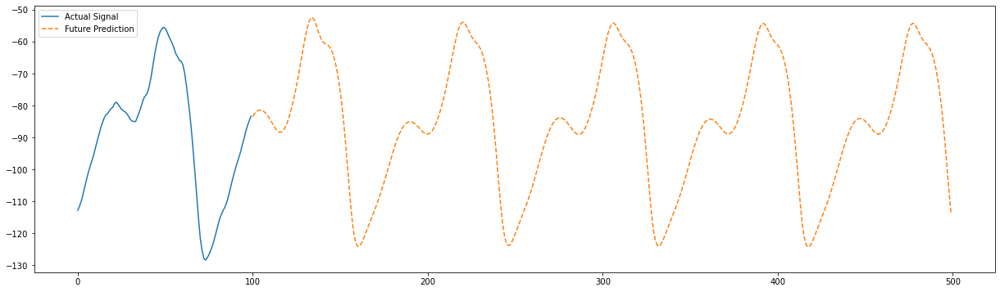

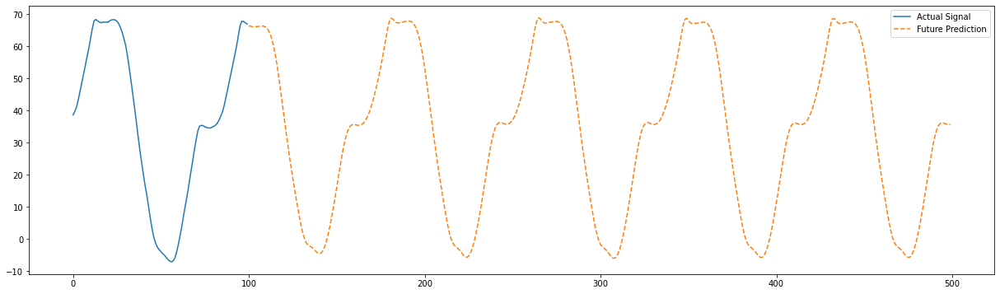

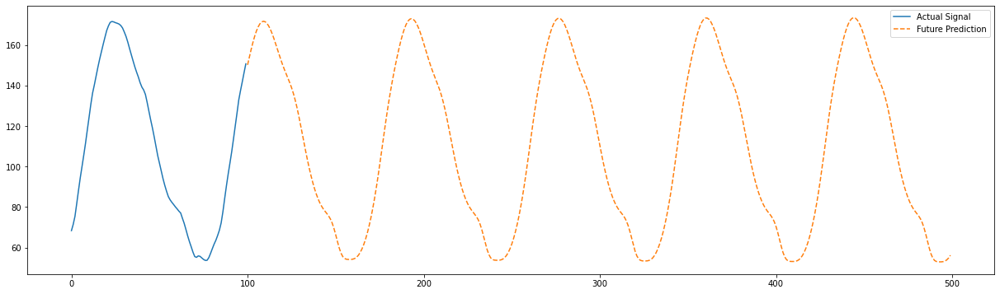

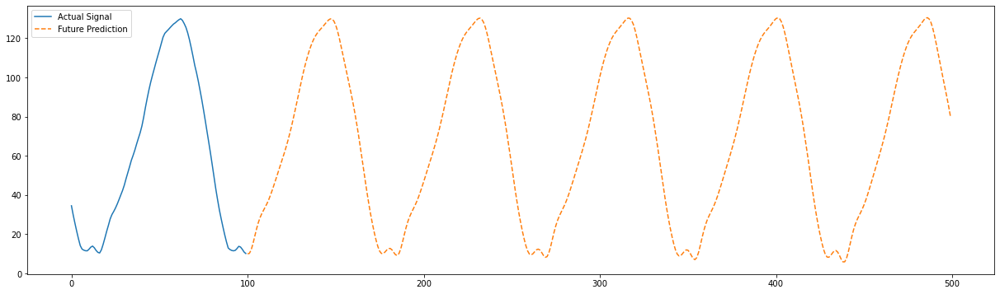

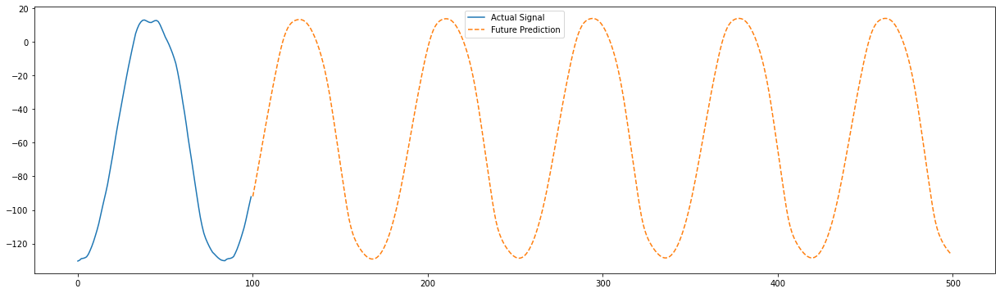

...

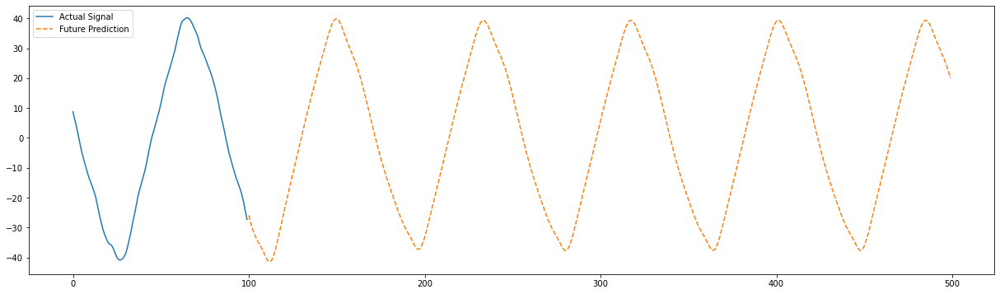

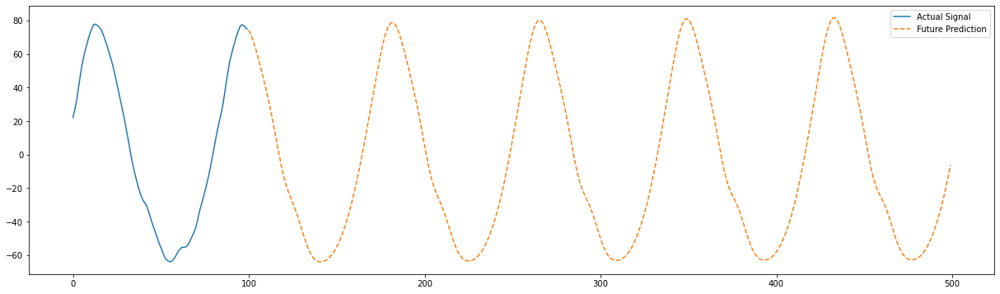

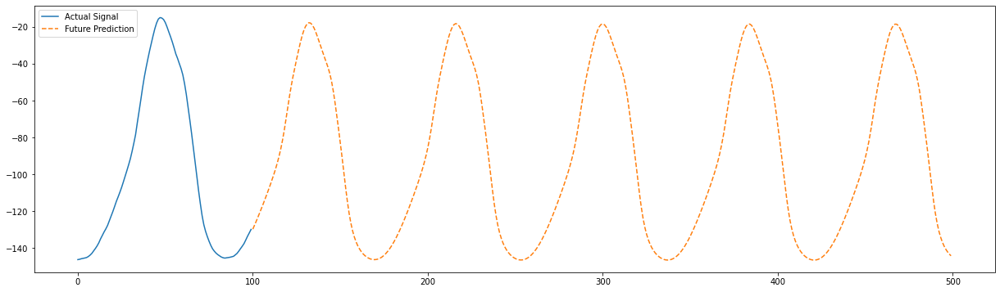

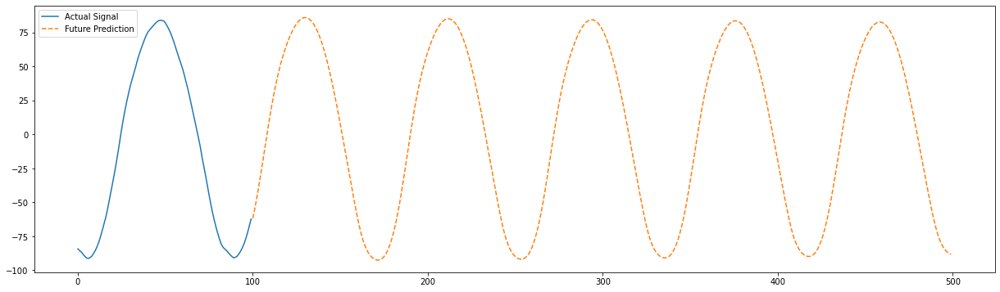

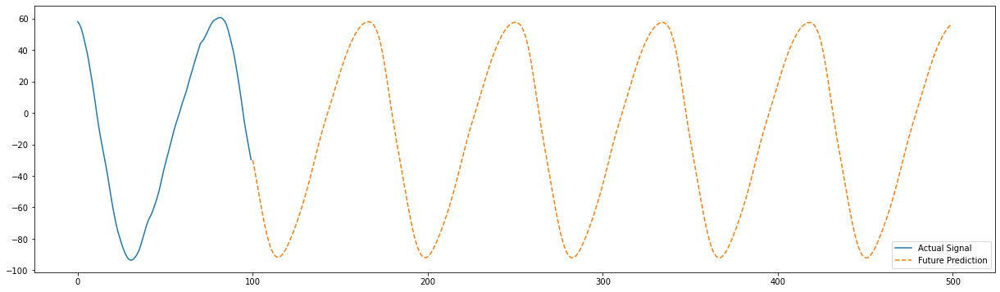

In [6]:
#Train each code using a single LSTM model---LSTM-individual Model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
from keras.callbacks import ReduceLROnPlateau, EarlyStopping

units_LSTM=100

print(y.shape)
# Generate a sample dataset (replace with your actual data)
data=np.array(np.transpose(y))
print(data.shape)

# Define the sequence length for LSTM
seq_length_collection = [10,20,30,40,50,60,80,70,90,100]#
future_steps = pred_time_steps  # Number of future steps to predict

for seq_length in seq_length_collection:
    # Placeholder for reconstructed signals
    reconstructed_signals = []
    future_predictions_lstm = []

    # Loop over each signal
    for idx in range(data.shape[0]):
        start_time = timeit.default_timer()
        
        training_data = data[idx].reshape(data.shape[1],1)
        print('training_data shape:',training_data.shape)
    
        # Normalize the data
        scaler = MinMaxScaler()
        training_data_scaled = scaler.fit_transform(training_data)
    
        # Split the data into train and test sets
        #train_size = int(len(training_data_scaled) * 0.9)
        #train, test = training_data_scaled[:train_size], training_data_scaled[train_size:]
    
        # Prepare the input and output sequences for LSTM
        def create_sequences(data, seq_length):
            xs, ys = [], []
            for i in range(len(data) - seq_length):
                x = data[i:i + seq_length]
                y = data[i + seq_length]
                xs.append(x)
                ys.append(y)
            return np.array(xs), np.array(ys)
    
        X_train, y_train = create_sequences(training_data_scaled, seq_length)
        print(X_train.shape)
        print(y_train.shape)
        #X_test, y_test = create_sequences(test, seq_length)
        #print(X_test.shape)
        #print(y_test.shape)
    
        # Build the LSTM model
        model = Sequential([
            LSTM(units_LSTM, return_sequences=True, input_shape=(seq_length, X_train.shape[2])),
            LSTM(units_LSTM),
            Dense(X_train.shape[2])
        ])
    
        model.compile(optimizer='adam', loss='mean_squared_error')
        
        model.summary()

        optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
        model.compile(optimizer=optimizer, loss='mse')        
              
        
        print("the {0} signal".format(idx))
        # Train the model
        #model.fit(X_train, y_train, epochs=2000, batch_size=32, validation_split=0.2)
        # Callbacks
        reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                            factor=0.5,
                                            patience=10,
                                            verbose=1,
                                            mode='min',
                                            min_delta=1e-10,
                                            cooldown=0,
                                            min_lr=0)
        # Train the LSTM model
        model.fit(X_train, y_train,  epochs=500, batch_size=32,validation_split=0.1,callbacks=[reduce_lr])
        print("time spend for training:",timeit.default_timer() - start_time)
      
        # Make predictions
        start_time = timeit.default_timer()
        #predicted_signal_2 = model.predict(X_test)
        #print('predicted_signal_2 shape:',predicted_signal_2.shape)
    
        # Rescale the predicted IMFs
        #predicted_signal = scaler.inverse_transform(predicted_signal_2)
    
        # Store the reconstructed signal
        #reconstructed_signals.append(predicted_signal) 
    
        # Extrapolate future data
        #last_sequence = X_test[-1]
        last_sequence = X_train[-1]
        future_imfs = []
    
        for _ in range(future_steps):
            # Predict the next set of IMFs
            next_imf = model.predict(last_sequence[np.newaxis, :])
            future_imfs.append(next_imf[0])
        
            # Update last_sequence to include the newly predicted IMFs
            last_sequence = np.vstack([last_sequence[1:], next_imf])
    
        # Rescale and sum future IMFs to reconstruct future signal
        future_signal = scaler.inverse_transform(np.array(future_imfs))
        future_predictions_lstm.append(future_signal)
        print("time spend for prediction:",timeit.default_timer() - start_time)
    # Convert lists to numpy arrays
    #reconstructed_signals = np.array(reconstructed_signals)
    #pickle.dump(reconstructed_signals, open("./Temp_data_Case1/reconstructed_signals_lstm_individual_"+str(seq_length)+'_'+str(encoding_dim)+".pkl", "wb"))

    future_predictions_lstm = np.array(future_predictions_lstm)
    pickle.dump(future_predictions_lstm, open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(seq_length)+'_'+str(encoding_dim)+".pkl", "wb"))

    print(future_predictions_lstm.shape)

    # Plot the actual and predicted signals for the first signal as an example
    #Replace len(reconstructed_signals[idx]) with integer 100
    for idx in range(data.shape[0]):
        plt.figure(figsize=(21, 6))
        plt.plot(data[idx, -100:], label='Actual Signal')
        #plt.plot(reconstructed_signals[idx], label='Predicted Signal', linestyle='dashed')
        plt.plot(np.arange(100, 100+ future_steps), future_predictions_lstm[idx], label='Future Prediction', linestyle='dashed')
        
        plt.legend()
        plt.show()
        

(13, 400, 1)
(13, 400)
(13, 1601)
(100,)
(400, 1)
(13, 400)


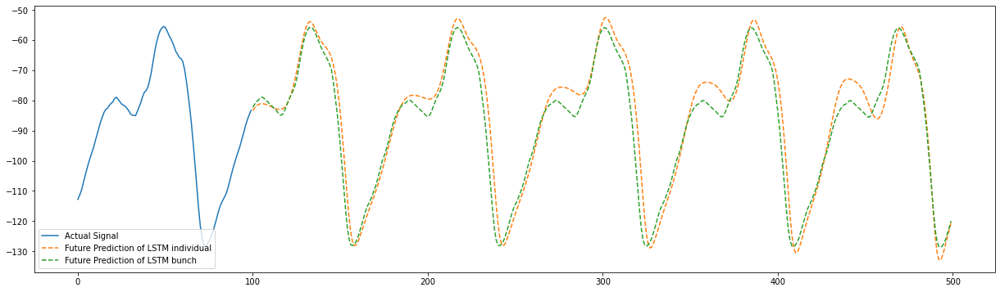

(100,)
(400, 1)
(13, 400)


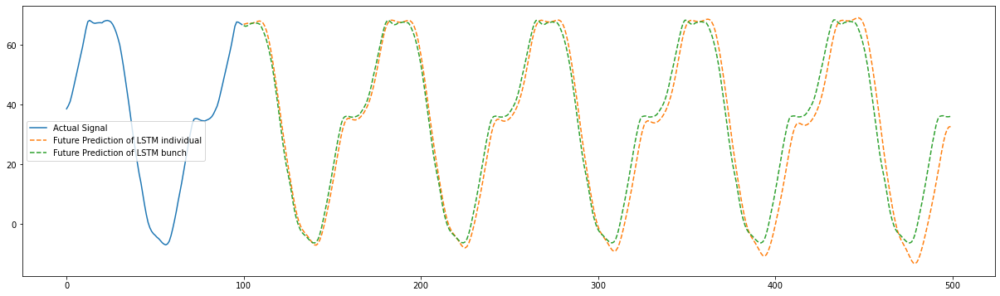

(100,)
(400, 1)
(13, 400)


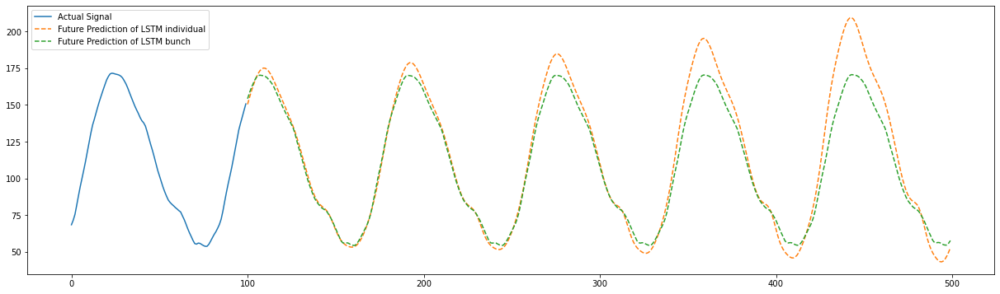

(100,)
(400, 1)
(13, 400)


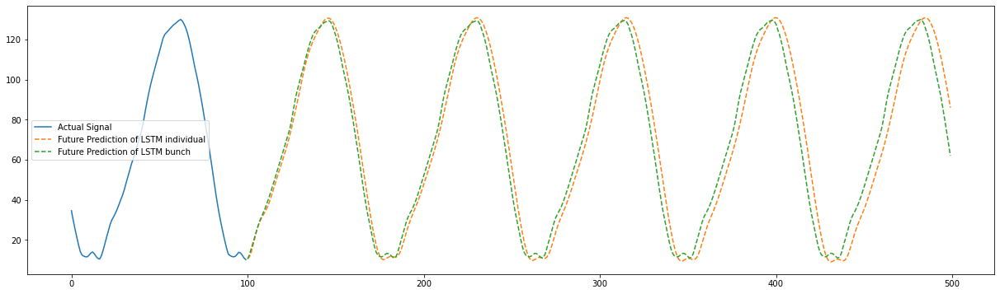

(100,)
(400, 1)
(13, 400)


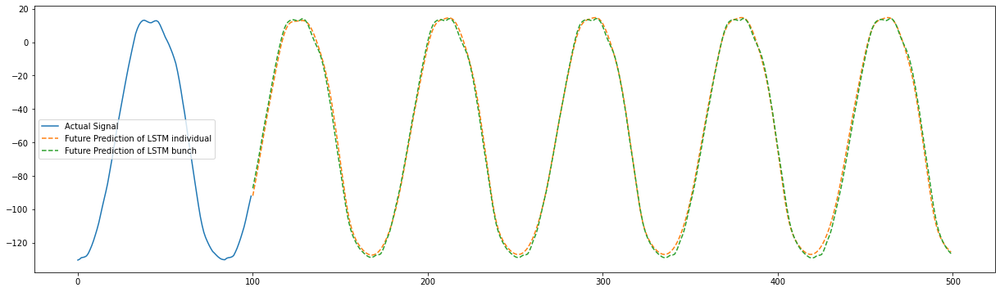

(100,)
(400, 1)
(13, 400)


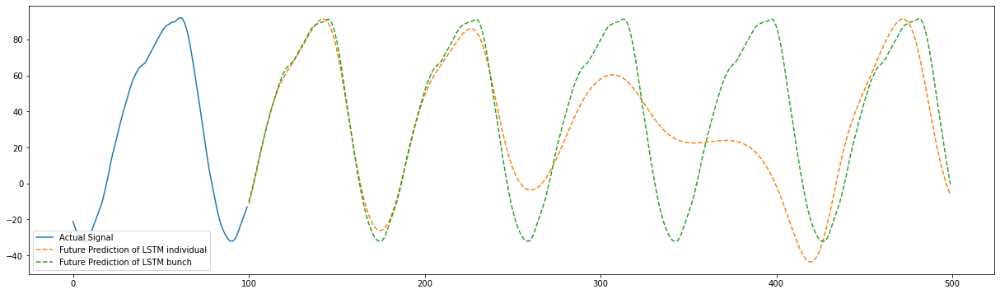

(100,)
(400, 1)
(13, 400)


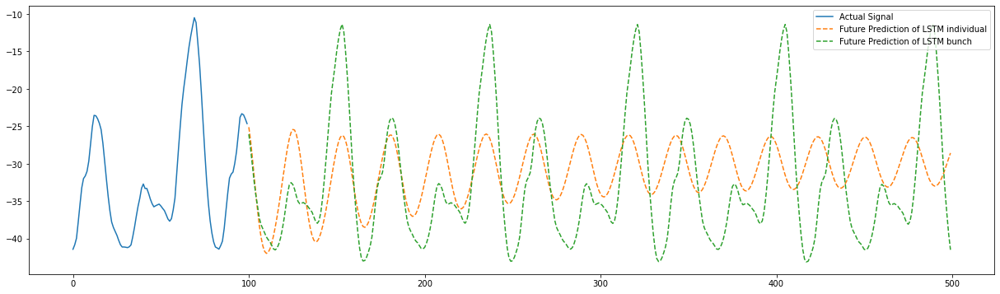

(100,)
(400, 1)
(13, 400)


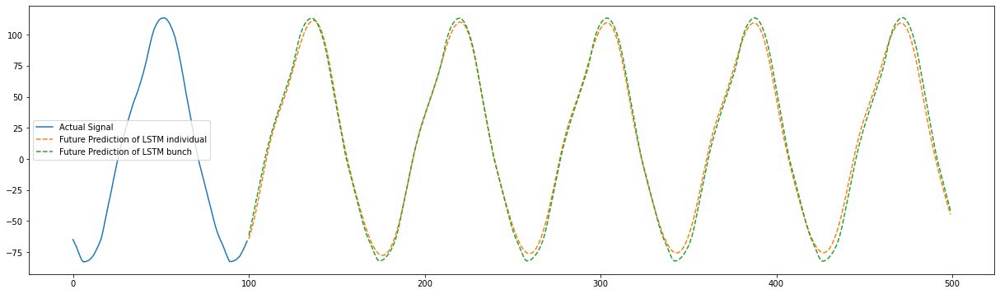

(100,)
(400, 1)
(13, 400)


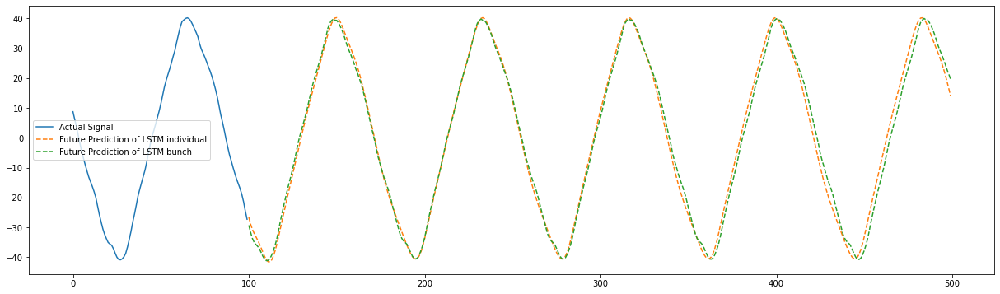

(100,)
(400, 1)
(13, 400)


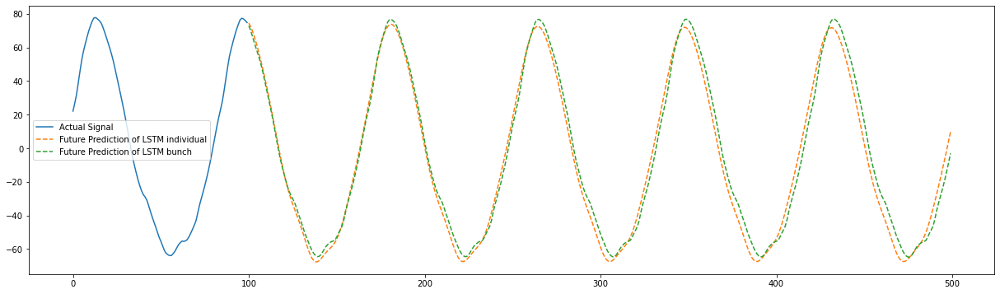

(100,)
(400, 1)
(13, 400)


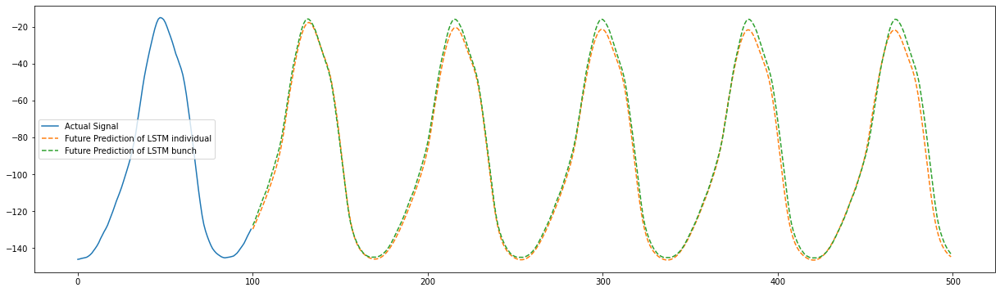

(100,)
(400, 1)
(13, 400)


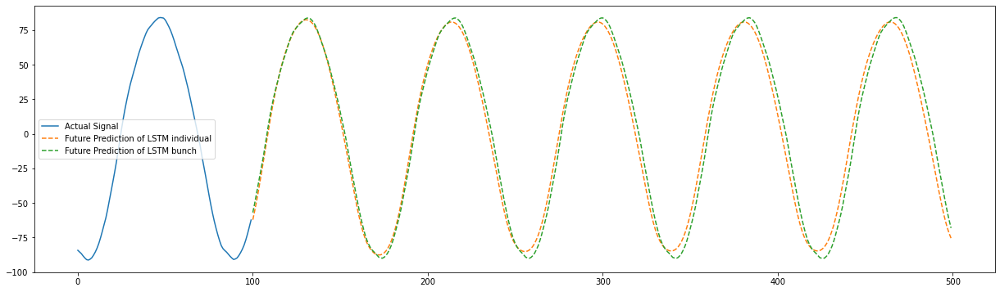

(100,)
(400, 1)
(13, 400)


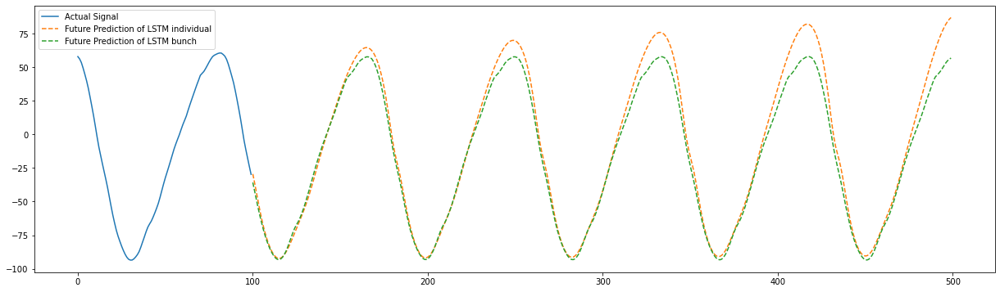

In [78]:
seq_length=80
#reconstructed_signals=joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_individual_"+str(seq_length)+'_'+str(encoding_dim)+".pkl", "rb"))
future_predictions_lstm=joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(seq_length)+'_'+str(encoding_dim)+".pkl", "rb"))
print(future_predictions_lstm.shape)
future_latent_predictions_lstm_bunch=np.transpose(joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_codes_"+str(encoding_dim)+".pkl", "rb")))
print(future_latent_predictions_lstm_bunch.shape)

data=np.array(np.transpose(y))
print(data.shape)
# Plot the actual and predicted signals for the first signal as an example
#Replace len(reconstructed_signals[idx]) with integer 100
for idx in range(data.shape[0]):
    plt.figure(figsize=(21, 6))
    print(data[idx, -100:].shape)
    plt.plot(data[idx, -100:], label='Actual Signal')
    
    print(future_predictions_lstm[idx].shape)
    plt.plot(np.arange(100, 100 + future_steps), future_predictions_lstm[idx], label='Future Prediction of LSTM individual', linestyle='dashed')
    print(future_latent_predictions_lstm_bunch.shape)
    plt.plot(np.arange(100, 100 + future_steps), future_latent_predictions_lstm_bunch[idx], label='Future Prediction of LSTM bunch', linestyle='dashed')
    plt.legend()
    plt.show()

In [4]:
#Python code of Dynamic Mode Decomposition
class DMD(object):
  def y_plus(self,y_data):
    """ the encoded output data without the first time series state. """
    return y_data[:, 1:]

  def y_minus(self,y_data):
    """ the encoded output data without the last time series state. """
    return y_data[:, :-1]

  def get_amat(self,y_data,r):
    """ Compute DMD A matrix by the singular value decomposition. """
    X2 = self.y_plus(y_data)
    X1 = self.y_minus(y_data)
    # compute A using the pseudoinverse.
    # return y_plus2 @ tf.linalg.pinv(y_minus2)
    ## Perform singular value decomposition on X1
    u, s, v = np.linalg.svd(X1, full_matrices=False)
    print("Singular value matrix's shape",s.shape)
    print("Singular value array",s)
    ## Compute the Koopman matrix
    A_tilde = u[:, : r].conj().T @ X2 @ v[: r, :].conj().T * np.reciprocal(s[: r])
    ## Perform eigenvalue decomposition on A_tilde
    Phi, Q = np.linalg.eig(A_tilde)
    ## Compute the coefficient matrix
    Psi = X2 @ v[: r, :].conj().T @ np.diag(np.reciprocal(s[: r])) @ Q
    A = Psi @ np.diag(Phi) @ np.linalg.pinv(Psi)
    return A

  def get_predicted_y(self,y_data,r,pred_step):
    #data=np.array(y_data)[:,0:-pred_step]
    data = np.array(y_data)[:,:]
    N, T = data.shape
    A = self.get_amat(data, r)
    print(A.shape)
    print(A)
    mat2 = np.append(data, np.zeros((N, pred_step)), axis=1)
    #print(mat2.shape)
    for s in range(pred_step):
      mat2[:, T + s] =(A @ mat2[:, T + s - 1]).real#
    # return mat[:, - pred_step :]
    #print(mat2[:,pred_step:].shape)
    return mat2[:,pred_step:]

In [87]:
#The prediction result of SAE-DMD model in different code length
encoding_dim =66# [13,33,66]
model_save_folder = './AE_Models_case1'
encoder_file_name = 'AE_encoder_dim' + str(encoding_dim) # name of encoder model
decoder_file_name = 'AE_decoder_dim' + str(encoding_dim) # name of decoder model
AE_file_name = 'AE_dim' + str(encoding_dim) # name of AE whole model

ae = StackAutoencoder()
ae.encoder = load_model(model_save_folder + "/" + encoder_file_name)
ae.decoder = load_model(model_save_folder + "/" + decoder_file_name)

y=ae.encoder(two_dimension_data_0)
print(y.shape)

dmd=DMD()
# start timer.
start_time = timeit.default_timer()

print("y.shape",y.shape)
y_pred = dmd.get_predicted_y(tf.transpose(y),int(encoding_dim),future_steps)# rank equals 10 and estimate time step equals 10
print("y_pred_before_transpose",y_pred.shape)

print("time spend for prediction:",timeit.default_timer() - start_time)

# Convert lists to numpy arrays
y_original=tf.transpose(y)
print("Original code",y_original.shape)

y_pred = np.array(y_pred)
pickle.dump(y_pred, open("./Temp_data_Case1/reconstructed_signals_dmd_"+str(encoding_dim)+".pkl", "wb"))

print("DMD predict",y_pred.shape)

(1601, 66)
y.shape (1601, 66)
Singular value matrix's shape (66,)
Singular value array [6.74221826e+03 4.88612256e+03 4.56545166e+03 3.92324438e+03
 1.53856995e+03 1.23161230e+03 8.29287476e+02 7.59181213e+02
 5.02637573e+02 4.66885712e+02 4.31496490e+02 2.83505768e+02
 2.24076508e+02 2.13345917e+02 1.96829239e+02 1.81823074e+02
 1.51553345e+02 1.42280914e+02 1.26630424e+02 1.04788155e+02
 1.01679230e+02 9.02063217e+01 8.60974045e+01 8.21609879e+01
 7.19785614e+01 6.03667793e+01 5.76370735e+01 5.63825417e+01
 5.17825241e+01 4.75440445e+01 4.71842117e+01 4.61567650e+01
 4.08832130e+01 4.01630020e+01 3.75044975e+01 3.67574463e+01
 3.43206139e+01 2.99175797e+01 2.86716595e+01 2.61133804e+01
 2.50727196e+01 2.26356201e+01 2.01593685e+01 1.92437305e+01
 1.76602097e+01 1.72234631e+01 1.62468586e+01 1.58006716e+01
 1.42585421e+01 1.30313597e+01 1.21965075e+01 1.10545044e+01
 1.08189163e+01 1.01015139e+01 9.23698902e+00 8.90963268e+00
 8.11302853e+00 7.51809406e+00 5.71305466e+00 4.85392857e+0

(66, 400, 1)
LSTM predict (66, 400)
LSTM predict&original (66, 1601)
(66, 400)
(66, 1601)
LSTM predict_bunch&original (66, 1601)


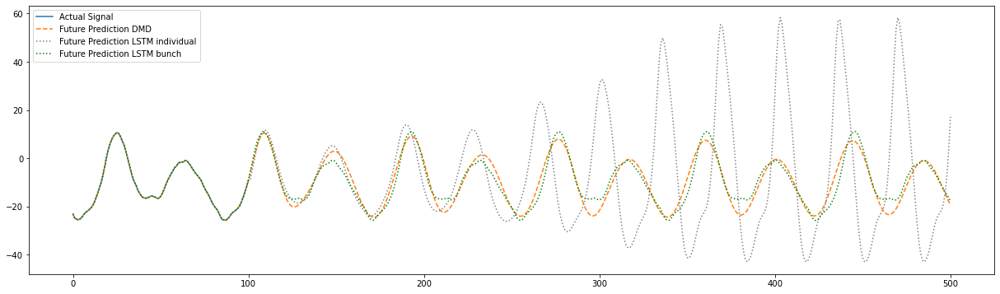

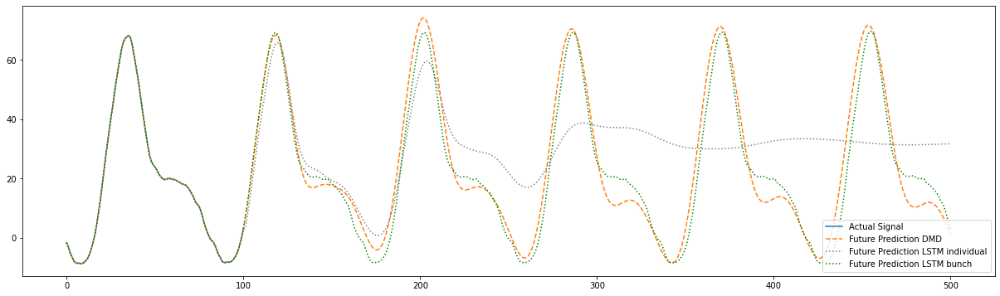

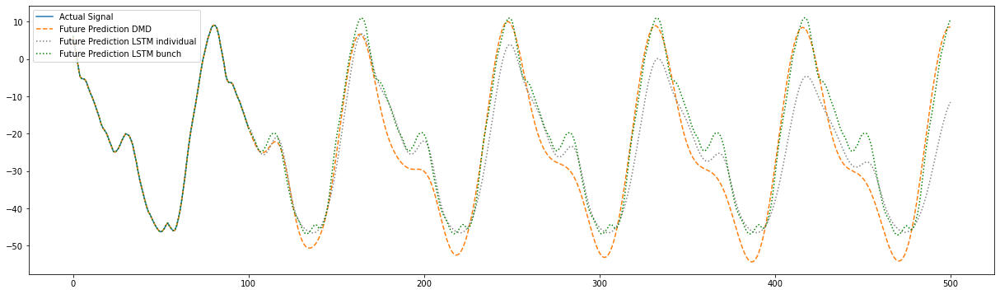

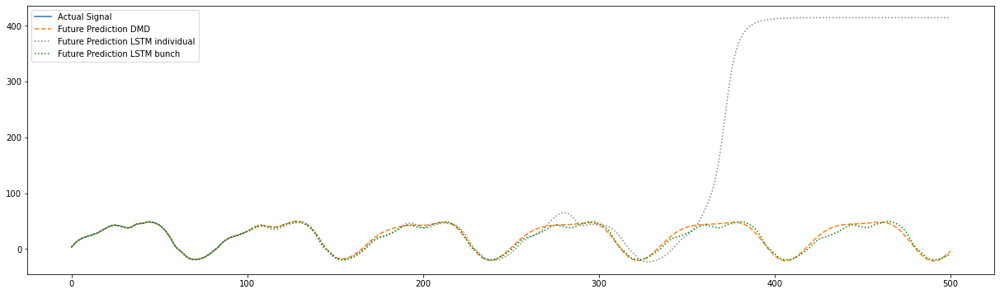

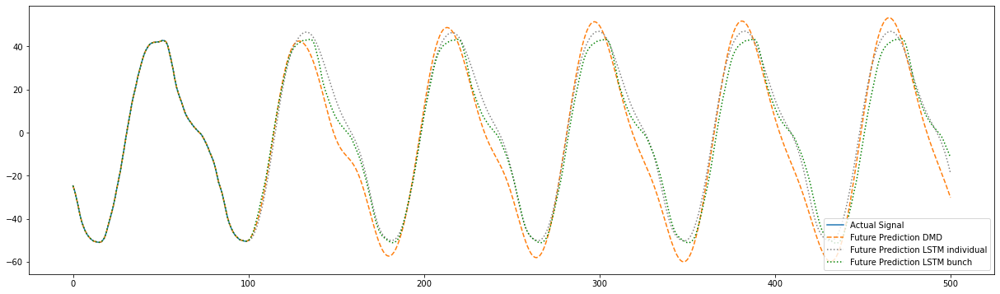

...

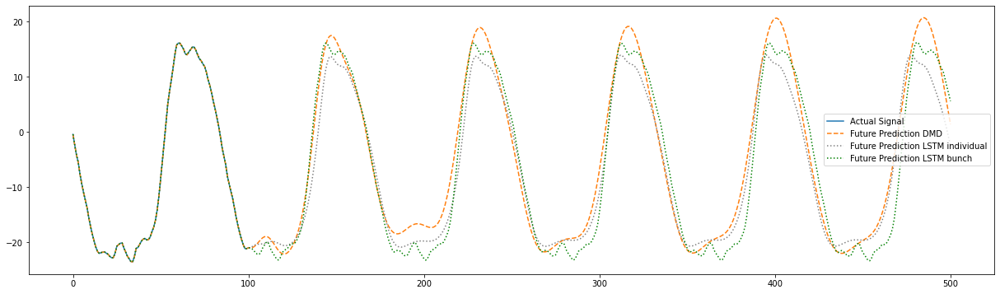

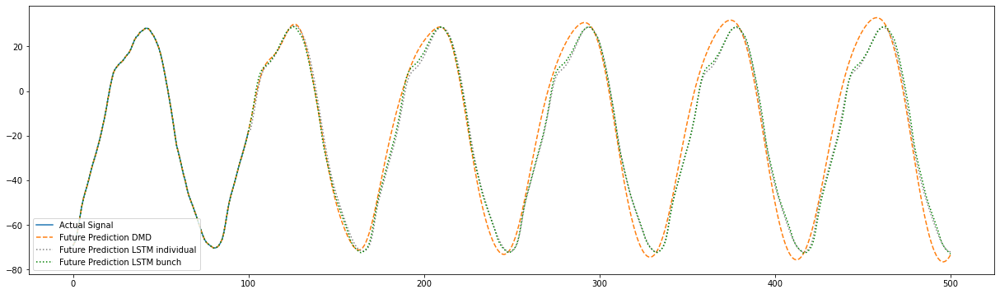

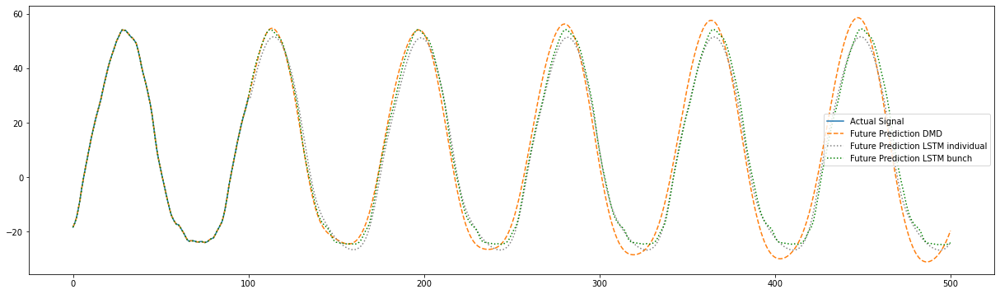

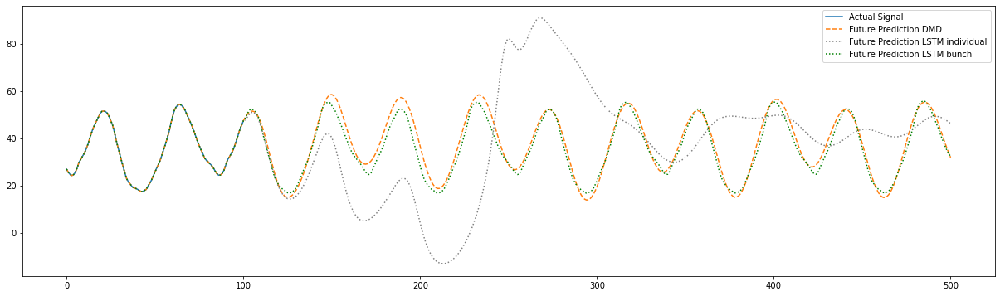

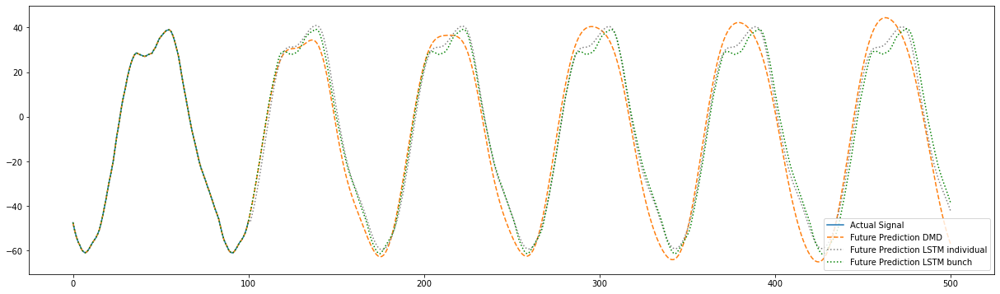

In [89]:
seq_length=80
future_predictions_lstm=joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(seq_length)+'_'+str(encoding_dim)+".pkl", 'rb'))
print(future_predictions_lstm.shape)
future_predictions_lstm_reshape=np.reshape(future_predictions_lstm,(encoding_dim,-1))
print("LSTM predict",future_predictions_lstm_reshape.shape)
future_predictions_lstm_combine=np.transpose(np.vstack((np.transpose(y_original[:,400:]),np.transpose(future_predictions_lstm_reshape))))
print("LSTM predict&original",future_predictions_lstm_combine.shape)

future_latent_predictions_lstm_bunch=np.transpose(joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_codes_"+str(encoding_dim)+".pkl", "rb")))
print(future_latent_predictions_lstm_bunch.shape)
print(y_original.shape)
future_predictions_lstm_combine_bunch=np.transpose(np.vstack((np.transpose(y_original[:,400:]),np.transpose(future_latent_predictions_lstm_bunch))))
print("LSTM predict_bunch&original",future_predictions_lstm_combine_bunch.shape)

# Plot the actual and predicted signals for the first signal as an example
for idx in range(y_original.shape[0]):
    plt.figure(figsize=(21, 6))
    plt.plot(y_original[idx, -(101):], label='Actual Signal')
    plt.plot(y_pred[idx, -(101+future_steps):], label='Future Prediction DMD', linestyle='dashed')
    plt.plot(future_predictions_lstm_combine[idx, -(101+future_steps):], label='Future Prediction LSTM individual', color='grey',linestyle='dotted')
    plt.plot(future_predictions_lstm_combine_bunch[idx, -(101+future_steps):], label='Future Prediction LSTM bunch', color='green',linestyle='dotted')
    plt.legend()
    plt.show()

In [4]:
#Reconstruct the code into the origin like array
def recontruction(ae,code):
    code_transp=np.transpose(code)
    x_ae=ae.decoder(code_transp)
    print(x_ae.shape)
    outputs=np.array(x_ae).reshape(code_transp.shape[0],54536,2)
    u = outputs[:,:,0]
    v = outputs[:,:,1]
    scaler_u = joblib.load('./data/case1data/scaler_u.pkl')
    scaler_v = joblib.load('./data/case1data/scaler_v.pkl')
    outputs_u = scaler_u.inverse_transform(u)
    outputs_v = scaler_v.inverse_transform(v)
    outputs = np.dstack((outputs_u, outputs_v))   
    return outputs

#Inverse scale the reconstructed data into the origin like array
def scalar_inverse(reconstructed_data):
    outputs=np.array(reconstructed_data).reshape(reconstructed_data.shape[0],54536,2)
    u = outputs[:,:,0]
    v = outputs[:,:,1]
    scaler_u = joblib.load('./data/case1data/scaler_u.pkl')
    scaler_v = joblib.load('./data/case1data/scaler_v.pkl')
    outputs_u = scaler_u.inverse_transform(u)
    outputs_v = scaler_v.inverse_transform(v)
    outputs = np.dstack((outputs_u, outputs_v))   
    return outputs 

#Calculat the magnitude of the velocity on x and y direction
def cal_Magnitude(data):
    three_dimension_data=np.array(data).transpose(1,2,0)

    two_dimension_data=np.zeros((three_dimension_data.shape[0], three_dimension_data.shape[2]), dtype=np.float32)
    #print(two_dimension_data.shape)
    for i in range(0, three_dimension_data.shape[0]):
        for j in range(0, three_dimension_data.shape[2]):
            magnitude=math.sqrt(pow(three_dimension_data[i,0,j],2)+pow(three_dimension_data[i,1,j],2))
            two_dimension_data[i][j]=magnitude
    two_dimension_data=two_dimension_data.reshape(two_dimension_data.shape[1],two_dimension_data.shape[0])
    return two_dimension_data

In [46]:
#Comparsion of reconstruction accuracy between SAE and POD in different code length
import joblib
import math
import numpy as np
import pickle

# start timer.
start_time = timeit.default_timer()

ori_data = np.load(open('./data/case1data/Velocity.npy', 'rb'))[1201:1601]
print(ori_data.shape)
ori_data3=cal_Magnitude(ori_data)
pickle.dump(ori_data3, open("./Temp_data_Case1/ori_data3.pkl", "wb"))

rom_data_0=joblib.load(open("./Temp_data_Case1/reconstructed_data_13_POD.pkl", "rb"))[1201:1601]
rom_data_03=cal_Magnitude(scalar_inverse(rom_data_0))
pickle.dump(rom_data_03, open("./Temp_data_Case1/rom_data_03.pkl", "wb"))

rom_data_1=joblib.load(open("./Temp_data_Case1/reconstructed_data_33_POD.pkl", "rb"))[1201:1601]#
rom_data_13=cal_Magnitude(scalar_inverse(rom_data_1))
pickle.dump(rom_data_13, open("./Temp_data_Case1/rom_data_13.pkl", "wb"))

rom_data_2=joblib.load(open("./Temp_data_Case1/reconstructed_data_66_POD.pkl", "rb"))[1201:1601]
rom_data_23=cal_Magnitude(scalar_inverse(rom_data_2))
pickle.dump(rom_data_23, open("./Temp_data_Case1/rom_data_23.pkl", "wb"))

rom_data_3=joblib.load(open("./Temp_data_Case1/reconstructed_data_13_SAE.pkl", "rb"))[1201:1601]
rom_data_33=cal_Magnitude(scalar_inverse(rom_data_3))
pickle.dump(rom_data_33, open("./Temp_data_Case1/rom_data_33.pkl", "wb"))

rom_data_4=joblib.load(open("./Temp_data_Case1/reconstructed_data_33_SAE.pkl", "rb"))[1201:1601]
rom_data_43=cal_Magnitude(scalar_inverse(rom_data_4))
pickle.dump(rom_data_43, open("./Temp_data_Case1/rom_data_43.pkl", "wb"))

rom_data_5=joblib.load(open("./Temp_data_Case1/reconstructed_data_66_SAE.pkl", "rb"))[1201:1601]
rom_data_53=cal_Magnitude(scalar_inverse(rom_data_5))
pickle.dump(rom_data_53, open("./Temp_data_Case1/rom_data_53.pkl", "wb"))

print("time spend for calculation:",timeit.default_timer() - start_time)

(400, 54536, 2)
time spend for prediction: 266.8956586480199


In [6]:
ori_data2=joblib.load(open('./Temp_data_Case1/ori_data3.pkl', 'rb'))

rom_data_02=joblib.load(open('./Temp_data_Case1/rom_data_03.pkl', 'rb'))
rom_data_12=joblib.load(open('./Temp_data_Case1/rom_data_13.pkl', 'rb'))
rom_data_22=joblib.load(open('./Temp_data_Case1/rom_data_23.pkl', 'rb'))
rom_data_32=joblib.load(open('./Temp_data_Case1/rom_data_33.pkl', 'rb'))
rom_data_42=joblib.load(open('./Temp_data_Case1/rom_data_43.pkl', 'rb'))
rom_data_52=joblib.load(open('./Temp_data_Case1/rom_data_53.pkl', 'rb'))
from dmd_machine import Model_Processing_7inputs_2_SAE_POD as MP7

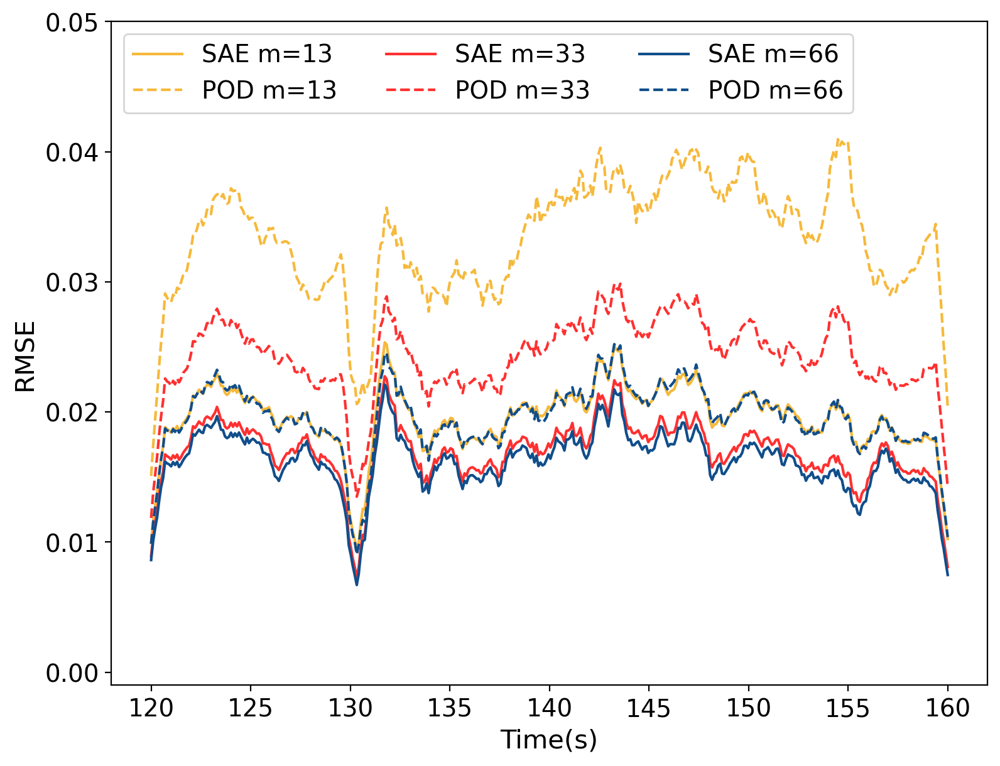

In [7]:
MP7.rmse_over_time(ori_data2, rom_data_32, rom_data_02,rom_data_42, rom_data_12,rom_data_52, rom_data_22,'Velocity',0.05,120)

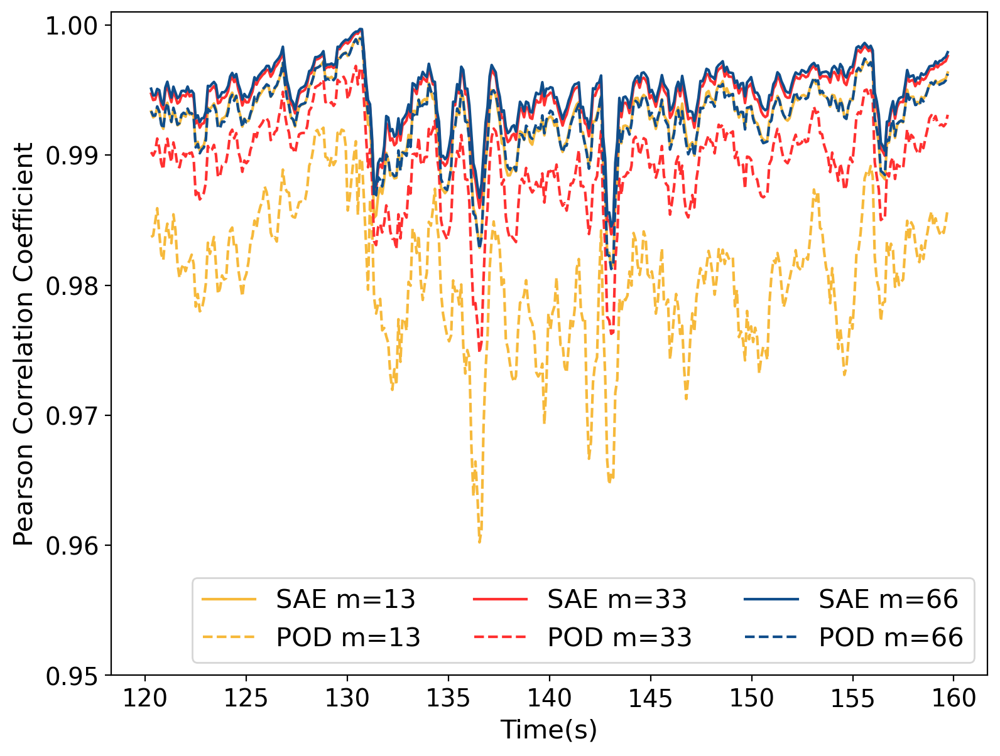

In [9]:
MP7.cc(ori_data2, rom_data_32, rom_data_02,rom_data_42, rom_data_12,rom_data_52, rom_data_22,0.95,'Velocity',120)

In [9]:
#Parametric study of the sequence length for training the LSTM-individual model
encoding_dim =13# [13,33,66]
model_save_folder = './AE_Models_case1'
encoder_file_name = 'AE_encoder_dim' + str(encoding_dim) # name of encoder model
decoder_file_name = 'AE_decoder_dim' + str(encoding_dim) # name of decoder model
AE_file_name = 'AE_dim' + str(encoding_dim) # name of AE whole model

ae = StackAutoencoder()
ae.encoder = load_model(model_save_folder + "/" + encoder_file_name)
ae.decoder = load_model(model_save_folder + "/" + decoder_file_name)

print(np.load(open('./data/case1data/Velocity.npy', 'rb')).shape)#[2001,55268, 2]
ori_data2=cal_Magnitude(np.load(open('./data/case1data/Velocity.npy', 'rb'))[-401:-1])# 
print(ori_data2.shape)
pickle.dump(ori_data2, open("./Temp_data_Case1/ori_data2.pkl", "wb"))

future_predictions_lstm_bunch=joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(10)+'_'+str(encoding_dim)+".pkl", 'rb')).squeeze()
print(future_predictions_lstm_bunch.shape)
rom_data_individual_10=cal_Magnitude(recontruction(ae,future_predictions_lstm_bunch[:,-400:]))
pickle.dump(rom_data_individual_10, open("./Temp_data_Case1/rom_data_individual_10.pkl", "wb"))

future_predictions_lstm_bunch=joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(20)+'_'+str(encoding_dim)+".pkl", 'rb')).squeeze()
print(future_predictions_lstm_bunch.shape)
rom_data_individual_20=cal_Magnitude(recontruction(ae,future_predictions_lstm_bunch[:,-400:]))
pickle.dump(rom_data_individual_20, open("./Temp_data_Case1/rom_data_individual_20.pkl", "wb"))

future_predictions_lstm_bunch=joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(30)+'_'+str(encoding_dim)+".pkl", 'rb')).squeeze()
print(future_predictions_lstm_bunch.shape)
rom_data_individual_30=cal_Magnitude(recontruction(ae,future_predictions_lstm_bunch[:,-400:]))
pickle.dump(rom_data_individual_30, open("./Temp_data_Case1/rom_data_individual_30.pkl", "wb"))

future_predictions_lstm_bunch=joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(40)+'_'+str(encoding_dim)+".pkl", 'rb')).squeeze()
print(future_predictions_lstm_bunch.shape)
rom_data_individual_40=cal_Magnitude(recontruction(ae,future_predictions_lstm_bunch[:,-400:]))
pickle.dump(rom_data_individual_40, open("./Temp_data_Case1/rom_data_individual_40.pkl", "wb"))

future_predictions_lstm_bunch=joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(50)+'_'+str(encoding_dim)+".pkl", 'rb')).squeeze()
print(future_predictions_lstm_bunch.shape)
rom_data_individual_50=cal_Magnitude(recontruction(ae,future_predictions_lstm_bunch[:,-400:]))
pickle.dump(rom_data_individual_50, open("./Temp_data_Case1/rom_data_individual_50.pkl", "wb"))

future_predictions_lstm_bunch=joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(60)+'_'+str(encoding_dim)+".pkl", 'rb')).squeeze()
print(future_predictions_lstm_bunch.shape)
rom_data_individual_60=cal_Magnitude(recontruction(ae,future_predictions_lstm_bunch[:,-400:]))
pickle.dump(rom_data_individual_60, open("./Temp_data_Case1/rom_data_individual_60.pkl", "wb"))

future_predictions_lstm_bunch=joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(70)+'_'+str(encoding_dim)+".pkl", 'rb')).squeeze()
print(future_predictions_lstm_bunch.shape)
rom_data_individual_70=cal_Magnitude(recontruction(ae,future_predictions_lstm_bunch[:,-400:]))
pickle.dump(rom_data_individual_70, open("./Temp_data_Case1/rom_data_individual_70.pkl", "wb"))

future_predictions_lstm_bunch=joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(80)+'_'+str(encoding_dim)+".pkl", 'rb')).squeeze()
print(future_predictions_lstm_bunch.shape)
rom_data_individual_80=cal_Magnitude(recontruction(ae,future_predictions_lstm_bunch[:,-400:]))
pickle.dump(rom_data_individual_80, open("./Temp_data_Case1/rom_data_individual_80.pkl", "wb"))

future_predictions_lstm_bunch=joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(90)+'_'+str(encoding_dim)+".pkl", 'rb')).squeeze()
print(future_predictions_lstm_bunch.shape)
rom_data_individual_80=cal_Magnitude(recontruction(ae,future_predictions_lstm_bunch[:,-400:]))
pickle.dump(rom_data_individual_80, open("./Temp_data_Case1/rom_data_individual_90.pkl", "wb"))

future_predictions_lstm_bunch=joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(100)+'_'+str(encoding_dim)+".pkl", 'rb')).squeeze()
print(future_predictions_lstm_bunch.shape)
rom_data_individual_80=cal_Magnitude(recontruction(ae,future_predictions_lstm_bunch[:,-400:]))
pickle.dump(rom_data_individual_80, open("./Temp_data_Case1/rom_data_individual_100.pkl", "wb"))

(2002, 54536, 2)
(400, 54536)
(13, 400)
(400, 109072)
(13, 400)
(400, 109072)
(13, 400)
(400, 109072)
(13, 400)
(400, 109072)
(13, 400)
(400, 109072)
(13, 400)
(400, 109072)
(13, 400)
(400, 109072)
(13, 400)
(400, 109072)


In [5]:
ori_data2=joblib.load(open("./Temp_data_Case1/ori_data2.pkl", 'rb'))
rom_data_individual_10=joblib.load(open("./Temp_data_Case1/rom_data_individual_30.pkl", 'rb'))
rom_data_individual_20=joblib.load(open("./Temp_data_Case1/rom_data_individual_40.pkl", 'rb'))
rom_data_individual_30=joblib.load(open("./Temp_data_Case1/rom_data_individual_50.pkl", 'rb'))
rom_data_individual_40=joblib.load(open("./Temp_data_Case1/rom_data_individual_60.pkl", 'rb'))
rom_data_individual_50=joblib.load(open("./Temp_data_Case1/rom_data_individual_70.pkl", 'rb'))
rom_data_individual_60=joblib.load(open("./Temp_data_Case1/rom_data_individual_80.pkl", 'rb'))
rom_data_individual_70=joblib.load(open("./Temp_data_Case1/rom_data_individual_90.pkl", 'rb'))
rom_data_individual_80=joblib.load(open("./Temp_data_Case1/rom_data_individual_100.pkl", 'rb'))    
from dmd_machine import Model_Processing_9inputs_2_seq_lenght as MP9

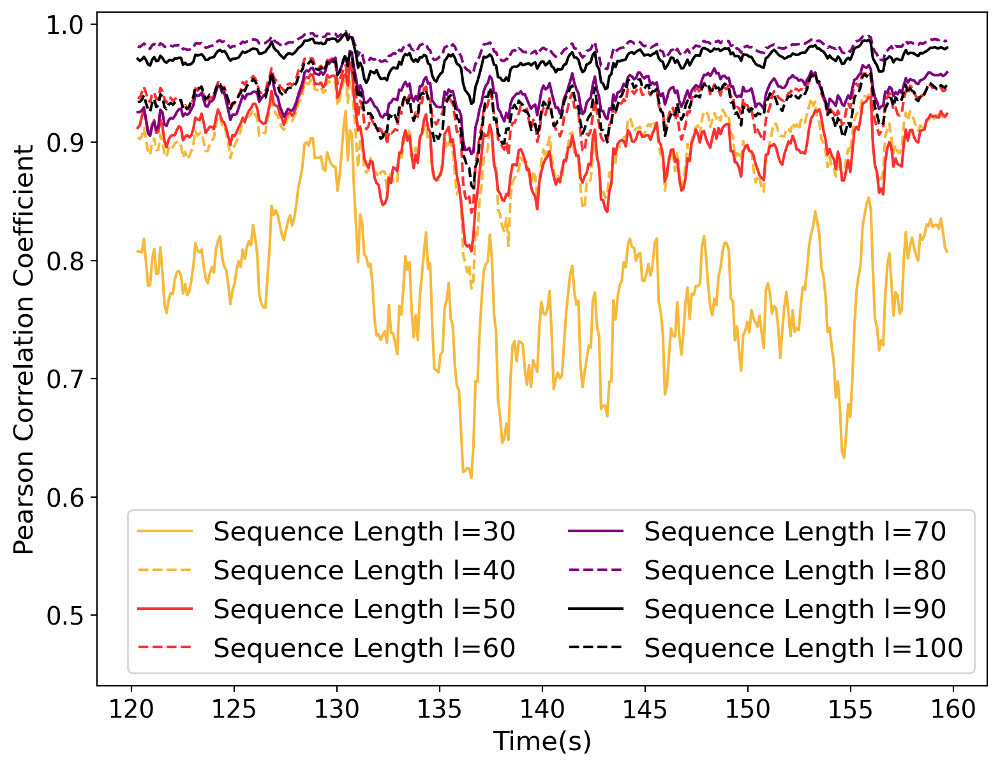

In [9]:
MP9.cc(ori_data2, rom_data_individual_10, rom_data_individual_20, rom_data_individual_30, rom_data_individual_40,rom_data_individual_50, rom_data_individual_60,rom_data_individual_70, rom_data_individual_80,0.44,'Velocity',120,2)

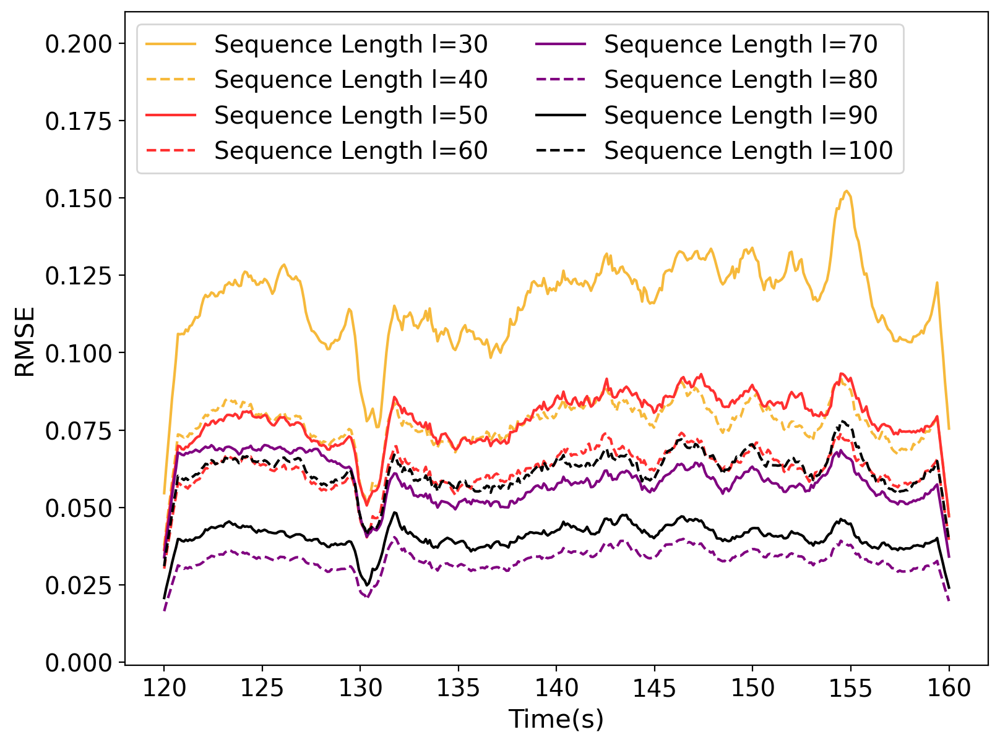

In [12]:
MP9.rmse_over_time(ori_data2, rom_data_individual_10, rom_data_individual_20, rom_data_individual_30, rom_data_individual_40,rom_data_individual_50, rom_data_individual_60,rom_data_individual_70, rom_data_individual_80,'Velocity', 0.21, 120,2)

In [135]:
#Prediction comparison of three different models

import joblib
import pickle

encoding_dim =66# [13,33,66]
model_save_folder = './AE_Models_case1'
encoder_file_name = 'AE_encoder_dim' + str(encoding_dim) # name of encoder model
decoder_file_name = 'AE_decoder_dim' + str(encoding_dim) # name of decoder model
AE_file_name = 'AE_dim' + str(encoding_dim) # name of AE whole model

ae = StackAutoencoder()
ae.encoder = load_model(model_save_folder + "/" + encoder_file_name)
ae.decoder = load_model(model_save_folder + "/" + decoder_file_name)

print(np.load(open('./data/case1data/Velocity.npy', 'rb')).shape)#[2001,54536, 2]
ori_data2=cal_Magnitude(np.load(open('./data/case1data/Velocity.npy', 'rb'))[-401:-1])# 
print(ori_data2.shape)
pickle.dump(ori_data2, open("./Temp_data_Case1/ori_data2.pkl", "wb"))

seq_length=80

future_predictions_lstm_individual=(joblib.load(open("./Temp_data_Case1/future_predictions_lstm_individual_"+str(seq_length)+'_'+str(encoding_dim)+".pkl", 'rb'))).squeeze()
print(future_predictions_lstm_individual.shape)
rom_data_02=cal_Magnitude(recontruction(ae,future_predictions_lstm_individual[:,-400:]))
print(rom_data_02.shape)
pickle.dump(rom_data_02, open("./Temp_data_Case1/rom_data_02.pkl", "wb"))

y_pred=joblib.load(open("./Temp_data_Case1/reconstructed_signals_dmd_"+str(encoding_dim)+".pkl", 'rb'))
print(y_pred.shape)
rom_data_12=cal_Magnitude(recontruction(ae,y_pred[:,-400:]))#[:,-401:-1]  
print(rom_data_12.shape)
pickle.dump(rom_data_12, open("./Temp_data_Case1/rom_data_12.pkl", "wb"))

future_predictions_lstm_bunch=np.transpose(joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_codes_"+str(encoding_dim)+".pkl", 'rb')))
print(future_predictions_lstm_bunch.shape)
rom_data_22=cal_Magnitude(recontruction(ae,future_predictions_lstm_bunch[:,-400:]))
print(rom_data_22.shape)
pickle.dump(rom_data_22, open("./Temp_data_Case1/rom_data_22.pkl", "wb"))
#

(2002, 54536, 2)
(400, 54536)
(66, 400)
(400, 109072)
(400, 54536)
(66, 1601)
(400, 109072)
(400, 54536)
(66, 400)
(400, 109072)
(400, 54536)


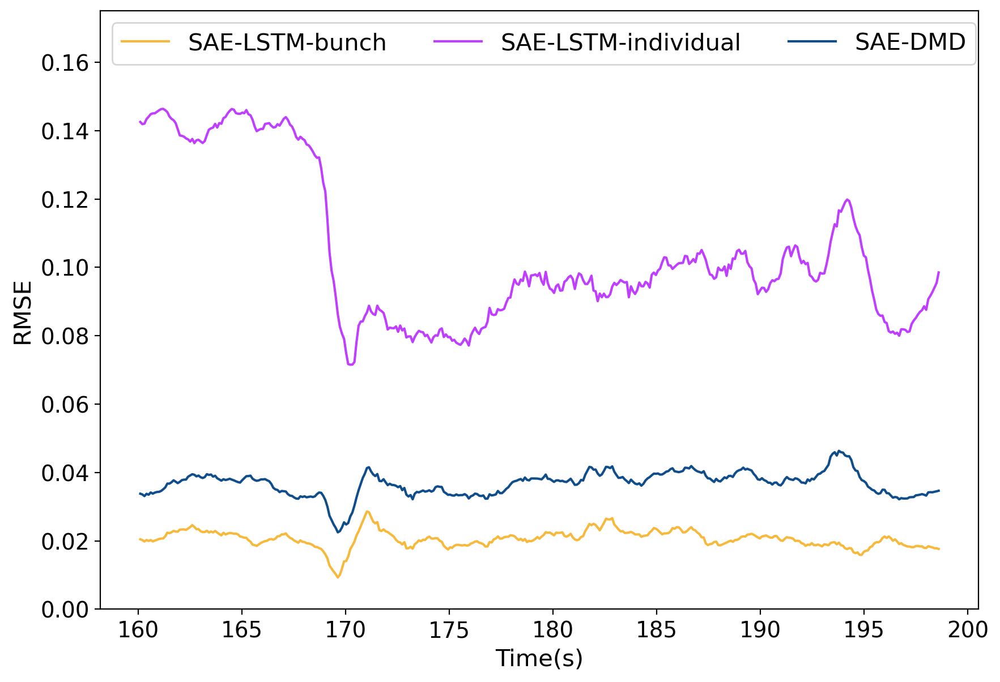

In [139]:
from dmd_machine import Model_Processing_4inputs_2 as MP4
ori_data2=joblib.load(open('./Temp_data_Case1/ori_data2.pkl', 'rb'))
rom_data_02=joblib.load(open('./Temp_data_Case1/rom_data_02.pkl', 'rb'))
rom_data_12=joblib.load(open('./Temp_data_Case1/rom_data_12.pkl', 'rb'))
rom_data_22=joblib.load(open('./Temp_data_Case1/rom_data_22.pkl', 'rb'))
MP4.rmse_over_time(ori_data2, rom_data_22, rom_data_02,rom_data_12,'Velocity',0.175,160,'upper left',3)

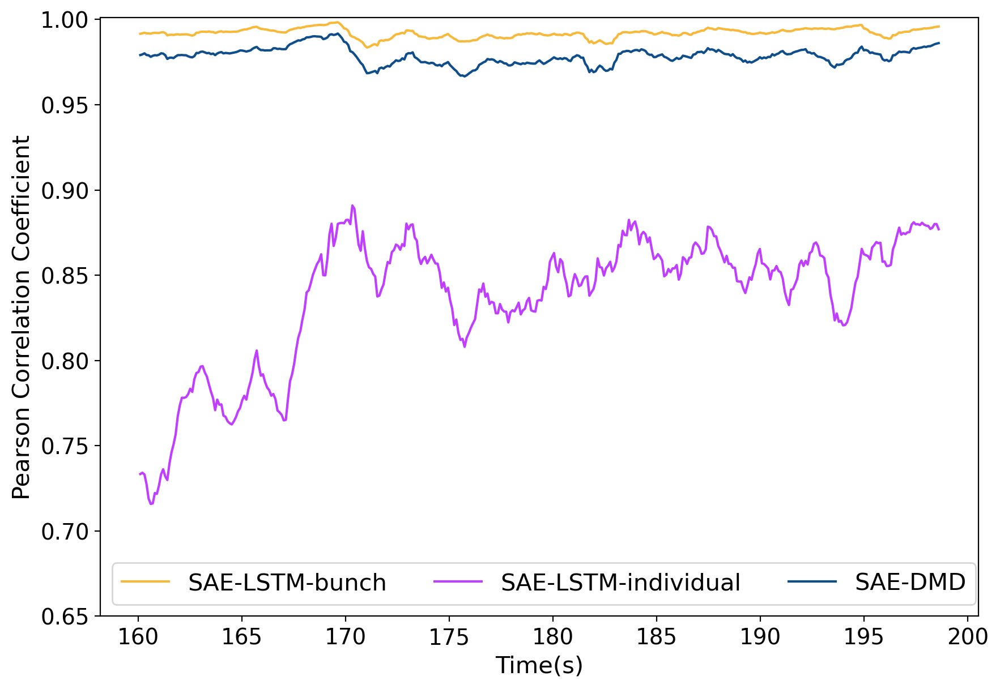

In [142]:
MP4.cc(ori_data2, rom_data_22, rom_data_02,rom_data_12,0.65,'Velocity',160,'lower left',3)

# ***Output***

In [20]:
#Output the point over time of various-lengthe SAE-LSTM-bunch model, and the selected point ID is 26621 in the following code snippets.
print(np.load(open('./data/case1data/Velocity.npy', 'rb')).shape)#[2001,55268, 2]
ori_data2=np.load(open('./data/case1data/Velocity.npy', 'rb'))[-401:-1]
pickle.dump(ori_data2, open("./Temp_data_Case1/ori_data2.pkl", "wb"))
ori_data02=cal_Magnitude(ori_data2)# 
print(ori_data02.shape)
pickle.dump(ori_data02, open("./Temp_data_Case1/ori_data02.pkl", "wb"))

encoding_dim =13 #[13,33,66]
model_save_folder = './AE_Models_case1'
encoder_file_name = 'AE_encoder_dim' + str(encoding_dim) # name of encoder model
decoder_file_name = 'AE_decoder_dim' + str(encoding_dim) # name of decoder model
AE_file_name = 'AE_dim' + str(encoding_dim) # name of AE whole model

ae = StackAutoencoder()
ae.encoder = load_model(model_save_folder + "/" + encoder_file_name)
ae.decoder = load_model(model_save_folder + "/" + decoder_file_name)

future_predictions_lstm_bunch=np.transpose(joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_codes_"+str(encoding_dim)+".pkl", 'rb')))
print(future_predictions_lstm_bunch.shape)
rom_data_12=recontruction(ae,future_predictions_lstm_bunch[:,-400:])
pickle.dump(rom_data_12, open("./Temp_data_Case1/rom_data_12.pkl", "wb"))
rom_data_22=cal_Magnitude(rom_data_12)
print(rom_data_22.shape)
pickle.dump(rom_data_22, open("./Temp_data_Case1/rom_data_22.pkl", "wb"))

encoding_dim =33 #[13,33,66]
model_save_folder = './AE_Models_case1'
encoder_file_name = 'AE_encoder_dim' + str(encoding_dim) # name of encoder model
decoder_file_name = 'AE_decoder_dim' + str(encoding_dim) # name of decoder model
AE_file_name = 'AE_dim' + str(encoding_dim) # name of AE whole model

ae = StackAutoencoder()
ae.encoder = load_model(model_save_folder + "/" + encoder_file_name)
ae.decoder = load_model(model_save_folder + "/" + decoder_file_name)

future_predictions_lstm_bunch=np.transpose(joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_codes_"+str(encoding_dim)+".pkl", 'rb')))
print(future_predictions_lstm_bunch.shape)
rom_data_32=recontruction(ae,future_predictions_lstm_bunch[:,-400:])
pickle.dump(rom_data_32, open("./Temp_data_Case1/rom_data_32.pkl", "wb"))
rom_data_42=cal_Magnitude(rom_data_32)
print(rom_data_42.shape)
pickle.dump(rom_data_42, open("./Temp_data_Case1/rom_data_42.pkl", "wb"))

encoding_dim =66 #[13,33,66]
model_save_folder = './AE_Models_case1'
encoder_file_name = 'AE_encoder_dim' + str(encoding_dim) # name of encoder model
decoder_file_name = 'AE_decoder_dim' + str(encoding_dim) # name of decoder model
AE_file_name = 'AE_dim' + str(encoding_dim) # name of AE whole model

ae = StackAutoencoder()
ae.encoder = load_model(model_save_folder + "/" + encoder_file_name)
ae.decoder = load_model(model_save_folder + "/" + decoder_file_name)

future_predictions_lstm_bunch=np.transpose(joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_codes_"+str(encoding_dim)+".pkl", 'rb')))
print(future_predictions_lstm_bunch.shape)
rom_data_52=recontruction(ae,future_predictions_lstm_bunch[:,-400:])
pickle.dump(rom_data_52, open("./Temp_data_Case1/rom_data_52.pkl", "wb"))
rom_data_62=cal_Magnitude(rom_data_52)
print(rom_data_62.shape)
pickle.dump(rom_data_62, open("./Temp_data_Case1/rom_data_62.pkl", "wb"))


(2002, 54536, 2)
(400, 54536)
(13, 400)
(400, 109072)
(400, 54536)
(33, 400)
(400, 109072)
(400, 54536)
(66, 400)
(400, 109072)
(400, 54536)


In [5]:
ori_data2=joblib.load(open("./Temp_data_Case1/ori_data2.pkl", 'rb'))
ori_data02=joblib.load(open("./Temp_data_Case1/ori_data02.pkl", 'rb'))

rom_data_12=joblib.load(open("./Temp_data_Case1/rom_data_12.pkl", 'rb'))
rom_data_22=joblib.load(open("./Temp_data_Case1/rom_data_22.pkl", 'rb'))

rom_data_32=joblib.load(open("./Temp_data_Case1/rom_data_32.pkl", 'rb'))
rom_data_42=joblib.load(open("./Temp_data_Case1/rom_data_42.pkl", 'rb'))

rom_data_52=joblib.load(open("./Temp_data_Case1/rom_data_52.pkl", 'rb'))
rom_data_62=joblib.load(open("./Temp_data_Case1/rom_data_62.pkl", 'rb'))
from dmd_machine import Model_Processing_4inputs_2 as MP4

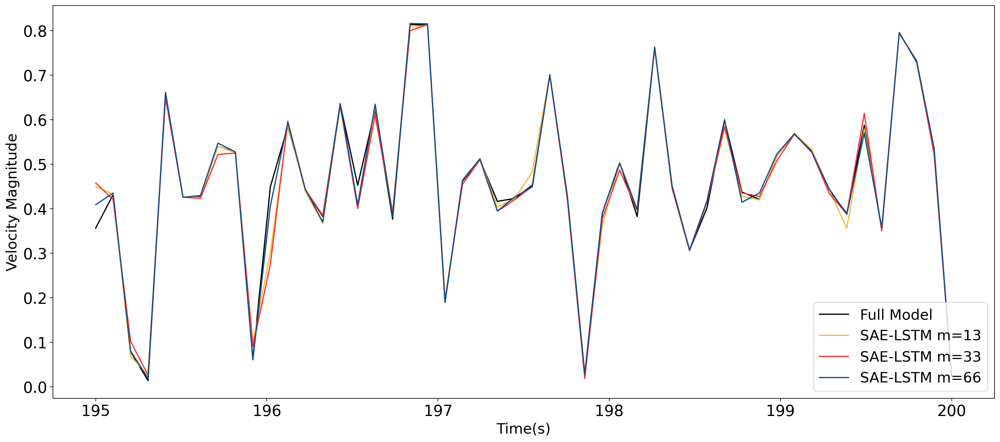

In [9]:
MP4.point_over_time(ori_data02[-50:], rom_data_22[-50:], rom_data_42[-50:], rom_data_62[-50:],26621,'Velocity',195,'lower right',1)

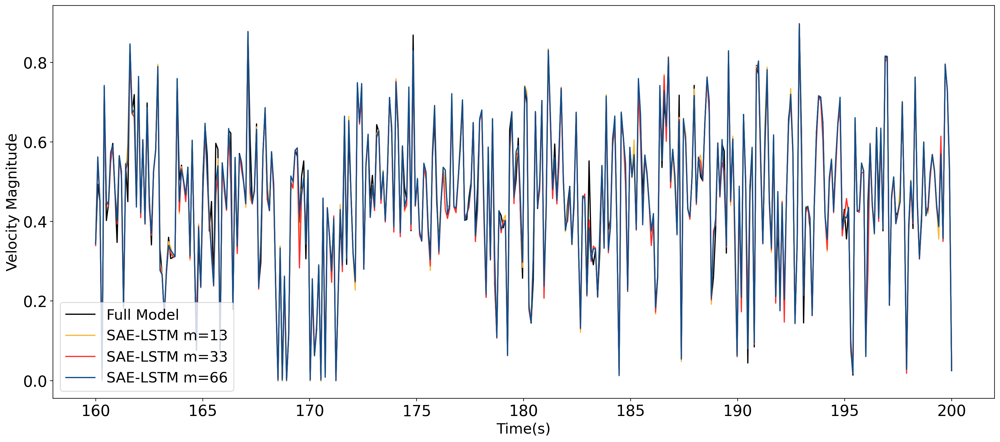

In [10]:
MP4.point_over_time(ori_data02, rom_data_22, rom_data_42, rom_data_62,26621,'Velocity',160,'lower left',1)

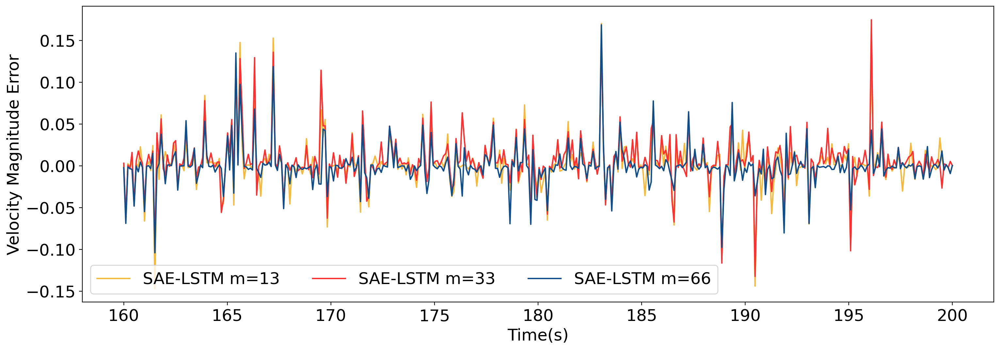

In [12]:
MP4.point_over_time_error(ori_data02, rom_data_22, rom_data_42, rom_data_62,26621,'Velocity',160,'lower left',3)

In [17]:
#Output the prediction results of SAE-LSTM-bunch model 
import numpy as np
import joblib
from dmd_machine import Model_Processing_5inputs_2 as MP
file_name = '/circle-2d-drag_'# name for each vtu file
field_name = 'Velocity2'# name of selected field


In [11]:
encoding_dim=13#[13,33,66]

rom_data_1=scalar_inverse(joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_bunch_"+str(encoding_dim)+".pkl", 'rb')))
print(rom_data_1.shape)
MP.transform_vector(rom_data_1, rom_data_1.shape[0], './data/case1data/VTU_forOutput', './Temp_data_Case1/LSTM_bunch_'+str(encoding_dim),file_name, field_name)



(400, 54536, 2)
start to store data as a new variable
transform succeed


In [18]:
rom_data_2=scalar_inverse(joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_bunch_"+str(33)+".pkl", 'rb')))
print(rom_data_2.shape)
MP.transform_vector(rom_data_2, rom_data_2.shape[0], './data/case1data/VTU_forOutput', './Temp_data_Case1/LSTM_bunch_'+str(33),file_name, field_name)

rom_data_3=scalar_inverse(joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_bunch_"+str(66)+".pkl", 'rb')))
print(rom_data_3.shape)
MP.transform_vector(rom_data_3, rom_data_2.shape[0], './data/case1data/VTU_forOutput', './Temp_data_Case1/LSTM_bunch_'+str(66),file_name, field_name)


(400, 54536, 2)
start to create the destination folder
start to store data as a new variable
transform succeed
(400, 54536, 2)
start to create the destination folder
start to store data as a new variable
transform succeed


# ***Errors***

In [12]:
#Output the errors between the predition of SAE-LSTM-bunch model and ground true snapshots
import joblib
import math
import numpy as np
import pickle

ori_data = np.load(open('./data/case1data/Velocity.npy', 'rb'))[-401:-1]
print(ori_data.shape)

rom_data_0=scalar_inverse(joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_bunch_"+str(13)+".pkl", 'rb')))

rom_data_1=scalar_inverse(joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_bunch_"+str(33)+".pkl", 'rb')))

rom_data_2=scalar_inverse(joblib.load(open("./Temp_data_Case1/reconstructed_signals_lstm_bunch_"+str(66)+".pkl", 'rb')))

rom_error0=ori_data-rom_data_0
rom_error1=ori_data-rom_data_1
rom_error2=ori_data-rom_data_2


(400, 54536, 2)


In [13]:
import numpy as np
from dmd_machine import Model_Processing_5inputs_2 as MP
file_name = '/circle-2d-drag_'# name for each vtu file
field_name = 'Error'# name of selected field

MP.transform_vector(rom_error0, rom_data_0.shape[0], './data/case1data/VTU_forOutput', './Temp_data_Case1/LSTM_bunch_error_'+str(13),file_name, field_name)
MP.transform_vector(rom_error1, rom_data_1.shape[0], './data/case1data/VTU_forOutput', './Temp_data_Case1/LSTM_bunch_error_'+str(33),file_name, field_name)
MP.transform_vector(rom_error2, rom_data_2.shape[0], './data/case1data/VTU_forOutput', './Temp_data_Case1/LSTM_bunch_error_'+str(66),file_name, field_name)



start to create the destination folder
start to store data as a new variable
transform succeed
start to create the destination folder
start to store data as a new variable
transform succeed
start to create the destination folder
start to store data as a new variable
transform succeed
